- regular bayes between 100-1000
- kappa now float
- trade only on state shifts

In [1]:
# General
import numpy as np
import pandas as pd
import os, sys
import optuna

# For data prep and pre-processing
from jumpmodels.utils import filter_date_range 
from jumpmodels.preprocess import StandardScalerPD, DataClipperStd
from sklearn.preprocessing import StandardScaler

# For model fit and prediction
from joblib import Parallel, delayed # allows parallel grid search on all 4 cores
from jumpmodels.sparse_jump import SparseJumpModel

# For plotting
from jumpmodels.plot import plot_regimes_and_cumret, plot_cumret
import matplotlib.pyplot as plt
import matplotlib as mpl    
mpl.rcParams["text.usetex"] = False


# Portfolio allocation
from pypfopt.black_litterman import BlackLittermanModel
from pypfopt.efficient_frontier import EfficientFrontier

sys.path.append('/Users/victor/Documents/thesis_vri_vp/vic_new')         # for mac
#sys.path.append('C:\\Users\\victo\\git_new\\thesis_vri_vp\\vic_new')      # for windows
from feature_set_v2 import MergedDataLoader 




In [2]:
# ---------------------------------------------------------------------
# 1) Purged/embargoed window function
# ---------------------------------------------------------------------
def get_train_val_windows(
        current_date, 
        full_data, 
        min_train_years=8,
        max_train_years=12, 
        val_years=3,
        initial_train_start=None,
        gap_days=3                                      # gap_days: number of days to exclude at the train/validation boundary (purge/embargo) to avoid look‑ahead; set to 0 to disable
    ):
    # 1) Validation window
    val_end   = current_date
    val_start = val_end - pd.DateOffset(years=val_years)
    
    # 2) Train ends just before validation
    train_end = val_start - pd.DateOffset(days=1)
    
    # 3) Max‐length training start
    train_start_candidate = train_end - pd.DateOffset(years=max_train_years)
    if initial_train_start is not None:
        earliest = pd.to_datetime(initial_train_start)
        train_start_candidate = max(train_start_candidate, earliest)
    
    # 4) Enforce min‐length
    if (train_end - train_start_candidate) < pd.Timedelta(days=365.25 * min_train_years):
        train_start_candidate = train_end - pd.DateOffset(years=min_train_years)
        if initial_train_start is not None:
            train_start_candidate = max(train_start_candidate, earliest)
    
    idx       = full_data.index
    train_idx = idx[(idx >= train_start_candidate) & (idx <= train_end)]
    val_idx   = idx[(idx >= val_start)           & (idx <= val_end)]
    
    # 5) Purge/embargo
    if gap_days > 0:
        if len(train_idx) > gap_days:
            train_idx = train_idx[:-gap_days]
        if len(val_idx)   > gap_days:
            val_idx   = val_idx[gap_days:]
    
    if train_idx.empty or val_idx.empty:
        raise ValueError(
            f"No data for train [{train_start_candidate.date()}-{train_end.date()}] "
            f"or val [{val_start.date()}-{val_end.date()}] after {gap_days}-day gap"
        )
    
    return train_idx[0], train_idx[-1], val_idx[0], val_idx[-1]


# ---------------------------------------------------------------------
# 2) Optuna objective & wrapper
# ---------------------------------------------------------------------
# 1) New evaluator that fits one model & returns Sharpe:
# ------------------------------------------------------------------
# Trade-only-at-state-shift evaluator
def evaluate_sjm_sharpe(
    lam, kappa,
    X_tr_s, X_vl_s,
    ar_tr, ar_vl,
    cost_per_100pct, annual_threshold
):
    model = SparseJumpModel(
        n_components=2,
        max_feats=int(kappa**2),
        jump_penalty=lam,
        cont=False,
        max_iter=30
    )
    model.fit(X_tr_s, ret_ser=ar_tr, sort_by="cumret")

    # 1) Online state predictions
    val_states = model.predict_online(X_vl_s)

    # 2) Flag re-hedge days  – True where *state* flips vs. yesterday
    shift = val_states.ne(val_states.shift()).fillna(True)

    # 3) P&L with trades **only** on those days
    pnl = np.zeros(len(val_states))
    prev_pos = 0.0
    for t, st in enumerate(val_states):
        if shift.iloc[t]:                         # rebalance
            exp_ann = model.ret_[st] * 252
            if   exp_ann >  annual_threshold: pos =  1.0
            elif exp_ann < -annual_threshold: pos = -1.0
            else:                                 pos = exp_ann / annual_threshold
        else:                                     # carry position
            pos = prev_pos

        pnl[t] = prev_pos * ar_vl.iloc[t] - abs(pos - prev_pos) * cost_per_100pct
        prev_pos = pos

    sharpe = pnl.mean() / pnl.std(ddof=1) * np.sqrt(252)
    return sharpe


# 2) Rewrite your Optuna objective to use it:
def optuna_objective(
    trial,
    X_tr_s, X_vl_s,
    ar_tr, ar_vl,
    cost_per_100pct, annual_threshold
):
    lam   = trial.suggest_float("lambda", 10**2, 10**3)
    kappa = trial.suggest_float("kappa", 1, np.sqrt(17))
    return evaluate_sjm_sharpe(
        lam, kappa,
        X_tr_s, X_vl_s,
        ar_tr, ar_vl,
        cost_per_100pct, annual_threshold
    )

# 3) In your Bayesian wrapper, return the study:
def bayesian_hyperparam_search(
    X_tr_s, X_vl_s,
    ar_tr, ar_vl,
    cost_per_100pct=0.0007,
    annual_threshold=0.05,
    n_trials=30
):
    study = optuna.create_study(sampler=optuna.samplers.TPESampler(seed=42), direction="maximize")
    study.optimize(
        lambda t: optuna_objective(
            t, X_tr_s, X_vl_s, ar_tr, ar_vl,
            cost_per_100pct, annual_threshold
        ),
        n_trials=n_trials
    )
    return study


# ---------------------------------------------------------------------
# 3) Rolling CV + final‑model fit using Optuna
# ---------------------------------------------------------------------
def rolling_time_series_cv_sjm_long_short_optimized(
    X_train, X_val,
    factor_returns_train, factor_returns_val,
    market_returns_train, market_returns_val,
    cost_per_100pct=0.0007,
    annual_threshold=0.05,
    n_trials=30
):
    # --- align indices & build active returns ---
    tr_idx = X_train.index.intersection(factor_returns_train.index).intersection(market_returns_train.index)
    vl_idx = X_val.index.intersection(factor_returns_val.index).intersection(market_returns_val.index)
    
    X_tr = X_train.loc[tr_idx]
    X_vl = X_val.loc[vl_idx]
    ar_tr = factor_returns_train.loc[tr_idx] - market_returns_train.loc[tr_idx]
    ar_vl = factor_returns_val.loc[vl_idx]     - market_returns_val.loc[vl_idx]
    
    # --- preprocess ---
    clipper = DataClipperStd(mul=3.0)
    scaler  = StandardScaler()
    
    X_tr_s = pd.DataFrame(
        scaler.fit_transform(clipper.fit_transform(X_tr)),
        index=X_tr.index, columns=X_tr.columns
    )
    X_vl_s = pd.DataFrame(
        scaler.transform(clipper.transform(X_vl)),
        index=X_vl.index, columns=X_vl.columns
    )
    
    # --- Bayesian search ---
    study = bayesian_hyperparam_search(
        X_tr_s, X_vl_s, ar_tr, ar_vl,
        cost_per_100pct, annual_threshold,
        n_trials
    )
    lam, kappa = study.best_params["lambda"], study.best_params["kappa"]
    best_sharpe = study.best_value
    print(f"Optuna best λ={lam:.4f}, κ={kappa}, Sharpe={best_sharpe:.4f}")
    
    # --- fit final SJM on the full train window ---
    model = SparseJumpModel(
        n_components=2,
        max_feats=int(kappa**2),
        jump_penalty=lam,
        cont=False,
        max_iter=30
    )
    model.fit(X_tr_s, ret_ser=ar_tr, sort_by="cumret")
    
    return {
        "best_lambda": lam,
        "best_kappa":  kappa,
        "best_sharpe": best_sharpe,
        "best_model":  model,
        "results_array": None,
        "study": study
    }

In [3]:
# ---------------------------------------------------------------------
# 4) Updated cross‑validation module (run_cv)
# ---------------------------------------------------------------------
def run_cv(
    factors,
    factor_data_dict,
    cv_dates,
    *,
    min_train_years=8,
    max_train_years=12,
    val_years=3,
    initial_train_start=None,
    save_path="0505_7bps_100-1000_tradeshift.parquet",
    make_plots=True,
    cost_per_100pct=0.0007,
    annual_threshold=0.05,
    n_trials=30
):
    records = []
    evolution_plotbuf = []

    for cv_end in cv_dates:
        for fac in factors:
            X       = factor_data_dict[fac]["X"]
            fac_ret = factor_data_dict[fac]["fac_ret"]
            mkt_ret = factor_data_dict[fac]["mkt_ret"]

            # get purged train/val windows
            train_start, train_end, val_start, val_end = get_train_val_windows(
                cv_end, X,
                min_train_years=min_train_years,
                max_train_years=max_train_years,
                val_years=val_years,
                initial_train_start=initial_train_start,
                gap_days=3
            )

            # slice data
            X_train  = filter_date_range(X, train_start, train_end)
            X_val    = filter_date_range(X, val_start,   val_end)
            fr_train = filter_date_range(fac_ret, train_start, train_end)
            fr_val   = filter_date_range(fac_ret, val_start,   val_end)
            mr_train = filter_date_range(mkt_ret, train_start, train_end)
            mr_val   = filter_date_range(mkt_ret, val_start,   val_end)

            # run Optuna‐powered CV
            res = rolling_time_series_cv_sjm_long_short_optimized(
                X_train=X_train,
                X_val=X_val,
                factor_returns_train=fr_train,
                factor_returns_val=fr_val,
                market_returns_train=mr_train,
                market_returns_val=mr_val,
                cost_per_100pct=cost_per_100pct,
                annual_threshold=annual_threshold,
                n_trials=n_trials
            )

            # store results
            records.append({
                "date": cv_end,
                "factor": fac,
                "best_lambda": res["best_lambda"],
                "best_kappa":  res["best_kappa"]
            })
            evolution_plotbuf.append({
                "date": cv_end,
                "factor": fac,
                "lambda": res["best_lambda"],
                "kappa":  res["best_kappa"]
            })

            # per‐fold Optuna scatter plot
            if make_plots:
                trials = res["study"].trials
                df_t = pd.DataFrame([
                    {"lambda": t.params["lambda"],
                     "kappa":  t.params["kappa"],
                     "value":  t.value}
                    for t in trials
                ])
                plt.figure(figsize=(8,5))
                sc = plt.scatter(
                    df_t["lambda"],
                    df_t["value"],
                    c=df_t["kappa"].astype(float),
                    cmap="viridis",
                    alpha=0.8
                )
                plt.xscale("log")
                plt.axvline(res["best_lambda"], ls="--", c="r", alpha=0.6)
                plt.colorbar(sc, label='$\\kappa$')
                plt.xlabel("'$\\lambda$' (log scale)")
                plt.ylabel("Validation Sharpe")
                plt.title(f"{fac} | CV cutoff {cv_end.date()} - Optuna trials")
                plt.grid(True, ls=":")
                plt.tight_layout()
                plt.show()

    # assemble and save
    cv_df = pd.DataFrame(records).sort_values(["factor", "date"])
    if save_path:
        cv_df.to_parquet(save_path)

    # overall λ/κ evolution
    if make_plots:
        evo = pd.DataFrame(evolution_plotbuf)
        for fac in factors:
            sub = evo[evo["factor"] == fac].sort_values("date")
            fig, ax1 = plt.subplots(figsize=(9,5))
            ax1.plot(sub["date"], sub["lambda"], marker="o", label='$\\lambda$')
            ax1.set_ylabel('$\\lambda$', color="tab:blue")
            ax1.tick_params(axis='y', labelcolor='tab:blue')
            ax2 = ax1.twinx()
            ax2.plot(sub["date"], sub["kappa"], marker="x", ls="--", color="tab:red", label='$\\kappa$')
            ax2.set_ylabel('$\\kappa$', color="tab:red")
            ax2.tick_params(axis='y', labelcolor='tab:red')
            ax1.set_xlabel("CV end-date")
            ax1.set_title(f"{fac} — hyperparameter evolution")
            ax1.grid(True, ls=":")
            ax1.legend(loc="upper left")
            ax2.legend(loc="upper right")
            plt.tight_layout()
            plt.show()

    return cv_df


[I 2025-05-05 23:30:36,563] A new study created in memory with name: no-name-aeae5504-a8c2-4153-a044-ead65b5cabea
[I 2025-05-05 23:30:38,088] Trial 0 finished with value: 0.05732480826289449 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.05732480826289449.
[I 2025-05-05 23:30:38,401] Trial 1 finished with value: 0.05732480826289462 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.05732480826289462.
[I 2025-05-05 23:30:40,491] Trial 2 finished with value: 0.057324808262894454 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.05732480826289462.
[I 2025-05-05 23:30:42,707] Trial 3 finished with value: 0.00868759192258834 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.05732480826289462.
[I 2025-05-05 23:30:44,179] Trial 4 finished with value: 0.05732480826289449 a

Optuna best λ=743.9666, κ=1.0370500401061697, Sharpe=0.1523


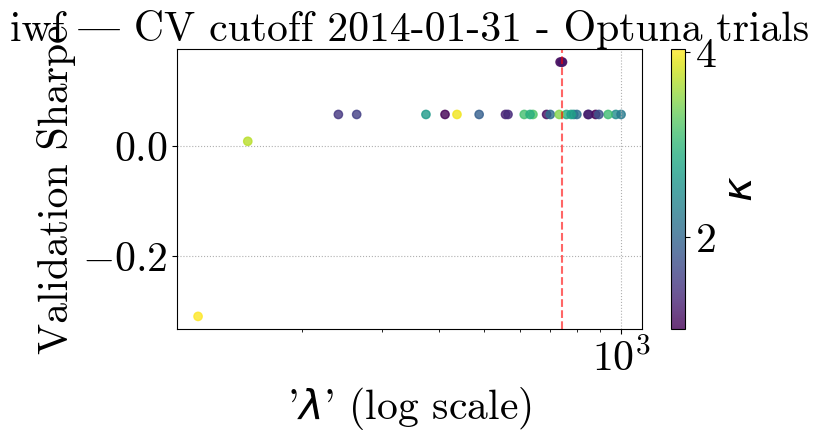

[I 2025-05-05 23:31:05,146] A new study created in memory with name: no-name-8483528a-f951-4e82-9634-ce4e2c861ca6
[I 2025-05-05 23:31:06,125] Trial 0 finished with value: 0.7813438693941596 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.7813438693941596.
[I 2025-05-05 23:31:07,202] Trial 1 finished with value: 0.7813438693941596 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.7813438693941596.
[I 2025-05-05 23:31:08,587] Trial 2 finished with value: 0.7813438693941596 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.7813438693941596.
[I 2025-05-05 23:31:10,186] Trial 3 finished with value: 0.7815501709432975 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.7815501709432975.
[I 2025-05-05 23:31:11,282] Trial 4 finished with value: 0.7813438693941596 and paramet

Optuna best λ=152.2753, κ=3.705159593645523, Sharpe=0.7816


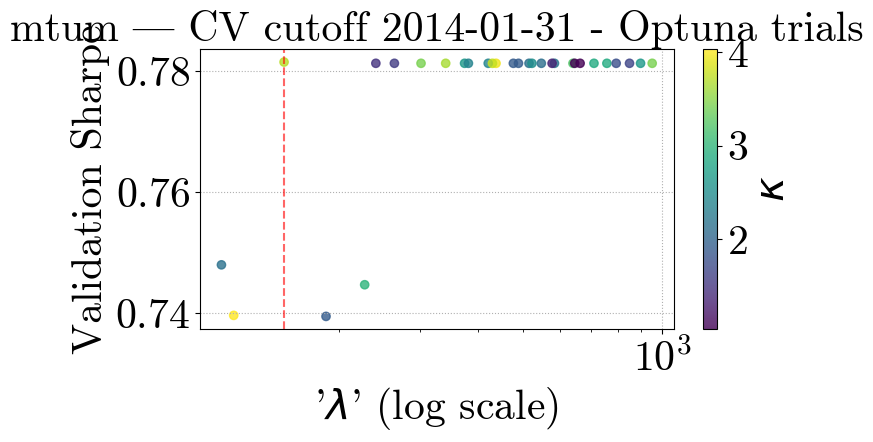

[I 2025-05-05 23:31:40,973] A new study created in memory with name: no-name-7e62c1fe-b0f9-4746-a9ca-19e3704bc2ce
[I 2025-05-05 23:31:41,978] Trial 0 finished with value: -0.6799283950276834 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.6799283950276834.
[I 2025-05-05 23:31:42,940] Trial 1 finished with value: -0.7074135081834746 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.6799283950276834.
[I 2025-05-05 23:31:44,384] Trial 2 finished with value: -0.2738535848505729 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.2738535848505729.
[I 2025-05-05 23:31:45,552] Trial 3 finished with value: -0.32132107627903733 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 2 with value: -0.2738535848505729.
[I 2025-05-05 23:31:46,504] Trial 4 finished with value: -0.7074135081834746 a

Optuna best λ=980.1965, κ=1.0187298358271706, Sharpe=0.6913


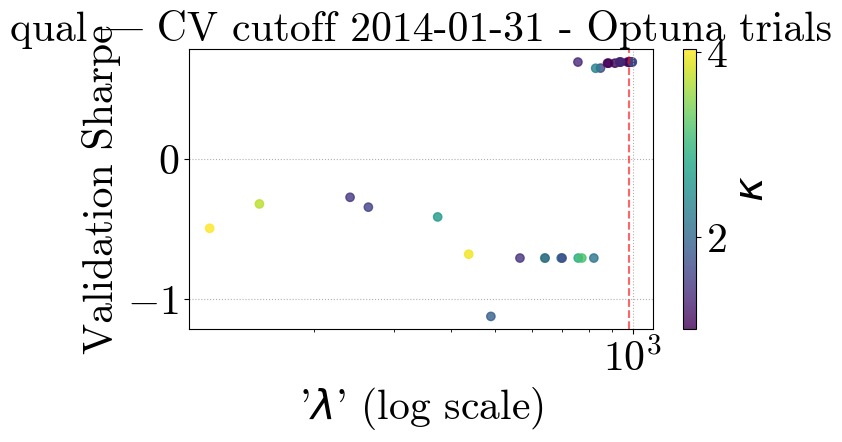

[I 2025-05-05 23:32:08,716] A new study created in memory with name: no-name-3759144c-b1bc-45f7-8506-c8037bba9b07
[I 2025-05-05 23:32:10,001] Trial 0 finished with value: 0.13454484712566084 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.13454484712566084.
[I 2025-05-05 23:32:10,950] Trial 1 finished with value: -0.5055828278341848 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.13454484712566084.
[I 2025-05-05 23:32:12,372] Trial 2 finished with value: -0.11987145917221595 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.13454484712566084.
[I 2025-05-05 23:32:13,744] Trial 3 finished with value: -0.07514061758546195 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.13454484712566084.
[I 2025-05-05 23:32:14,998] Trial 4 finished with value: 0.0671755454838337 a

Optuna best λ=479.5722, κ=3.8163615329242235, Sharpe=0.1632


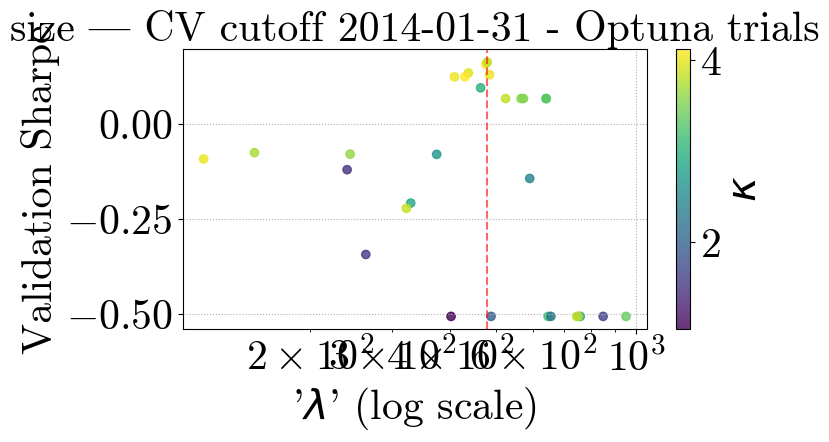

[I 2025-05-05 23:32:47,769] A new study created in memory with name: no-name-9850862e-4e25-4957-b8e4-5c3a1284667e
[I 2025-05-05 23:32:49,617] Trial 0 finished with value: -0.3401217324741716 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.3401217324741716.
[I 2025-05-05 23:32:51,256] Trial 1 finished with value: -0.3401217324741716 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.3401217324741716.
[I 2025-05-05 23:32:53,524] Trial 2 finished with value: -0.37441674803787384 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.3401217324741716.
[I 2025-05-05 23:32:54,954] Trial 3 finished with value: 0.014790242093431792 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.014790242093431792.
[I 2025-05-05 23:32:56,723] Trial 4 finished with value: -0.3401217324741716

Optuna best λ=152.2753, κ=3.705159593645523, Sharpe=0.0148


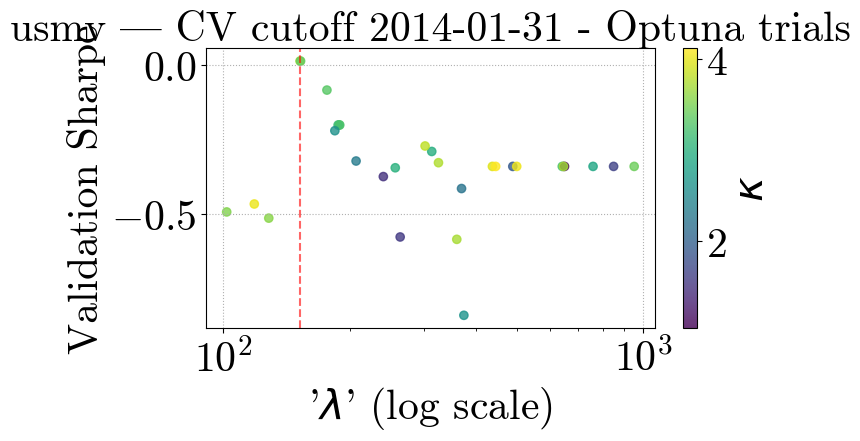

[I 2025-05-05 23:33:36,164] A new study created in memory with name: no-name-224ed4d3-9cc1-403a-9f2c-3496fd76d3a2
[I 2025-05-05 23:33:37,516] Trial 0 finished with value: 0.22646645637872803 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.22646645637872803.
[I 2025-05-05 23:33:38,418] Trial 1 finished with value: 0.3296413739552029 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.3296413739552029.
[I 2025-05-05 23:33:39,596] Trial 2 finished with value: 0.33523213479753594 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.33523213479753594.
[I 2025-05-05 23:33:41,232] Trial 3 finished with value: 0.881393036495543 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.881393036495543.
[I 2025-05-05 23:33:42,142] Trial 4 finished with value: 0.28190040175338793 and para

Optuna best λ=156.6192, κ=3.7522741465781455, Sharpe=0.9213


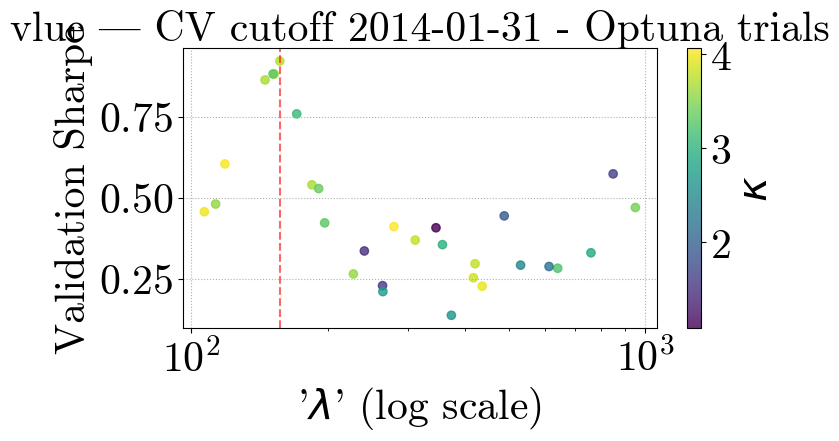

[I 2025-05-05 23:34:18,306] A new study created in memory with name: no-name-effd81f0-a338-4f43-82f2-136b13da8849
[I 2025-05-05 23:34:20,186] Trial 0 finished with value: -0.1030590822777392 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.1030590822777392.
[I 2025-05-05 23:34:21,864] Trial 1 finished with value: -0.1030590822777392 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.1030590822777392.
[I 2025-05-05 23:34:24,059] Trial 2 finished with value: -0.03768342936376326 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.03768342936376326.
[I 2025-05-05 23:34:26,287] Trial 3 finished with value: 0.05330812043733071 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.05330812043733071.
[I 2025-05-05 23:34:28,039] Trial 4 finished with value: -0.1030590822777392 

Optuna best λ=197.1081, κ=3.753024772203478, Sharpe=0.1802


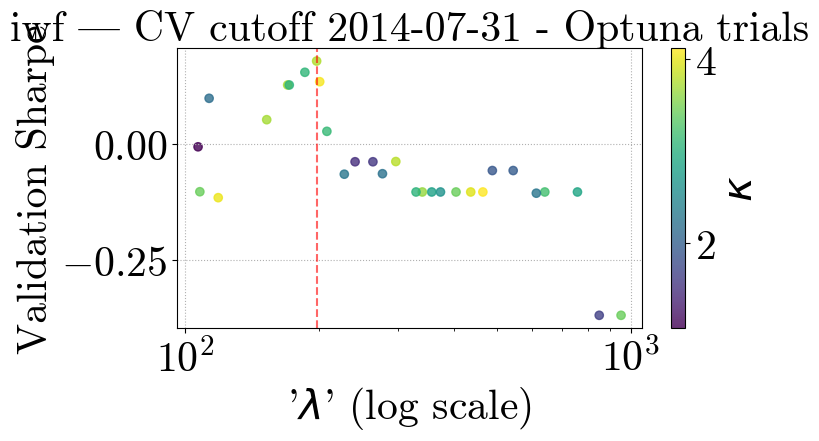

[I 2025-05-05 23:35:14,092] A new study created in memory with name: no-name-a916d9f3-5def-41bd-938b-32349ce2f8bc
[I 2025-05-05 23:35:15,274] Trial 0 finished with value: 0.45743733724925345 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.45743733724925345.
[I 2025-05-05 23:35:16,513] Trial 1 finished with value: 0.45743733724925345 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.45743733724925345.
[I 2025-05-05 23:35:18,185] Trial 2 finished with value: 0.5268857845502665 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.5268857845502665.
[I 2025-05-05 23:35:20,308] Trial 3 finished with value: 0.41708720302568664 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.5268857845502665.
[I 2025-05-05 23:35:21,496] Trial 4 finished with value: 0.45743733724925345 and p

Optuna best λ=240.4168, κ=1.487187364027523, Sharpe=0.5269


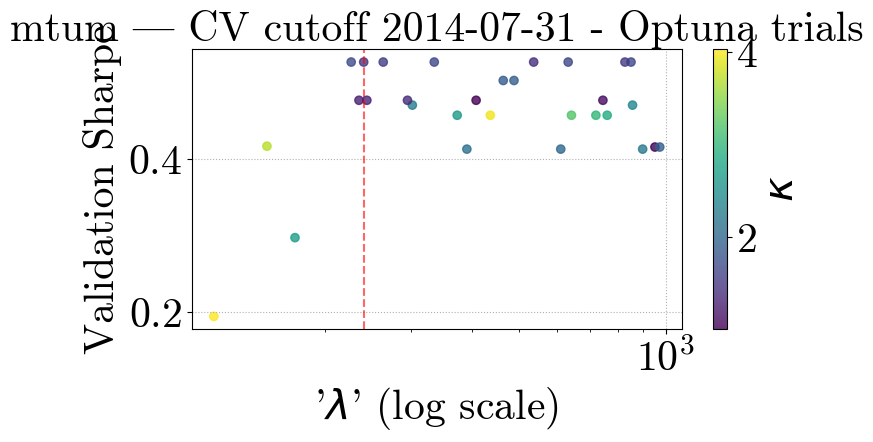

[I 2025-05-05 23:35:55,500] A new study created in memory with name: no-name-f593164f-2eaf-4e0b-b0a7-b9ccbefeb92f
[I 2025-05-05 23:35:56,580] Trial 0 finished with value: 0.05679235807031557 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.05679235807031557.
[I 2025-05-05 23:35:57,504] Trial 1 finished with value: 0.09308100459810448 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.09308100459810448.
[I 2025-05-05 23:35:58,990] Trial 2 finished with value: 0.21069938104527436 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.21069938104527436.
[I 2025-05-05 23:36:00,396] Trial 3 finished with value: 0.2311119616974972 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.2311119616974972.
[I 2025-05-05 23:36:01,406] Trial 4 finished with value: 0.09308100459810448 and 

Optuna best λ=192.0261, κ=2.8939565129180003, Sharpe=0.3276


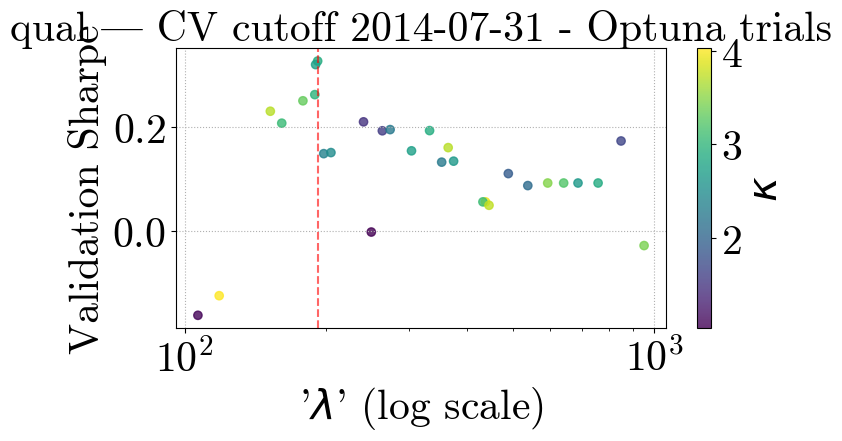

[I 2025-05-05 23:36:35,828] A new study created in memory with name: no-name-c2145bf4-9bcb-4107-9442-75476ba6c07f
[I 2025-05-05 23:36:37,271] Trial 0 finished with value: 0.13652619479596542 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.13652619479596542.
[I 2025-05-05 23:36:38,637] Trial 1 finished with value: 0.026888247492647913 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.13652619479596542.
[I 2025-05-05 23:36:40,560] Trial 2 finished with value: 0.051132614238443355 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.13652619479596542.
[I 2025-05-05 23:36:41,938] Trial 3 finished with value: -0.08401842194734795 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.13652619479596542.
[I 2025-05-05 23:36:43,314] Trial 4 finished with value: 0.02688824749264791

Optuna best λ=495.0838, κ=2.0743178083052256, Sharpe=0.3185


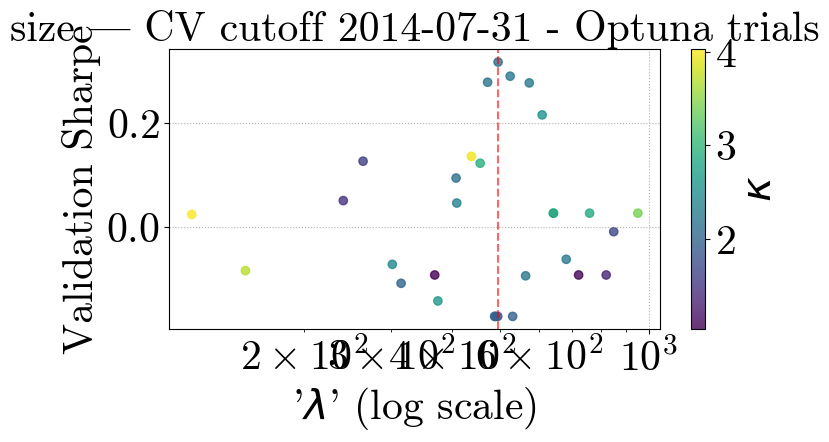

[I 2025-05-05 23:37:19,835] A new study created in memory with name: no-name-f71d437b-b456-46b7-a0bf-7b3f92654024
[I 2025-05-05 23:37:21,749] Trial 0 finished with value: 0.43495673964660914 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.43495673964660914.
[I 2025-05-05 23:37:22,670] Trial 1 finished with value: 0.300773463184889 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.43495673964660914.
[I 2025-05-05 23:37:24,848] Trial 2 finished with value: 0.3084638294680348 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.43495673964660914.
[I 2025-05-05 23:37:26,658] Trial 3 finished with value: 0.37410010299559904 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.43495673964660914.
[I 2025-05-05 23:37:27,586] Trial 4 finished with value: 0.300773463184889 and par

Optuna best λ=516.1101, κ=2.194965549191953, Sharpe=0.5556


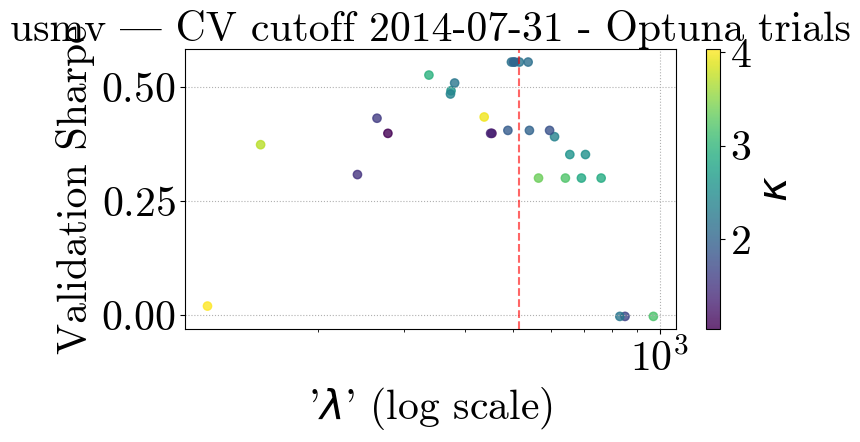

[I 2025-05-05 23:37:59,107] A new study created in memory with name: no-name-c4787533-4c63-4ad8-94f3-6af12472db89
[I 2025-05-05 23:38:00,699] Trial 0 finished with value: 0.9414570074643738 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.9414570074643738.
[I 2025-05-05 23:38:02,042] Trial 1 finished with value: 1.4372434642903702 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: 1.4372434642903702.
[I 2025-05-05 23:38:03,203] Trial 2 finished with value: 1.1693741627363512 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: 1.4372434642903702.
[I 2025-05-05 23:38:04,538] Trial 3 finished with value: 1.0882900963669766 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 1 with value: 1.4372434642903702.
[I 2025-05-05 23:38:05,885] Trial 4 finished with value: 1.431796277557332 and paramete

Optuna best λ=847.6063, κ=1.0321585110262315, Sharpe=1.4741


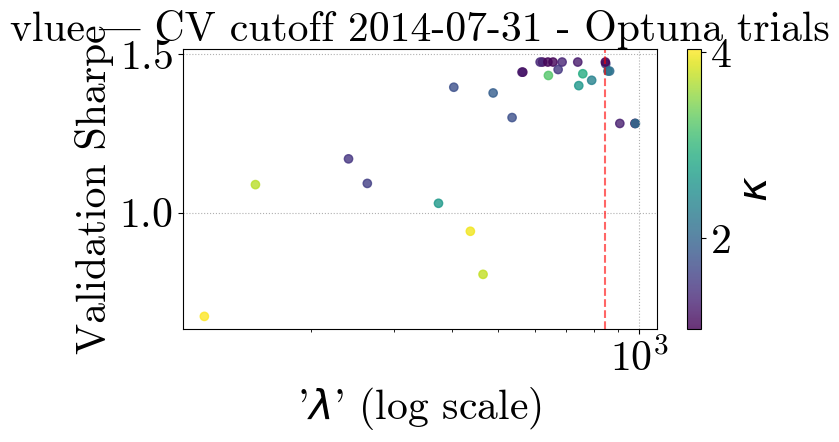

[I 2025-05-05 23:38:29,516] A new study created in memory with name: no-name-bf6ceda4-1ec5-4592-a461-1dd985207136
[I 2025-05-05 23:38:31,170] Trial 0 finished with value: 0.19686227402891343 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.19686227402891343.
[I 2025-05-05 23:38:31,501] Trial 1 finished with value: -0.21918576631522815 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.19686227402891343.
[I 2025-05-05 23:38:33,909] Trial 2 finished with value: 0.19686227402891338 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.19686227402891343.
[I 2025-05-05 23:38:35,985] Trial 3 finished with value: 0.19686227402891338 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.19686227402891343.
[I 2025-05-05 23:38:37,464] Trial 4 finished with value: 0.19686227402891343 a

Optuna best λ=755.0669, κ=3.7101790746554277, Sharpe=0.5926


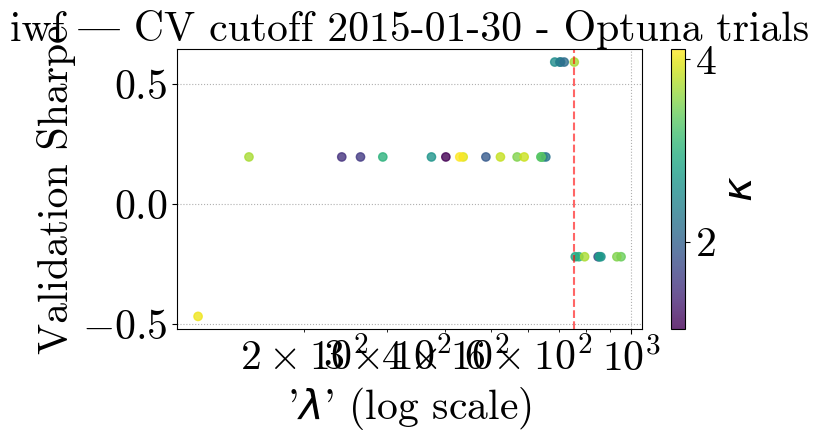

[I 2025-05-05 23:39:05,863] A new study created in memory with name: no-name-9c7f188c-782c-4ce7-9a9b-795059e880be
[I 2025-05-05 23:39:07,014] Trial 0 finished with value: 1.0137813235343276 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.0137813235343276.
[I 2025-05-05 23:39:08,181] Trial 1 finished with value: 1.0137813235343276 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 1.0137813235343276.
[I 2025-05-05 23:39:09,938] Trial 2 finished with value: 1.0137813235343276 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 1.0137813235343276.
[I 2025-05-05 23:39:11,815] Trial 3 finished with value: 1.0137813235343276 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 0 with value: 1.0137813235343276.
[I 2025-05-05 23:39:13,071] Trial 4 finished with value: 1.0137813235343276 and paramet

Optuna best λ=488.7505, κ=1.9095393660962992, Sharpe=1.0138


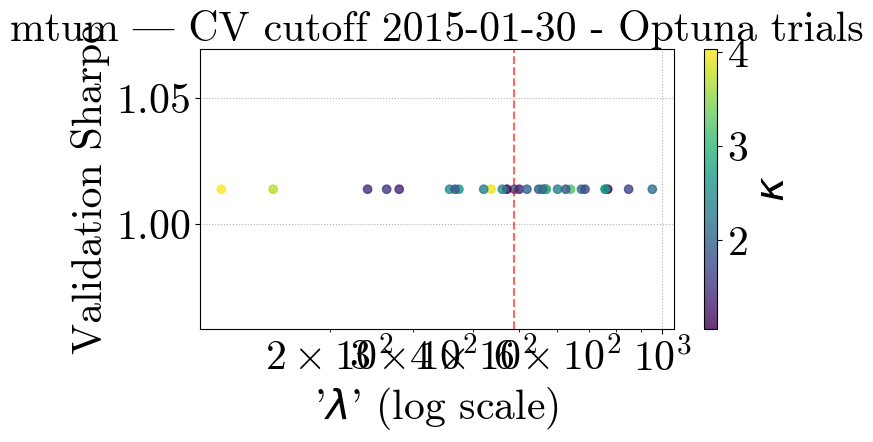

[I 2025-05-05 23:39:46,282] A new study created in memory with name: no-name-f5949bb8-6902-428e-a1a5-a1013fc59341
[I 2025-05-05 23:39:47,520] Trial 0 finished with value: -0.27907033482465 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.27907033482465.
[I 2025-05-05 23:39:48,632] Trial 1 finished with value: -0.27907033482465 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.27907033482465.
[I 2025-05-05 23:39:54,060] Trial 2 finished with value: 0.25886976853627397 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.25886976853627397.
[I 2025-05-05 23:39:55,505] Trial 3 finished with value: -0.2790703348246499 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.25886976853627397.
[I 2025-05-05 23:39:56,666] Trial 4 finished with value: -0.27907033482465 and paramete

Optuna best λ=818.7878, κ=2.0161336400150702, Sharpe=0.5602


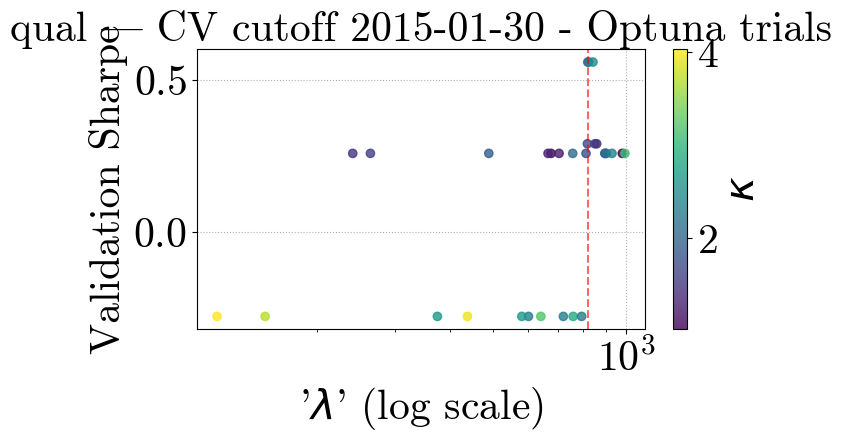

[I 2025-05-05 23:40:30,402] A new study created in memory with name: no-name-78af86fb-584b-4889-8b17-ac2d9b90176a
[I 2025-05-05 23:40:31,541] Trial 0 finished with value: -0.8034054198786064 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.8034054198786064.
[I 2025-05-05 23:40:32,952] Trial 1 finished with value: -0.6053110030936105 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.6053110030936105.
[I 2025-05-05 23:40:34,728] Trial 2 finished with value: -0.8107643856959496 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.6053110030936105.
[I 2025-05-05 23:40:36,154] Trial 3 finished with value: -0.4139564195006075 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: -0.4139564195006075.
[I 2025-05-05 23:40:37,552] Trial 4 finished with value: -0.6053110030936105 an

Optuna best λ=113.0654, κ=3.834733028321934, Sharpe=-0.3078


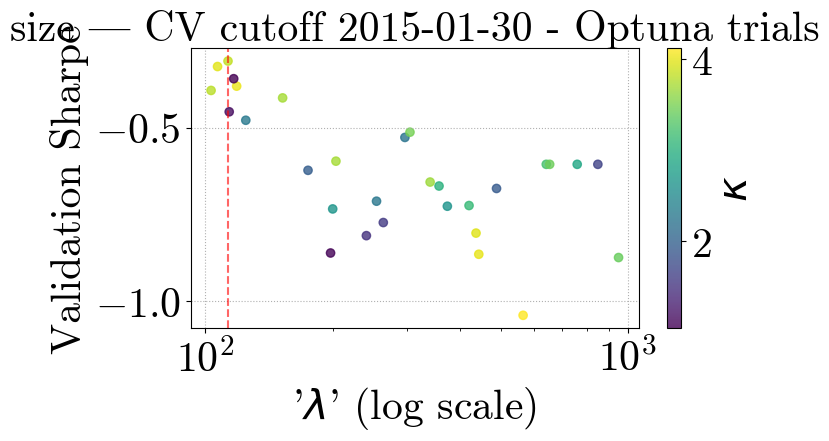

[I 2025-05-05 23:41:18,251] A new study created in memory with name: no-name-afb6bd9b-d226-4b57-82bf-cd26ce4d0313
[I 2025-05-05 23:41:19,415] Trial 0 finished with value: -0.18789106432190336 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.18789106432190336.
[I 2025-05-05 23:41:20,547] Trial 1 finished with value: -0.18789106432190336 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.18789106432190336.
[I 2025-05-05 23:41:22,305] Trial 2 finished with value: -0.18789106432190336 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.18789106432190336.
[I 2025-05-05 23:41:23,893] Trial 3 finished with value: -0.23315335625695716 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.18789106432190336.
[I 2025-05-05 23:41:24,986] Trial 4 finished with value: -0.18789106432

Optuna best λ=849.1984, κ=1.6631574710979753, Sharpe=0.1785


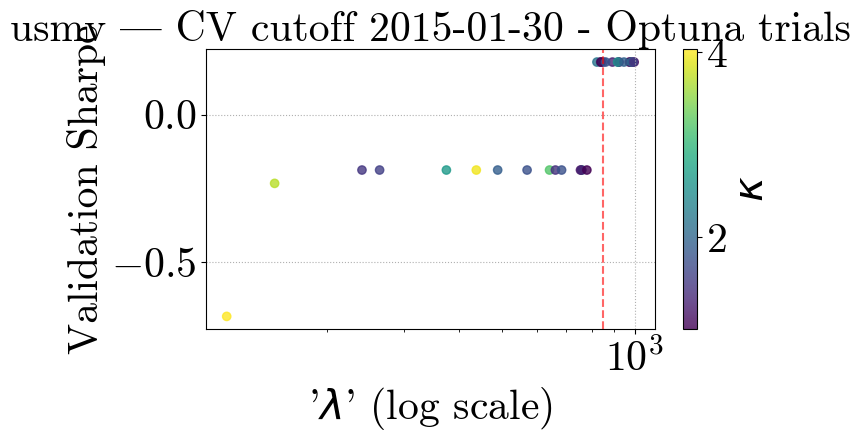

[I 2025-05-05 23:41:44,540] A new study created in memory with name: no-name-0025f76d-4d60-43a1-9743-f7a956524304
[I 2025-05-05 23:41:45,696] Trial 0 finished with value: 1.0386013329032469 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.0386013329032469.
[I 2025-05-05 23:41:46,830] Trial 1 finished with value: 1.2934118158025212 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: 1.2934118158025212.
[I 2025-05-05 23:41:48,193] Trial 2 finished with value: 1.160437364070994 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: 1.2934118158025212.
[I 2025-05-05 23:41:49,632] Trial 3 finished with value: 0.9379917772221432 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 1 with value: 1.2934118158025212.
[I 2025-05-05 23:41:50,648] Trial 4 finished with value: 1.2795052287863842 and paramete

Optuna best λ=758.7945, κ=2.869673679819506, Sharpe=1.2934


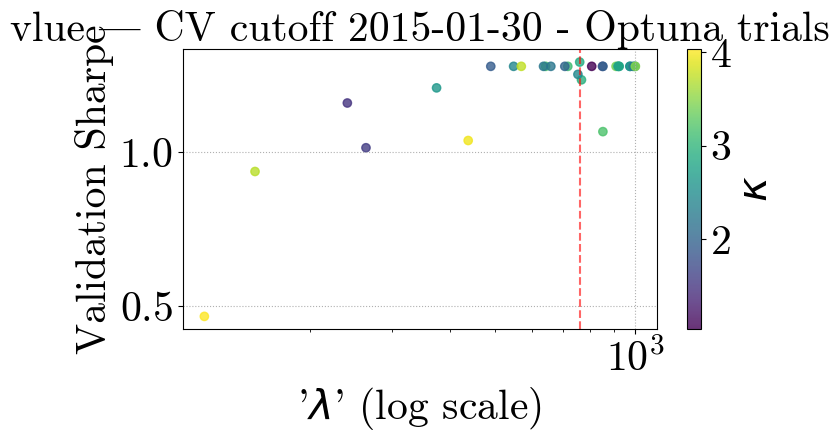

[I 2025-05-05 23:42:15,608] A new study created in memory with name: no-name-cb0b6bc9-5368-4ff5-bad7-18998d67df7a
[I 2025-05-05 23:42:17,127] Trial 0 finished with value: 0.28293550918400984 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.28293550918400984.
[I 2025-05-05 23:42:17,428] Trial 1 finished with value: 0.28293550918400984 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.28293550918400984.
[I 2025-05-05 23:42:22,912] Trial 2 finished with value: 0.28293550918401 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.28293550918401.
[I 2025-05-05 23:42:25,940] Trial 3 finished with value: -0.30637471785508796 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.28293550918401.
[I 2025-05-05 23:42:27,429] Trial 4 finished with value: 0.28293550918400984 and parame

Optuna best λ=240.4168, κ=1.487187364027523, Sharpe=0.2829


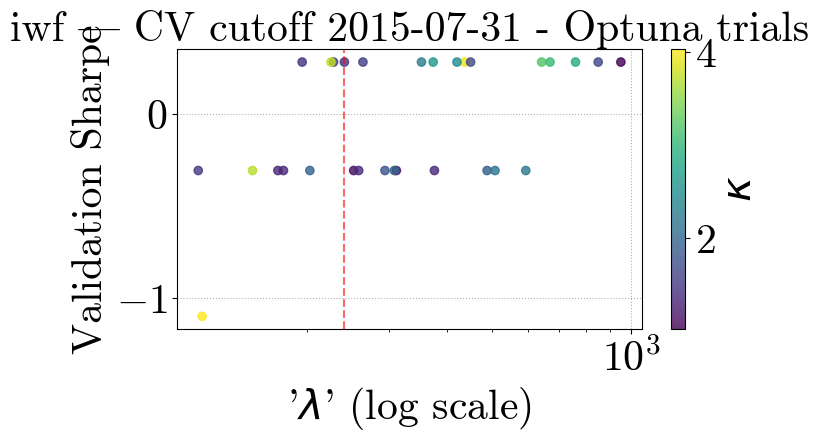

[I 2025-05-05 23:43:26,467] A new study created in memory with name: no-name-923e747d-5b9d-4a05-b5bd-bc63728cf707
[I 2025-05-05 23:43:27,765] Trial 0 finished with value: 1.0018655564685757 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.0018655564685757.
[I 2025-05-05 23:43:29,129] Trial 1 finished with value: 1.0018655564685757 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 1.0018655564685757.
[I 2025-05-05 23:43:30,509] Trial 2 finished with value: 1.0018655564685761 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 1.0018655564685761.
[I 2025-05-05 23:43:32,696] Trial 3 finished with value: 1.0018655564685761 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 2 with value: 1.0018655564685761.
[I 2025-05-05 23:43:34,120] Trial 4 finished with value: 1.0018655564685757 and paramet

Optuna best λ=240.4168, κ=1.487187364027523, Sharpe=1.0019


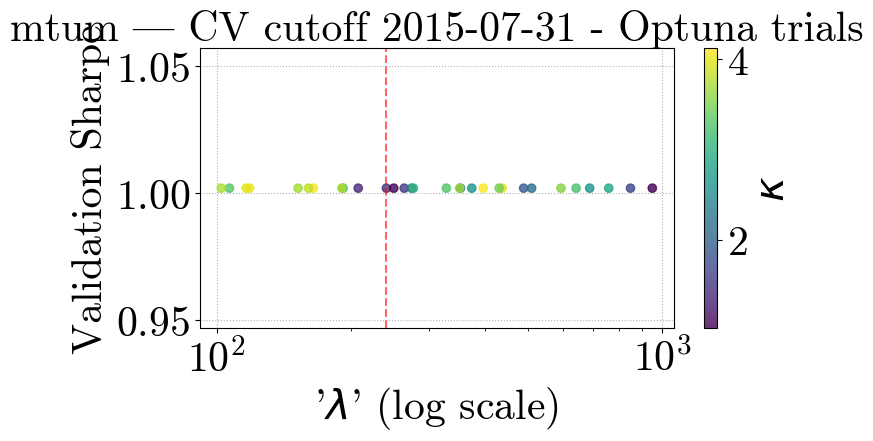

[I 2025-05-05 23:44:13,856] A new study created in memory with name: no-name-92b6e1c3-4d2a-43e5-bcc4-a597f2459b3c
[I 2025-05-05 23:44:15,532] Trial 0 finished with value: -0.47882031708018885 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.47882031708018885.
[I 2025-05-05 23:44:16,990] Trial 1 finished with value: -0.47882031708018885 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.47882031708018885.
[I 2025-05-05 23:44:20,964] Trial 2 finished with value: 0.4582262036876351 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.4582262036876351.
[I 2025-05-05 23:44:23,163] Trial 3 finished with value: -0.4788203170801889 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.4582262036876351.
[I 2025-05-05 23:44:24,666] Trial 4 finished with value: -0.47882031708018885 

Optuna best λ=240.4168, κ=1.487187364027523, Sharpe=0.4582


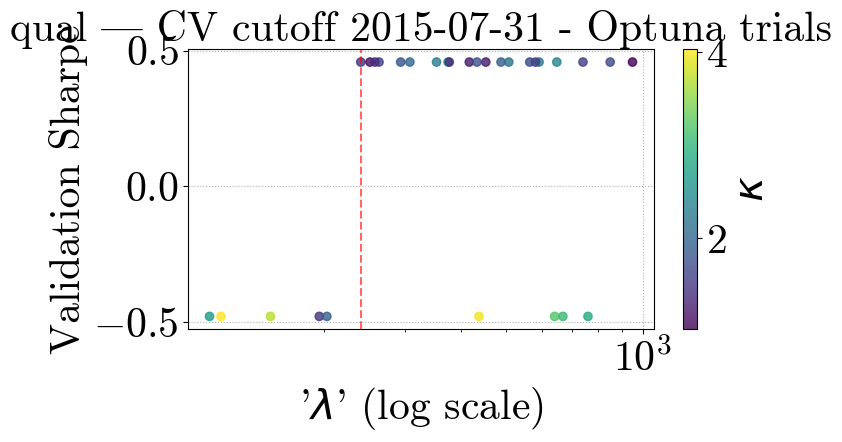

[I 2025-05-05 23:45:29,728] A new study created in memory with name: no-name-1aa3df2b-6739-46cc-8c16-58c89f109d81
[I 2025-05-05 23:45:31,412] Trial 0 finished with value: -0.3737375802604166 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.3737375802604166.
[I 2025-05-05 23:45:32,487] Trial 1 finished with value: -0.40900879301731746 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.3737375802604166.
[I 2025-05-05 23:45:33,976] Trial 2 finished with value: -0.564031051181426 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.3737375802604166.
[I 2025-05-05 23:45:36,620] Trial 3 finished with value: -0.07474300079003264 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: -0.07474300079003264.
[I 2025-05-05 23:45:37,781] Trial 4 finished with value: -0.47238337887808096

Optuna best λ=106.7926, κ=3.9798232276603978, Sharpe=-0.0582


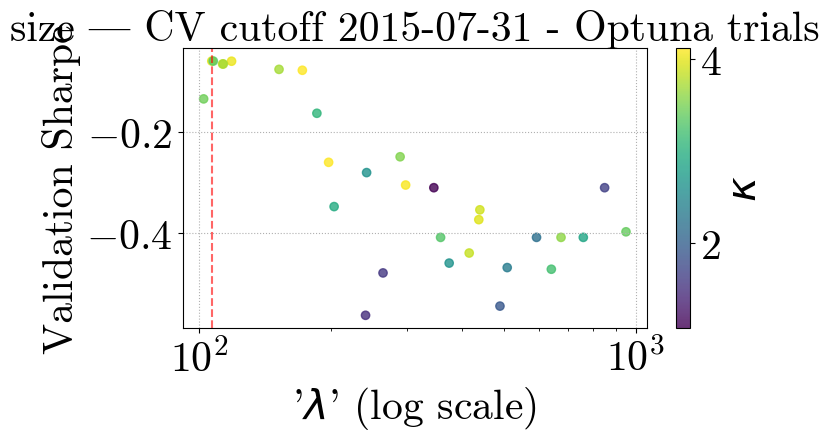

[I 2025-05-05 23:46:22,893] A new study created in memory with name: no-name-22fdbbbb-c01d-43b7-beb3-94f64c924853
[I 2025-05-05 23:46:24,635] Trial 0 finished with value: -0.19898135557163632 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.19898135557163632.
[I 2025-05-05 23:46:26,152] Trial 1 finished with value: -0.7031601223861157 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.19898135557163632.
[I 2025-05-05 23:46:28,027] Trial 2 finished with value: -0.1989813555716363 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.1989813555716363.
[I 2025-05-05 23:46:29,680] Trial 3 finished with value: -0.6437941544942807 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 2 with value: -0.1989813555716363.
[I 2025-05-05 23:46:30,971] Trial 4 finished with value: 0.1886695489551526 

Optuna best λ=641.0035, κ=3.2113854510604285, Sharpe=0.1887


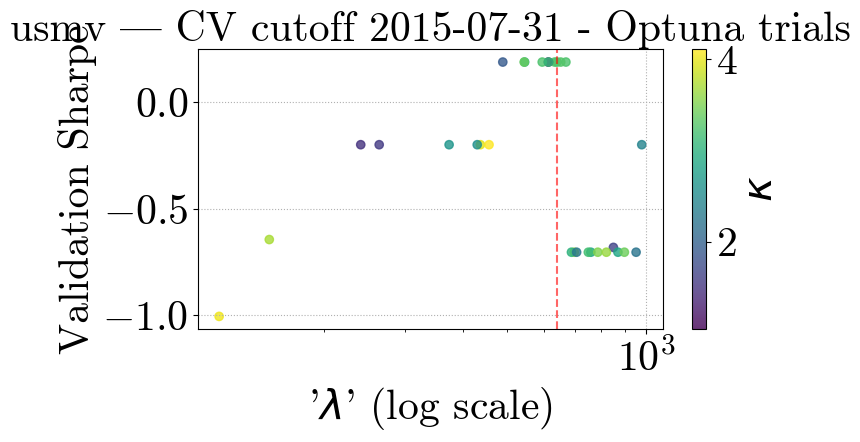

[I 2025-05-05 23:47:08,050] A new study created in memory with name: no-name-d460d97b-8f7a-4b40-a152-bca8f42c0688
[I 2025-05-05 23:47:09,290] Trial 0 finished with value: 1.4464713663615087 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.4464713663615087.
[I 2025-05-05 23:47:10,409] Trial 1 finished with value: 1.4464713663615087 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 1.4464713663615087.
[I 2025-05-05 23:47:12,352] Trial 2 finished with value: 1.3771903171219133 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 1.4464713663615087.
[I 2025-05-05 23:47:13,736] Trial 3 finished with value: 1.2256115050380059 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 0 with value: 1.4464713663615087.
[I 2025-05-05 23:47:14,777] Trial 4 finished with value: 1.4464713663615087 and paramet

Optuna best λ=849.1984, κ=1.6631574710979753, Sharpe=1.4465


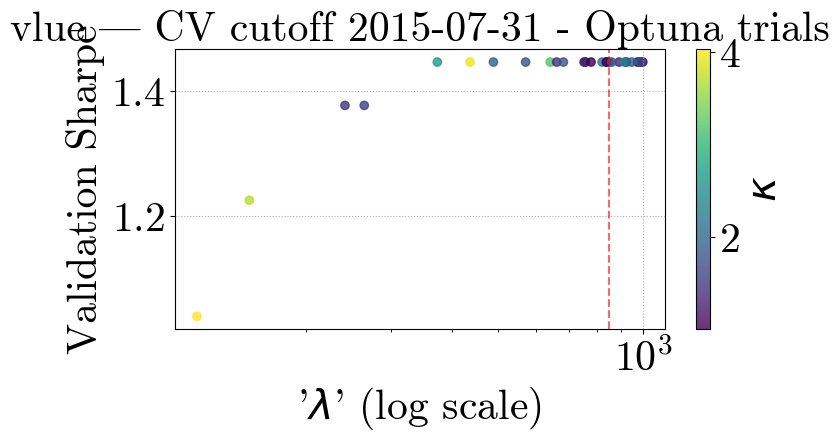

[I 2025-05-05 23:47:32,277] A new study created in memory with name: no-name-0dd33b76-f1f1-44b2-95e6-111f7bbf0c50
[I 2025-05-05 23:47:33,971] Trial 0 finished with value: -0.8833865875805678 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.8833865875805678.
[I 2025-05-05 23:47:34,336] Trial 1 finished with value: -0.8833865875805678 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.8833865875805678.
[I 2025-05-05 23:47:39,376] Trial 2 finished with value: -0.8833865875805677 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.8833865875805677.
[I 2025-05-05 23:47:42,196] Trial 3 finished with value: -0.8294486081459537 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: -0.8294486081459537.
[I 2025-05-05 23:47:43,698] Trial 4 finished with value: -0.8833865875805678 an

Optuna best λ=191.1508, κ=3.0838785197545158, Sharpe=-0.4142


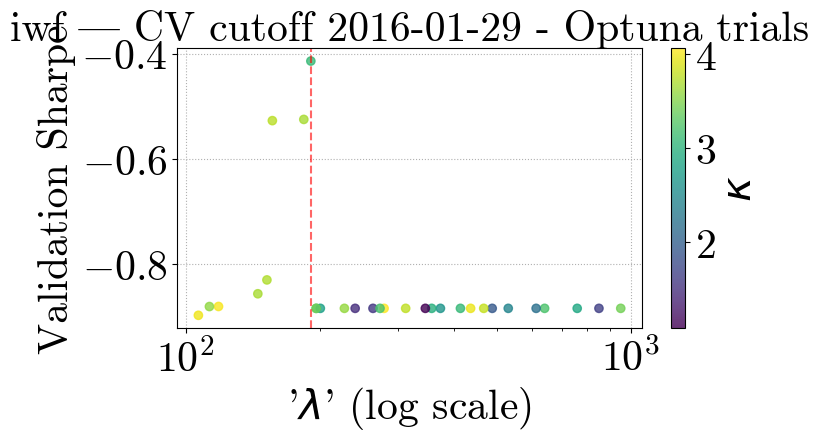

[I 2025-05-05 23:48:36,332] A new study created in memory with name: no-name-e08893fc-b36a-4f97-9a3c-551419be57b2
[I 2025-05-05 23:48:37,684] Trial 0 finished with value: 1.5238071745889652 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.5238071745889652.
[I 2025-05-05 23:48:38,885] Trial 1 finished with value: 1.5238071745889652 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 1.5238071745889652.
[I 2025-05-05 23:48:40,733] Trial 2 finished with value: 1.5238071745889652 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 1.5238071745889652.
[I 2025-05-05 23:48:43,279] Trial 3 finished with value: 1.4527249871696846 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 0 with value: 1.5238071745889652.
[I 2025-05-05 23:48:44,578] Trial 4 finished with value: 1.5238071745889652 and paramet

Optuna best λ=118.5260, κ=4.029130915629118, Sharpe=1.5705


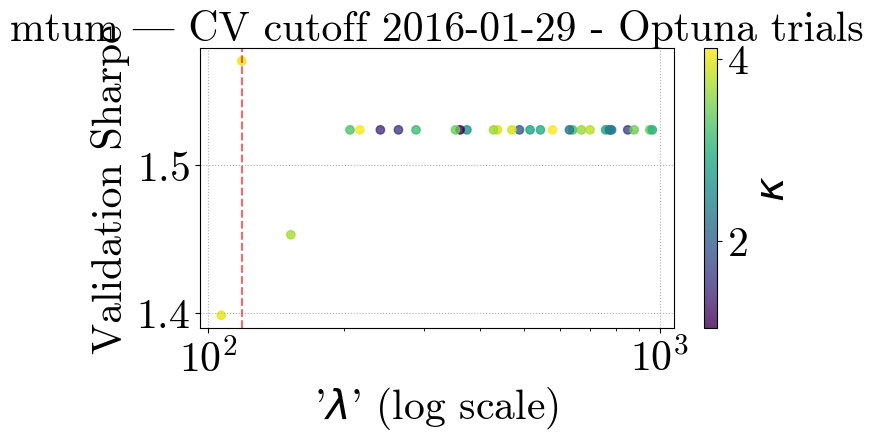

[I 2025-05-05 23:49:23,408] A new study created in memory with name: no-name-3f36fe67-e83b-4da9-b168-dc7100493f35
[I 2025-05-05 23:49:24,643] Trial 0 finished with value: -1.3030668994684087 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.3030668994684087.
[I 2025-05-05 23:49:25,691] Trial 1 finished with value: -1.3030668994684087 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: -1.3030668994684087.
[I 2025-05-05 23:49:27,958] Trial 2 finished with value: -0.5992557140659507 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.5992557140659507.
[I 2025-05-05 23:49:29,775] Trial 3 finished with value: -0.1311605408312719 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: -0.1311605408312719.
[I 2025-05-05 23:49:30,932] Trial 4 finished with value: -1.3030668994684087 an

Optuna best λ=980.1965, κ=1.0187298358271706, Sharpe=1.2841


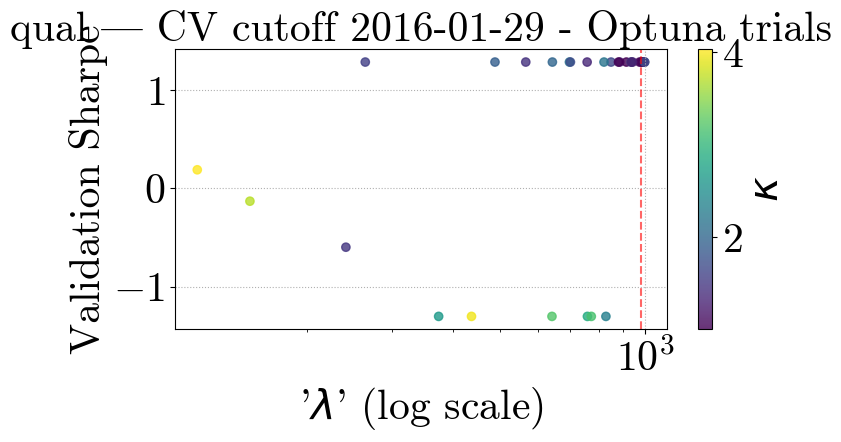

[I 2025-05-05 23:50:10,704] A new study created in memory with name: no-name-f2b65cd7-ddee-4455-a84c-f957fc9f70fe
[I 2025-05-05 23:50:11,835] Trial 0 finished with value: -0.5232170393961455 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.5232170393961455.
[I 2025-05-05 23:50:13,538] Trial 1 finished with value: -0.5232170393961456 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.5232170393961455.
[I 2025-05-05 23:50:15,467] Trial 2 finished with value: -0.594724159388469 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.5232170393961455.
[I 2025-05-05 23:50:17,674] Trial 3 finished with value: -0.11883781632220988 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: -0.11883781632220988.
[I 2025-05-05 23:50:19,458] Trial 4 finished with value: -0.5232170393961456 a

Optuna best λ=169.6267, κ=3.235396765858698, Sharpe=0.0136


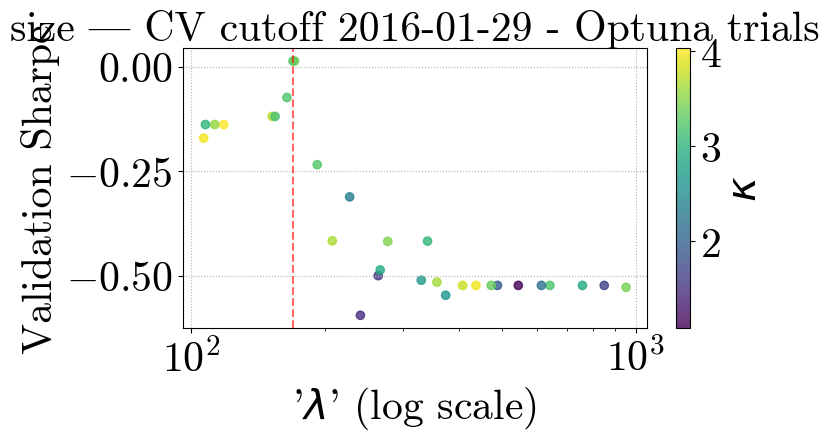

[I 2025-05-05 23:51:08,351] A new study created in memory with name: no-name-a4715379-fdb6-458b-894c-3b1398c8ac20
[I 2025-05-05 23:51:10,073] Trial 0 finished with value: -0.5977573919826558 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.5977573919826558.
[I 2025-05-05 23:51:11,568] Trial 1 finished with value: -0.6836738039592097 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.5977573919826558.
[I 2025-05-05 23:51:13,524] Trial 2 finished with value: -0.5977573919826559 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.5977573919826558.
[I 2025-05-05 23:51:15,896] Trial 3 finished with value: -0.4460195048504032 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: -0.4460195048504032.
[I 2025-05-05 23:51:17,104] Trial 4 finished with value: -0.5977573919826559 an

Optuna best λ=106.7926, κ=3.9798232276603978, Sharpe=0.0760


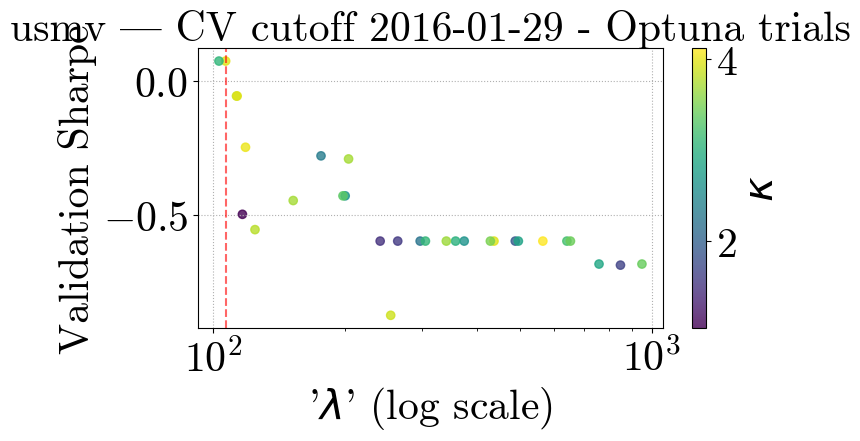

[I 2025-05-05 23:52:06,552] A new study created in memory with name: no-name-073ee1d4-bff4-4c57-9c8c-7621a9074797
[I 2025-05-05 23:52:08,439] Trial 0 finished with value: 1.143911025787264 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.143911025787264.
[I 2025-05-05 23:52:09,450] Trial 1 finished with value: 0.27184953791463334 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 1.143911025787264.
[I 2025-05-05 23:52:11,403] Trial 2 finished with value: 1.1314731818892179 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 1.143911025787264.
[I 2025-05-05 23:52:12,899] Trial 3 finished with value: 1.0823795672659835 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 0 with value: 1.143911025787264.
[I 2025-05-05 23:52:14,087] Trial 4 finished with value: 0.6514012913789804 and parameters:

Optuna best λ=118.5260, κ=4.029130915629118, Sharpe=1.3026


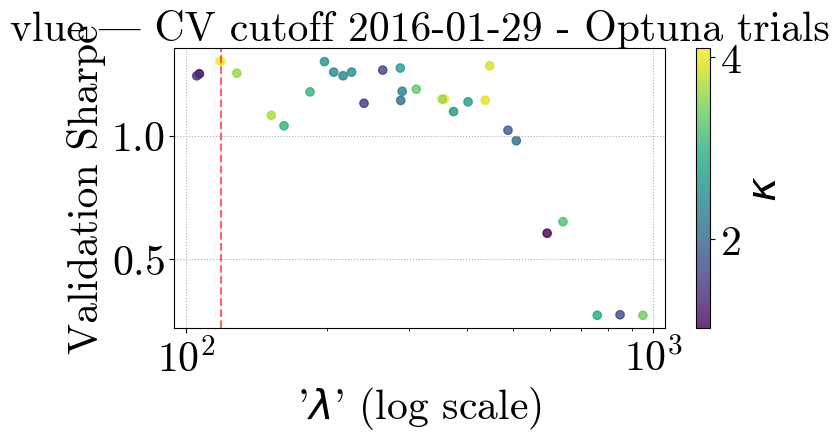

[I 2025-05-05 23:52:55,996] A new study created in memory with name: no-name-a0728ec4-fe47-4fe5-b86b-b4f36271b838
[I 2025-05-05 23:52:58,673] Trial 0 finished with value: -0.730563987147049 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.730563987147049.
[I 2025-05-05 23:53:00,173] Trial 1 finished with value: -0.730563987147049 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.730563987147049.
[I 2025-05-05 23:53:04,455] Trial 2 finished with value: -0.7305639871470487 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.7305639871470487.
[I 2025-05-05 23:53:07,412] Trial 3 finished with value: -0.6279977681059193 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: -0.6279977681059193.
[I 2025-05-05 23:53:09,866] Trial 4 finished with value: -0.730563987147049 and par

Optuna best λ=244.0485, κ=1.3534601315544141, Sharpe=0.0635


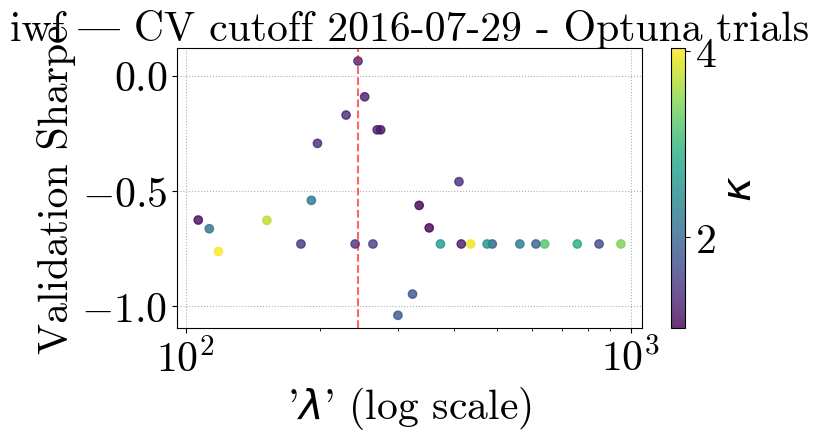

[I 2025-05-05 23:53:55,371] A new study created in memory with name: no-name-7f64ace5-17e1-44c5-830b-7da3448c5937
[I 2025-05-05 23:53:57,102] Trial 0 finished with value: 1.1761137233486407 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.1761137233486407.
[I 2025-05-05 23:53:58,859] Trial 1 finished with value: 1.1761137233486407 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 1.1761137233486407.
[I 2025-05-05 23:54:00,744] Trial 2 finished with value: 1.2368745048657632 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 1.2368745048657632.
[I 2025-05-05 23:54:03,244] Trial 3 finished with value: 1.2804431254290012 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 1.2804431254290012.
[I 2025-05-05 23:54:05,013] Trial 4 finished with value: 1.1761137233486407 and paramet

Optuna best λ=131.0905, κ=2.178954526326029, Sharpe=1.6761


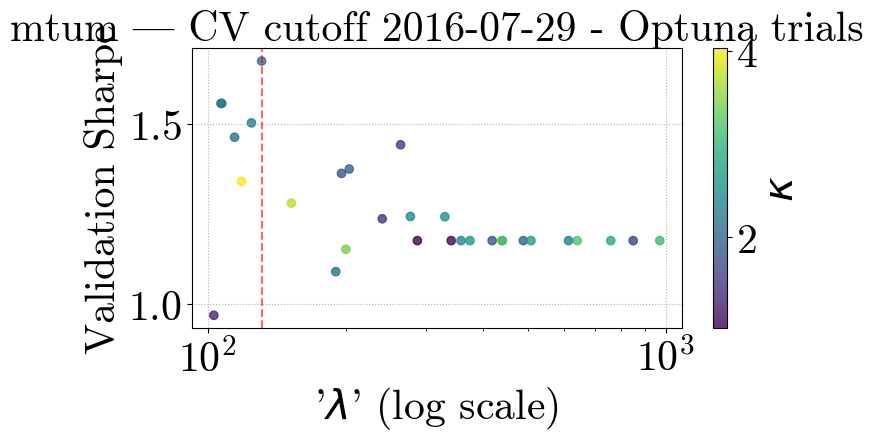

[I 2025-05-05 23:54:48,720] A new study created in memory with name: no-name-44417361-37a3-4efd-8ecd-c2d8c0ae99a6
[I 2025-05-05 23:54:50,141] Trial 0 finished with value: -1.003270615272709 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.003270615272709.
[I 2025-05-05 23:54:51,333] Trial 1 finished with value: -1.003270615272709 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: -1.003270615272709.
[I 2025-05-05 23:54:55,799] Trial 2 finished with value: 0.9853445239107415 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.9853445239107415.
[I 2025-05-05 23:54:57,640] Trial 3 finished with value: 0.13424411340051665 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.9853445239107415.
[I 2025-05-05 23:54:58,851] Trial 4 finished with value: -1.003270615272709 and parame

Optuna best λ=383.6045, κ=1.053853654677886, Sharpe=0.9938


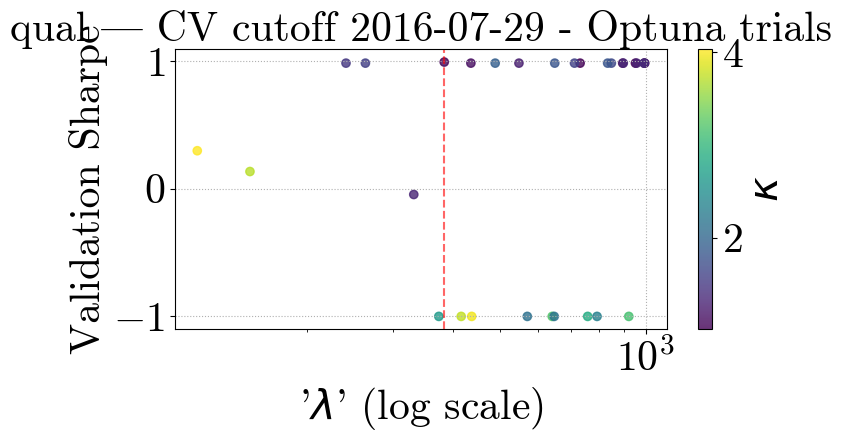

[I 2025-05-05 23:55:44,821] A new study created in memory with name: no-name-781cc0ba-4ebf-4bd0-8825-02d4b1c64d9f
[I 2025-05-05 23:55:46,545] Trial 0 finished with value: -0.3232394253451738 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.3232394253451738.
[I 2025-05-05 23:55:48,238] Trial 1 finished with value: -0.45440626720794997 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.3232394253451738.
[I 2025-05-05 23:55:49,714] Trial 2 finished with value: -0.38776893584663 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.3232394253451738.
[I 2025-05-05 23:55:52,899] Trial 3 finished with value: 0.08793222802465989 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.08793222802465989.
[I 2025-05-05 23:55:54,732] Trial 4 finished with value: -0.45440626720794997 an

Optuna best λ=164.8054, κ=3.352399342336529, Sharpe=0.0922


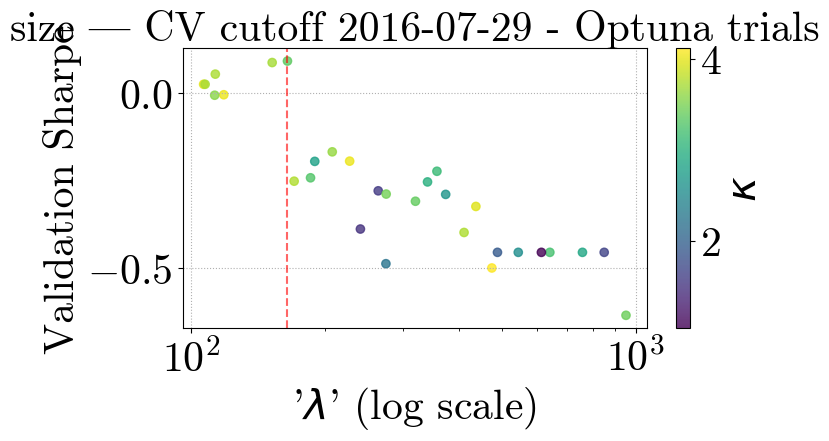

[I 2025-05-05 23:56:52,919] A new study created in memory with name: no-name-c12dc629-07bf-45aa-8b49-6ca74d3cddac
[I 2025-05-05 23:56:54,450] Trial 0 finished with value: -0.6393517814509033 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.6393517814509033.
[I 2025-05-05 23:56:56,153] Trial 1 finished with value: -0.1120086532344493 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.1120086532344493.
[I 2025-05-05 23:56:58,211] Trial 2 finished with value: -0.6319538020075741 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.1120086532344493.
[I 2025-05-05 23:57:00,788] Trial 3 finished with value: -0.2511959902807573 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 1 with value: -0.1120086532344493.
[I 2025-05-05 23:57:02,371] Trial 4 finished with value: -0.6393517814509033 an

Optuna best λ=118.5260, κ=4.029130915629118, Sharpe=0.1312


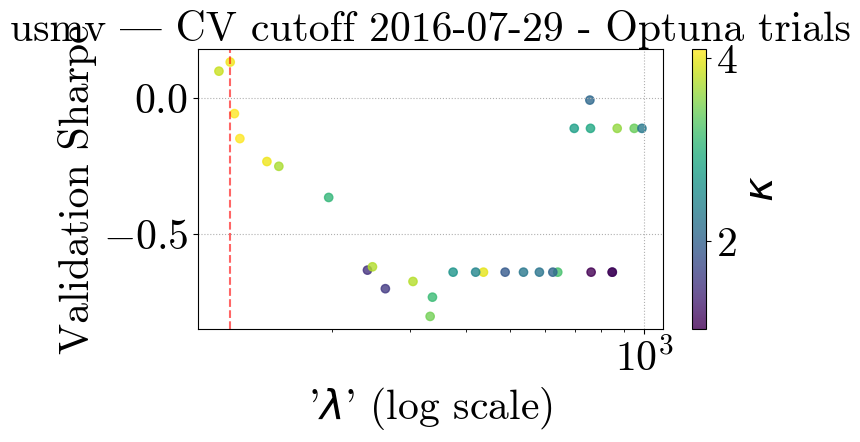

[I 2025-05-05 23:57:50,023] A new study created in memory with name: no-name-a13ce2f8-0d2c-4c09-bf94-f7c9dcf5dd63
[I 2025-05-05 23:57:52,061] Trial 0 finished with value: 0.2419735532868501 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.2419735532868501.
[I 2025-05-05 23:57:54,237] Trial 1 finished with value: -0.06443852255193727 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.2419735532868501.
[I 2025-05-05 23:57:56,976] Trial 2 finished with value: 0.02438719398382153 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.2419735532868501.
[I 2025-05-05 23:57:59,282] Trial 3 finished with value: 0.42593709250284584 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.42593709250284584.
[I 2025-05-05 23:58:01,657] Trial 4 finished with value: 0.08344521121844273 and p

Optuna best λ=381.0114, κ=3.857615059346561, Sharpe=0.5266


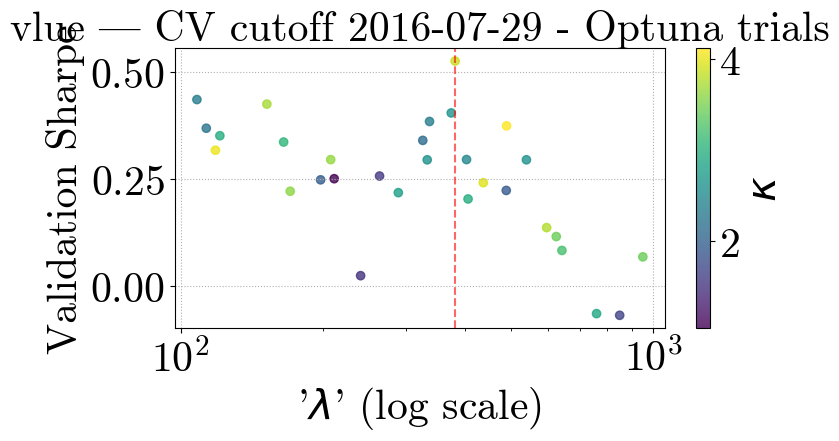

[I 2025-05-05 23:58:54,604] A new study created in memory with name: no-name-92852adc-e9aa-4166-8d31-8c9c98cb9704
[I 2025-05-05 23:58:57,263] Trial 0 finished with value: -0.16990143423043375 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.16990143423043375.
[I 2025-05-05 23:58:59,378] Trial 1 finished with value: -0.16990143423043375 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.16990143423043375.
[I 2025-05-05 23:59:03,727] Trial 2 finished with value: -0.16990143423043394 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.16990143423043375.
[I 2025-05-05 23:59:06,199] Trial 3 finished with value: -0.12320658615127834 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: -0.12320658615127834.
[I 2025-05-05 23:59:08,346] Trial 4 finished with value: -0.16990143423

Optuna best λ=187.6241, κ=3.1534956380291588, Sharpe=-0.0801


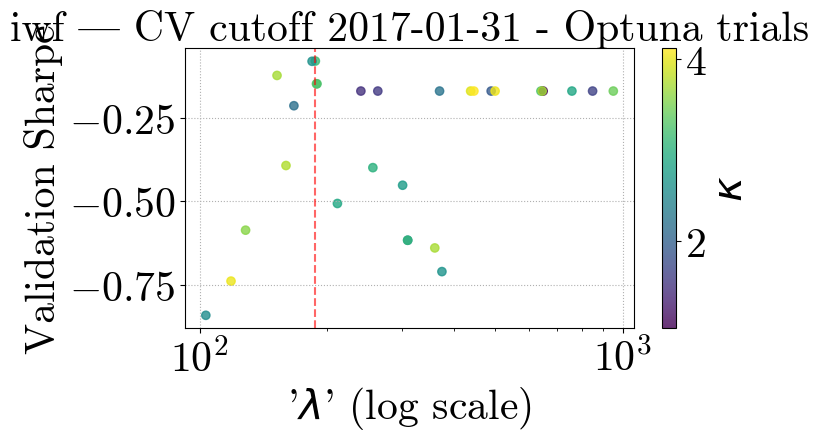

[I 2025-05-06 00:00:19,045] A new study created in memory with name: no-name-5bfd5493-7dc6-43d4-95ac-76c6f296196e
[I 2025-05-06 00:00:20,529] Trial 0 finished with value: 0.728550374850522 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.728550374850522.
[I 2025-05-06 00:00:22,102] Trial 1 finished with value: 0.728550374850522 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.728550374850522.
[I 2025-05-06 00:00:24,177] Trial 2 finished with value: 0.9024351484285693 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.9024351484285693.
[I 2025-05-06 00:00:26,757] Trial 3 finished with value: 1.1146869711576746 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 1.1146869711576746.
[I 2025-05-06 00:00:28,343] Trial 4 finished with value: 0.728550374850522 and parameters: 

Optuna best λ=103.0962, κ=3.7930695480778933, Sharpe=1.3030


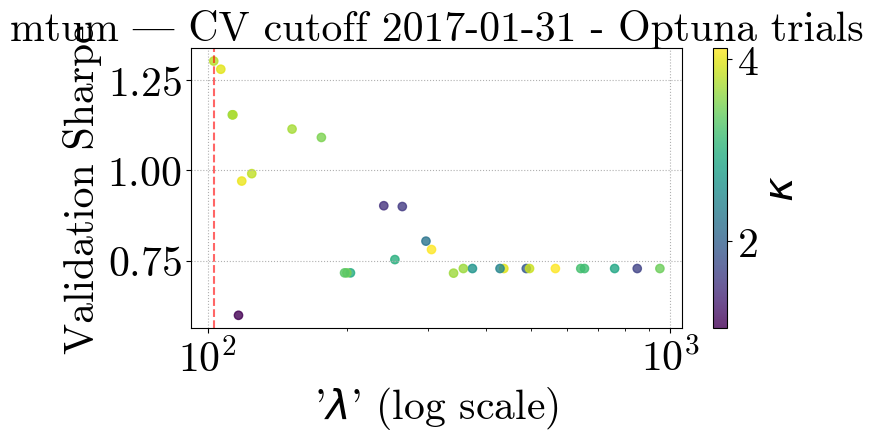

[I 2025-05-06 00:01:22,894] A new study created in memory with name: no-name-85cb5ffd-f25f-4cfa-8301-58605f11b3ce
[I 2025-05-06 00:01:24,633] Trial 0 finished with value: -0.6551736832562959 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.6551736832562959.
[I 2025-05-06 00:01:26,231] Trial 1 finished with value: -0.6551736832562959 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.6551736832562959.
[I 2025-05-06 00:01:28,076] Trial 2 finished with value: -0.0661601991994957 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.0661601991994957.
[I 2025-05-06 00:01:30,038] Trial 3 finished with value: 0.4083962760162615 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.4083962760162615.
[I 2025-05-06 00:01:31,565] Trial 4 finished with value: -0.6551736832562959 and 

Optuna best λ=849.1984, κ=1.6631574710979753, Sharpe=0.6379


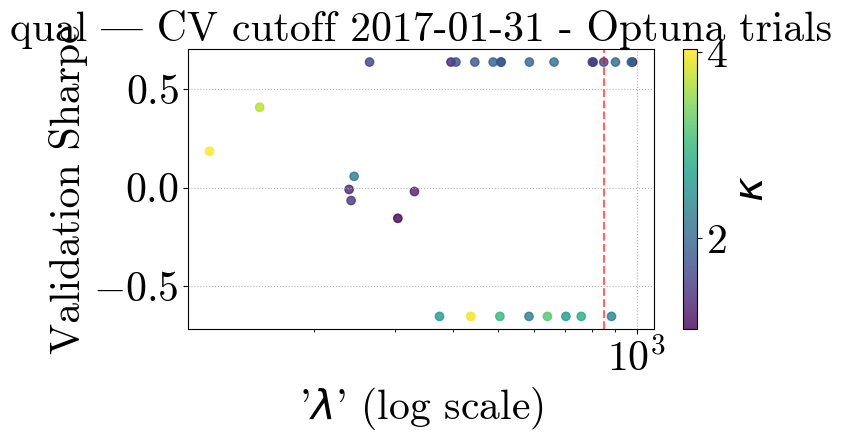

[I 2025-05-06 00:02:42,637] A new study created in memory with name: no-name-2e03d957-bb6d-4b30-baf2-3509f7ce0ea4
[I 2025-05-06 00:02:44,032] Trial 0 finished with value: -0.3692993587402888 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.3692993587402888.
[I 2025-05-06 00:02:45,897] Trial 1 finished with value: -0.4772219219268638 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.3692993587402888.
[I 2025-05-06 00:02:47,916] Trial 2 finished with value: -0.23791816879415043 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.23791816879415043.
[I 2025-05-06 00:02:51,258] Trial 3 finished with value: 0.1788303972951285 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.1788303972951285.
[I 2025-05-06 00:02:53,259] Trial 4 finished with value: -0.4772219219268638 an

Optuna best λ=152.2753, κ=3.705159593645523, Sharpe=0.1788


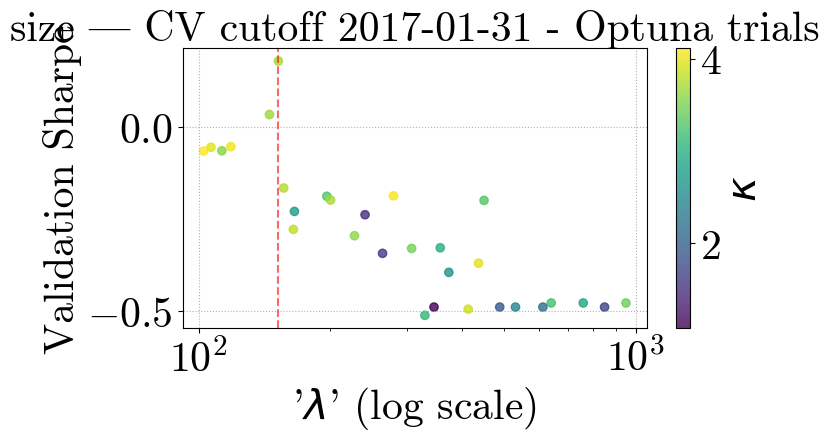

[I 2025-05-06 00:03:54,522] A new study created in memory with name: no-name-770a4a5f-0f81-499f-8624-04ea7005ef8e
[I 2025-05-06 00:03:56,281] Trial 0 finished with value: -1.0245752344887928 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.0245752344887928.
[I 2025-05-06 00:03:58,900] Trial 1 finished with value: -0.1552493311625918 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.1552493311625918.
[I 2025-05-06 00:04:00,299] Trial 2 finished with value: -1.1050308592356641 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.1552493311625918.
[I 2025-05-06 00:04:03,200] Trial 3 finished with value: -0.4081718912463481 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 1 with value: -0.1552493311625918.
[I 2025-05-06 00:04:04,453] Trial 4 finished with value: -0.48188174328030237 a

Optuna best λ=805.2667, κ=1.0411523272835173, Sharpe=0.0987


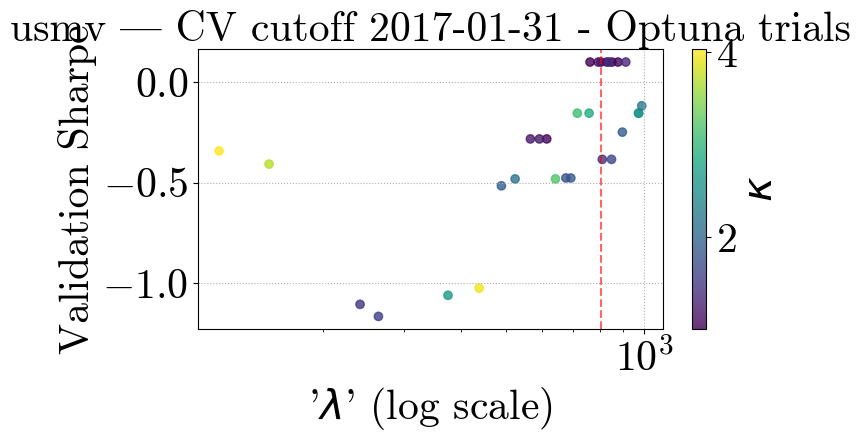

[I 2025-05-06 00:04:37,848] A new study created in memory with name: no-name-28be6094-3161-4c70-937f-0fecbaa2aba3
[I 2025-05-06 00:04:39,841] Trial 0 finished with value: 0.7303849056895209 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.7303849056895209.
[I 2025-05-06 00:04:41,262] Trial 1 finished with value: 0.3973380701987932 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.7303849056895209.
[I 2025-05-06 00:04:43,564] Trial 2 finished with value: 0.46440232427766964 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.7303849056895209.
[I 2025-05-06 00:04:45,891] Trial 3 finished with value: 0.972831145425539 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.972831145425539.
[I 2025-05-06 00:04:47,293] Trial 4 finished with value: 0.6538784338214138 and paramete

Optuna best λ=108.3039, κ=2.323218016016679, Sharpe=0.9886


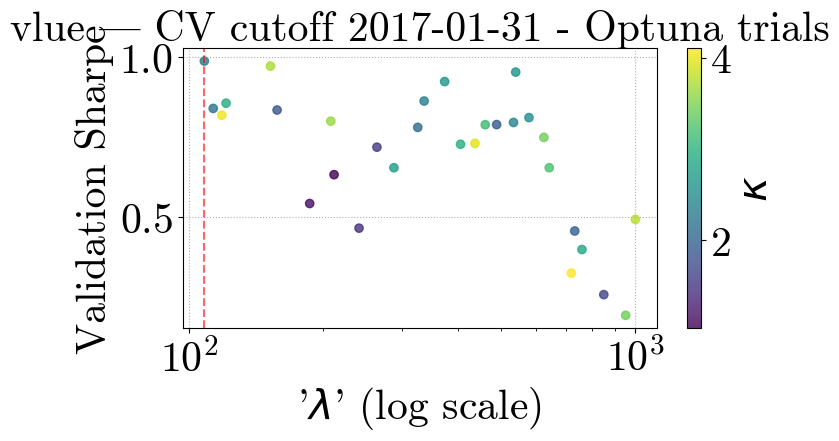

[I 2025-05-06 00:05:34,391] A new study created in memory with name: no-name-af658418-5fe1-4cc8-a18f-efb81b684c04
[I 2025-05-06 00:05:37,498] Trial 0 finished with value: -0.6368910664980917 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.6368910664980917.
[I 2025-05-06 00:05:40,224] Trial 1 finished with value: -0.6368910664980917 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.6368910664980917.
[I 2025-05-06 00:05:46,293] Trial 2 finished with value: -0.6368910664980915 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.6368910664980915.
[I 2025-05-06 00:05:50,212] Trial 3 finished with value: -0.5363158366519409 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: -0.5363158366519409.
[I 2025-05-06 00:05:53,078] Trial 4 finished with value: -0.6368910664980917 an

Optuna best λ=182.8175, κ=3.6832453065371724, Sharpe=-0.3692


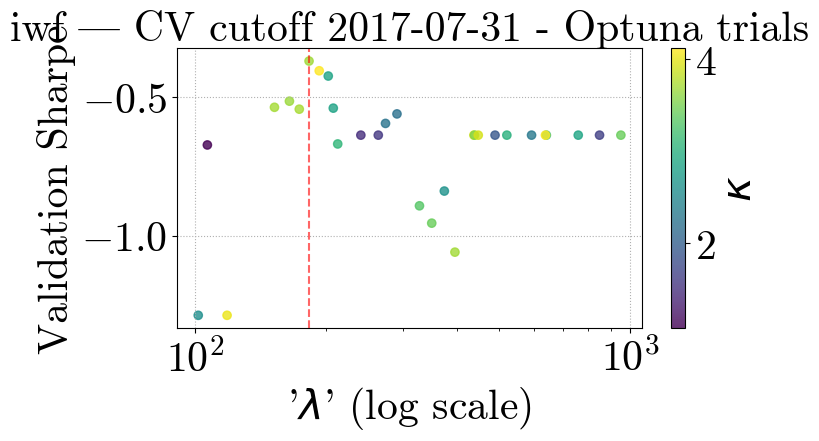

[I 2025-05-06 00:07:03,752] A new study created in memory with name: no-name-65595782-bd67-4297-b89c-b6ec126bdfe8
[I 2025-05-06 00:07:05,194] Trial 0 finished with value: 1.2241679198414144 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.2241679198414144.
[I 2025-05-06 00:07:06,565] Trial 1 finished with value: 1.2241679198414144 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 1.2241679198414144.
[I 2025-05-06 00:07:08,188] Trial 2 finished with value: 1.4206411190483768 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 1.4206411190483768.
[I 2025-05-06 00:07:11,094] Trial 3 finished with value: 1.5217367878748222 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 1.5217367878748222.
[I 2025-05-06 00:07:12,459] Trial 4 finished with value: 1.2241679198414144 and paramet

Optuna best λ=103.0962, κ=3.7930695480778933, Sharpe=1.8817


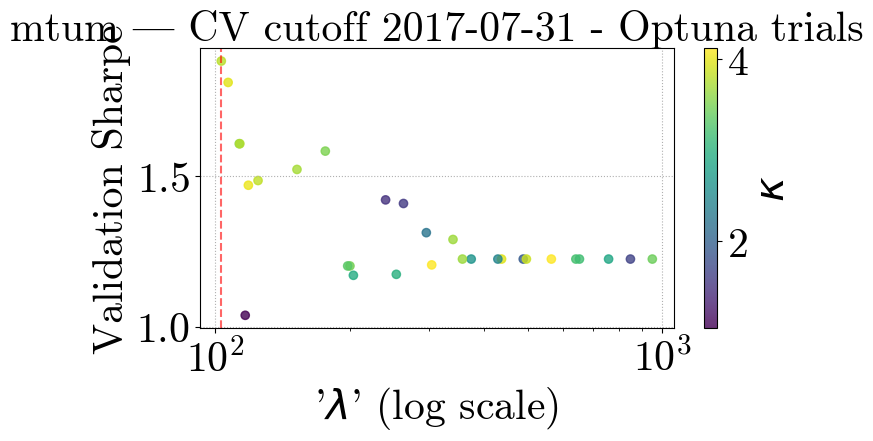

[I 2025-05-06 00:08:12,130] A new study created in memory with name: no-name-7f7bf00e-df91-4ebb-bf77-769f227a2d89
[I 2025-05-06 00:08:14,126] Trial 0 finished with value: -0.7378163880806663 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.7378163880806663.
[I 2025-05-06 00:08:15,945] Trial 1 finished with value: -0.7378163880806663 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.7378163880806663.
[I 2025-05-06 00:08:18,504] Trial 2 finished with value: 0.08222846172085622 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.08222846172085622.
[I 2025-05-06 00:08:21,378] Trial 3 finished with value: 0.275220303723432 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.275220303723432.
[I 2025-05-06 00:08:23,190] Trial 4 finished with value: -0.7378163880806663 and pa

Optuna best λ=395.8542, κ=1.305925324521467, Sharpe=0.8794


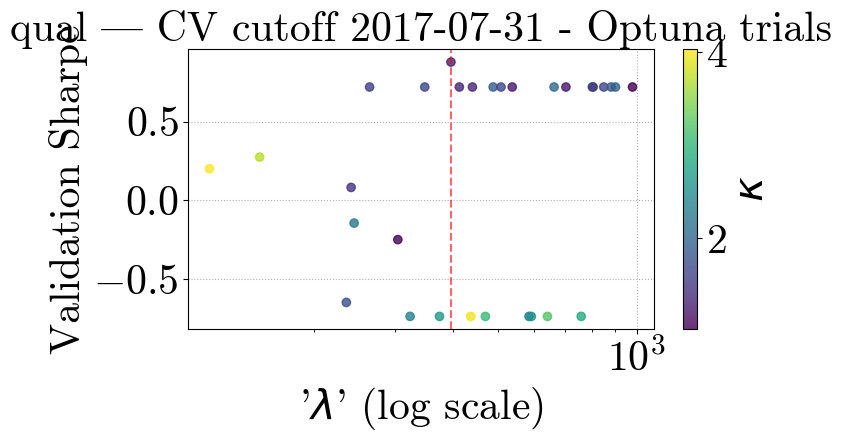

[I 2025-05-06 00:09:20,490] A new study created in memory with name: no-name-7eca740d-5f2a-4a61-be46-fbc78c9a7ae9
[I 2025-05-06 00:09:22,033] Trial 0 finished with value: -0.09044335190461486 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.09044335190461486.
[I 2025-05-06 00:09:23,881] Trial 1 finished with value: -0.31052837434579755 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.09044335190461486.
[I 2025-05-06 00:09:25,937] Trial 2 finished with value: 0.2328204983949817 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.2328204983949817.
[I 2025-05-06 00:09:28,330] Trial 3 finished with value: 0.41388815234845566 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.41388815234845566.
[I 2025-05-06 00:09:30,270] Trial 4 finished with value: -0.31052837434579755

Optuna best λ=279.2807, κ=4.060125690956306, Sharpe=0.4160


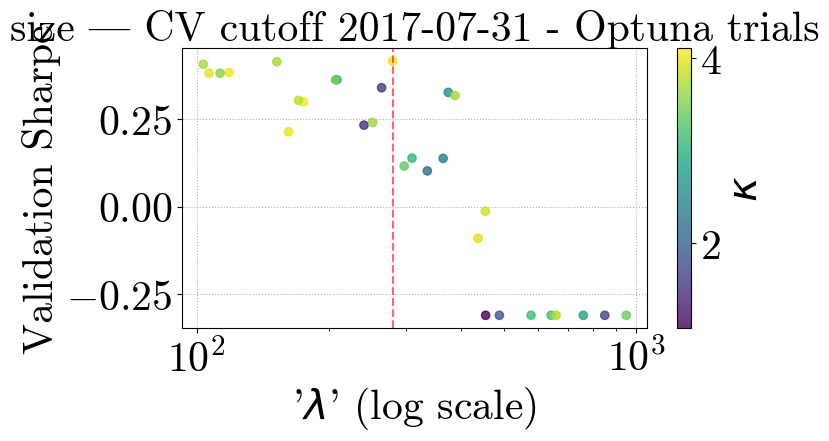

[I 2025-05-06 00:10:30,079] A new study created in memory with name: no-name-c502fc94-c91f-4357-9ddb-860173092f3b
[I 2025-05-06 00:10:31,922] Trial 0 finished with value: -1.0066171367129113 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.0066171367129113.
[I 2025-05-06 00:10:33,726] Trial 1 finished with value: 1.1794863961524154 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: 1.1794863961524154.
[I 2025-05-06 00:10:35,744] Trial 2 finished with value: -1.0738928056537307 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: 1.1794863961524154.
[I 2025-05-06 00:10:38,285] Trial 3 finished with value: -0.364632676707314 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 1 with value: 1.1794863961524154.
[I 2025-05-06 00:10:39,472] Trial 4 finished with value: -0.41412923805883317 and pa

Optuna best λ=758.7945, κ=2.869673679819506, Sharpe=1.1795


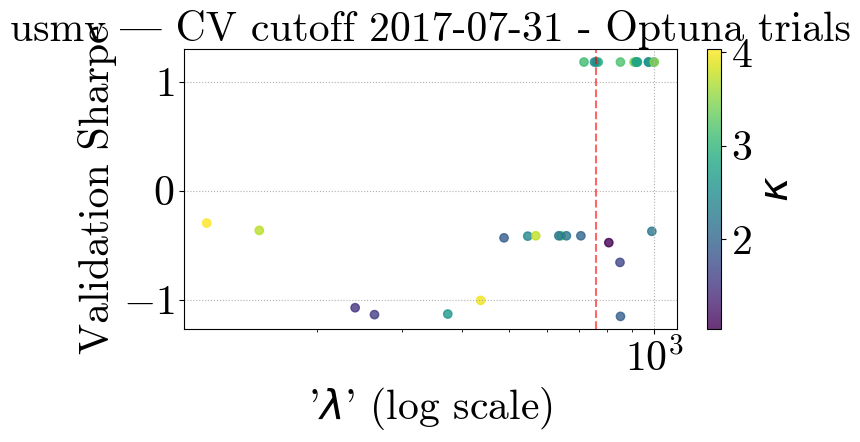

[I 2025-05-06 00:11:23,457] A new study created in memory with name: no-name-318b9115-d224-44e1-842c-73509fdea575
[I 2025-05-06 00:11:25,039] Trial 0 finished with value: 0.12673869440389102 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.12673869440389102.
[I 2025-05-06 00:11:26,579] Trial 1 finished with value: -0.24427373900792423 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.12673869440389102.
[I 2025-05-06 00:11:28,919] Trial 2 finished with value: -0.09320047842589263 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.12673869440389102.
[I 2025-05-06 00:11:30,697] Trial 3 finished with value: 0.3586740318438115 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.3586740318438115.
[I 2025-05-06 00:11:32,110] Trial 4 finished with value: 0.14272012092644779 an

Optuna best λ=104.8716, κ=1.3870525536702851, Sharpe=0.4166


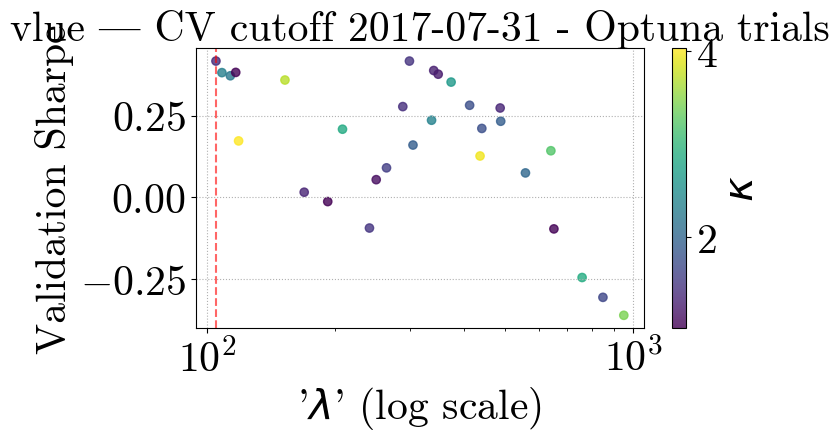

[I 2025-05-06 00:12:15,292] A new study created in memory with name: no-name-308e68ae-2a0e-4fe0-afc1-ed2cac803726
[I 2025-05-06 00:12:17,269] Trial 0 finished with value: -0.6693405954750244 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.6693405954750244.
[I 2025-05-06 00:12:19,214] Trial 1 finished with value: -0.8322555030421472 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.6693405954750244.
[I 2025-05-06 00:12:23,090] Trial 2 finished with value: -0.8322555030421475 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.6693405954750244.
[I 2025-05-06 00:12:25,594] Trial 3 finished with value: -0.6232159761178551 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: -0.6232159761178551.
[I 2025-05-06 00:12:27,473] Trial 4 finished with value: -0.8322555030421472 an

Optuna best λ=279.0220, κ=3.1409032980343046, Sharpe=0.3257


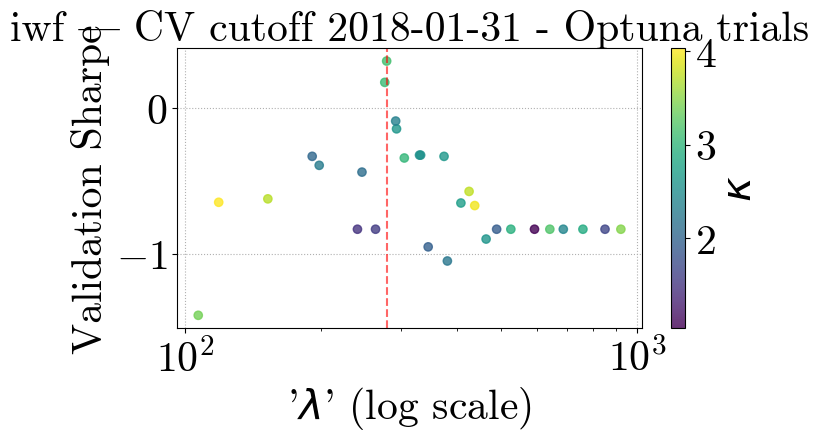

[I 2025-05-06 00:13:20,736] A new study created in memory with name: no-name-372fb647-1511-4145-b2c0-743fdf434b38
[I 2025-05-06 00:13:22,234] Trial 0 finished with value: 1.3641644415664627 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.3641644415664627.
[I 2025-05-06 00:13:23,586] Trial 1 finished with value: 1.3641644415664627 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 1.3641644415664627.
[I 2025-05-06 00:13:25,796] Trial 2 finished with value: 1.542000530752003 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 1.542000530752003.
[I 2025-05-06 00:13:29,011] Trial 3 finished with value: 1.6389326498462027 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 1.6389326498462027.
[I 2025-05-06 00:13:30,347] Trial 4 finished with value: 1.3641644415664627 and parameter

Optuna best λ=118.5260, κ=4.029130915629118, Sharpe=1.9556


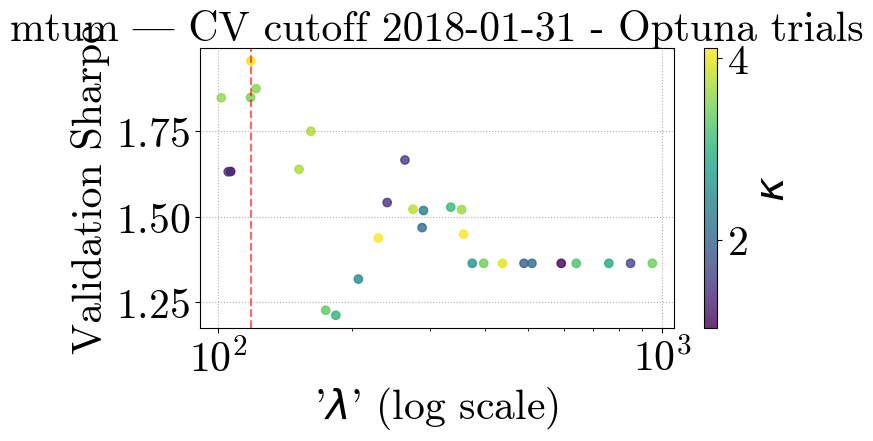

[I 2025-05-06 00:14:26,875] A new study created in memory with name: no-name-d3188609-39d3-4130-a90b-9c8fff29f731
[I 2025-05-06 00:14:28,894] Trial 0 finished with value: 0.6509218552307324 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.6509218552307324.
[I 2025-05-06 00:14:30,680] Trial 1 finished with value: 0.6509218552307324 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.6509218552307324.
[I 2025-05-06 00:14:33,064] Trial 2 finished with value: 0.17916356747342288 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.6509218552307324.
[I 2025-05-06 00:14:37,030] Trial 3 finished with value: 0.40780647379408047 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.6509218552307324.
[I 2025-05-06 00:14:38,826] Trial 4 finished with value: 0.6509218552307324 and param

Optuna best λ=409.6596, κ=1.0536965098707882, Sharpe=1.0249


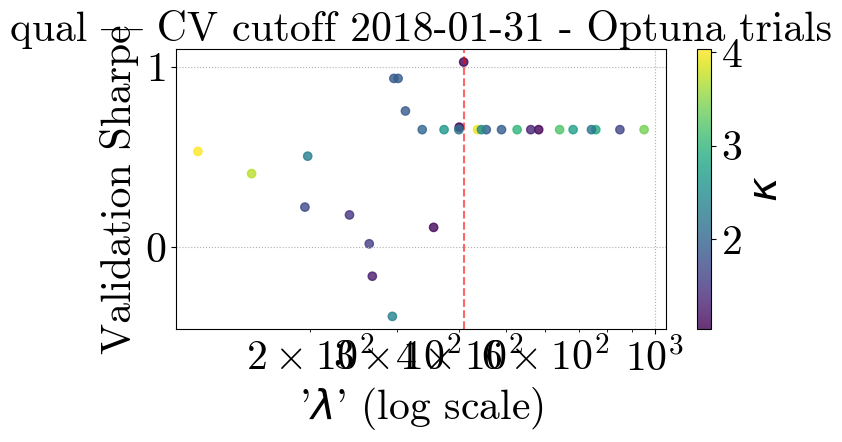

[I 2025-05-06 00:15:28,868] A new study created in memory with name: no-name-035a1a24-5ae0-4245-8e03-fe7698b03d7a
[I 2025-05-06 00:15:30,376] Trial 0 finished with value: -0.10678423004746013 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.10678423004746013.
[I 2025-05-06 00:15:31,744] Trial 1 finished with value: 0.02772357849313503 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.02772357849313503.
[I 2025-05-06 00:15:33,873] Trial 2 finished with value: 0.04114002296592161 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.04114002296592161.
[I 2025-05-06 00:15:36,072] Trial 3 finished with value: -0.017427825162839777 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.04114002296592161.
[I 2025-05-06 00:15:37,435] Trial 4 finished with value: -0.106784230047460

Optuna best λ=897.1262, κ=2.7327295800988574, Sharpe=0.1982


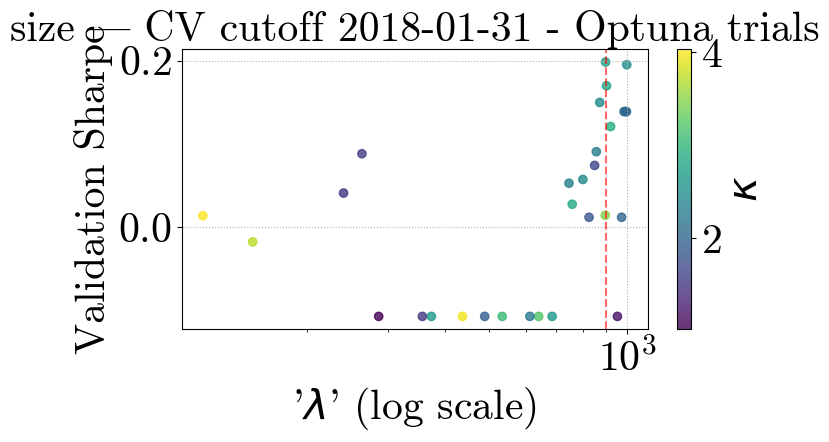

[I 2025-05-06 00:16:12,698] A new study created in memory with name: no-name-be9d4b5c-09b6-4a2d-9f62-e57d1dc29841
[I 2025-05-06 00:16:14,585] Trial 0 finished with value: -0.7411738451095233 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.7411738451095233.
[I 2025-05-06 00:16:16,677] Trial 1 finished with value: 0.08246829190799912 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.08246829190799912.
[I 2025-05-06 00:16:18,505] Trial 2 finished with value: -0.6001049969158727 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.08246829190799912.
[I 2025-05-06 00:16:21,462] Trial 3 finished with value: -0.055560584801232694 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.08246829190799912.
[I 2025-05-06 00:16:23,538] Trial 4 finished with value: 0.08246829190799912 

Optuna best λ=999.4262, κ=2.43040384589403, Sharpe=0.0949


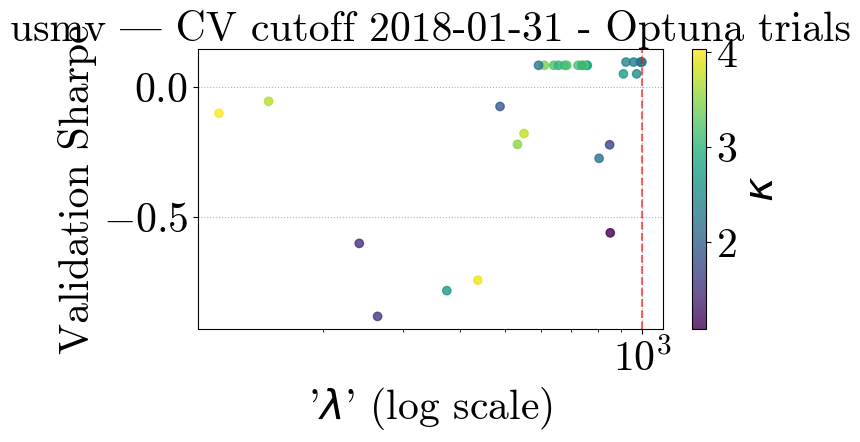

[I 2025-05-06 00:17:15,050] A new study created in memory with name: no-name-f48a4bf4-ac75-4588-8d35-85f8dd3fc21b
[I 2025-05-06 00:17:16,569] Trial 0 finished with value: 0.4784661942017253 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.4784661942017253.
[I 2025-05-06 00:17:18,028] Trial 1 finished with value: 0.45976176337218283 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.4784661942017253.
[I 2025-05-06 00:17:20,755] Trial 2 finished with value: 0.1645510292219479 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.4784661942017253.
[I 2025-05-06 00:17:23,080] Trial 3 finished with value: 0.5961076545402622 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.5961076545402622.
[I 2025-05-06 00:17:24,501] Trial 4 finished with value: 0.44250435652599085 and param

Optuna best λ=111.5098, κ=2.1653702315615755, Sharpe=0.6139


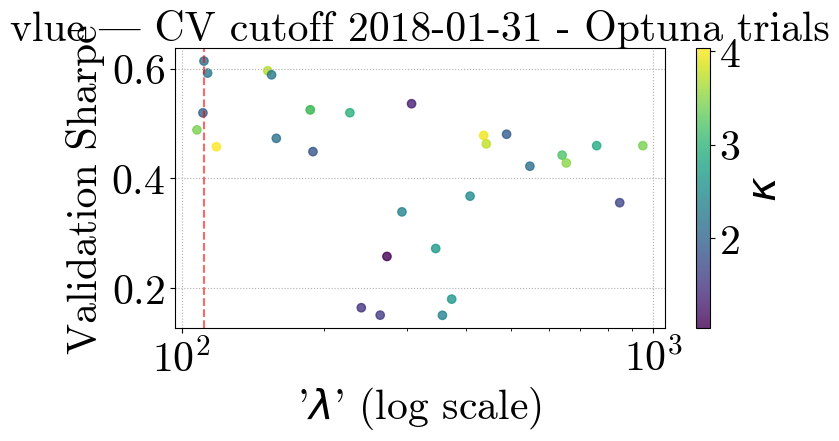

[I 2025-05-06 00:18:16,028] A new study created in memory with name: no-name-93b0ad97-95b5-491b-8215-c104d80a4ffb
[I 2025-05-06 00:18:17,997] Trial 0 finished with value: -0.3987306326986233 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.3987306326986233.
[I 2025-05-06 00:18:19,936] Trial 1 finished with value: -0.3987306326986233 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.3987306326986233.
[I 2025-05-06 00:18:25,390] Trial 2 finished with value: 0.5835419657616573 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.5835419657616573.
[I 2025-05-06 00:18:27,234] Trial 3 finished with value: -0.12594490778692757 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.5835419657616573.
[I 2025-05-06 00:18:29,169] Trial 4 finished with value: -0.3987306326986233 and 

Optuna best λ=488.7505, κ=1.9095393660962992, Sharpe=0.8107


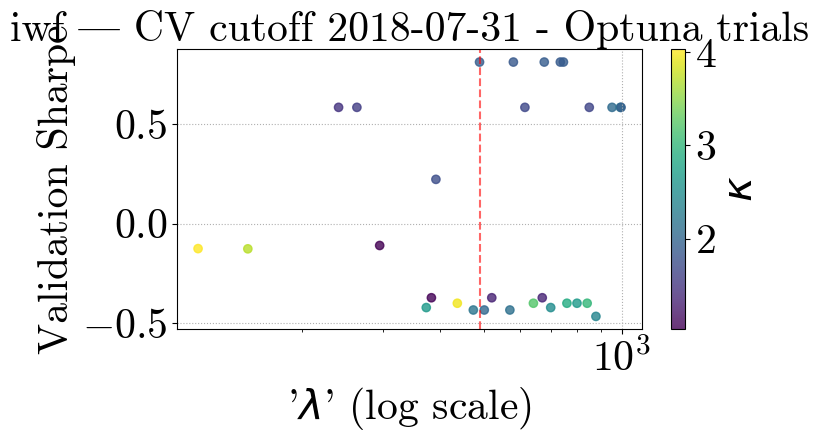

[I 2025-05-06 00:19:26,414] A new study created in memory with name: no-name-2dbc9c84-0024-4167-bc1e-2c40684d240c
[I 2025-05-06 00:19:27,904] Trial 0 finished with value: 1.0313840716670115 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.0313840716670115.
[I 2025-05-06 00:19:29,279] Trial 1 finished with value: 1.0313840716670115 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 1.0313840716670115.
[I 2025-05-06 00:19:30,942] Trial 2 finished with value: 1.0661482776714961 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 1.0661482776714961.
[I 2025-05-06 00:19:33,810] Trial 3 finished with value: 1.3582410834654433 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 1.3582410834654433.
[I 2025-05-06 00:19:35,212] Trial 4 finished with value: 1.0313840716670115 and paramet

Optuna best λ=110.6778, κ=4.1043171843019195, Sharpe=1.4377


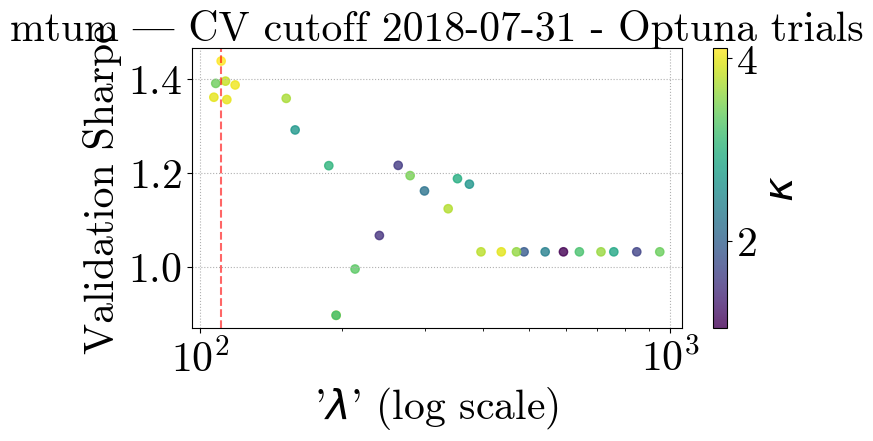

[I 2025-05-06 00:20:27,056] A new study created in memory with name: no-name-ce253ba3-e304-4f24-8055-25acf6218ec7
[I 2025-05-06 00:20:28,454] Trial 0 finished with value: 0.45715484506004617 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.45715484506004617.
[I 2025-05-06 00:20:29,755] Trial 1 finished with value: 0.45715484506004617 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.45715484506004617.
[I 2025-05-06 00:20:32,100] Trial 2 finished with value: 0.6412127832681748 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.6412127832681748.
[I 2025-05-06 00:20:34,762] Trial 3 finished with value: 0.3929652279523663 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.6412127832681748.
[I 2025-05-06 00:20:36,033] Trial 4 finished with value: 0.45715484506004617 and pa

Optuna best λ=488.7505, κ=1.9095393660962992, Sharpe=0.8852


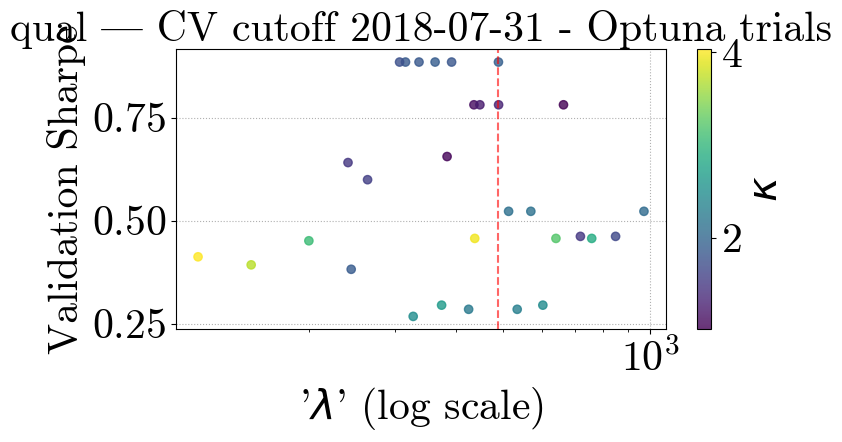

[I 2025-05-06 00:21:41,203] A new study created in memory with name: no-name-936f0995-56d2-436a-a1f9-00dac147606c
[I 2025-05-06 00:21:42,530] Trial 0 finished with value: -0.358827108732753 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.358827108732753.
[I 2025-05-06 00:21:43,898] Trial 1 finished with value: -0.358827108732753 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.358827108732753.
[I 2025-05-06 00:21:45,462] Trial 2 finished with value: -0.02065939782576479 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.02065939782576479.
[I 2025-05-06 00:21:47,616] Trial 3 finished with value: 0.053119302068857 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.053119302068857.
[I 2025-05-06 00:21:48,860] Trial 4 finished with value: -0.358827108732753 and param

Optuna best λ=849.1984, κ=1.6631574710979753, Sharpe=0.2878


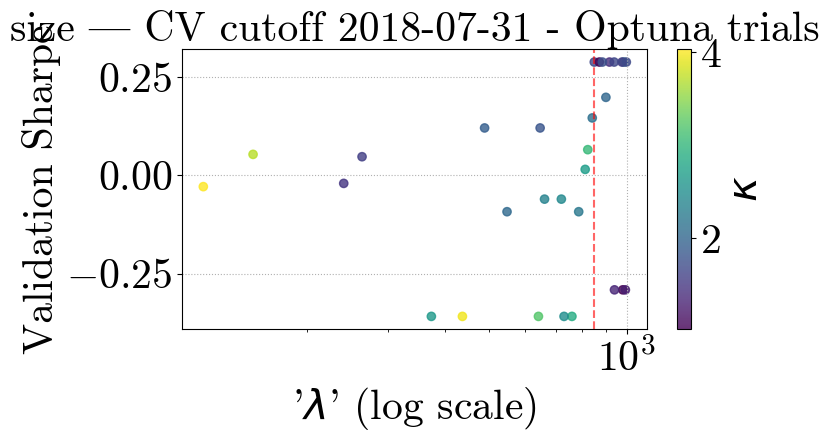

[I 2025-05-06 00:22:16,061] A new study created in memory with name: no-name-7c81be7d-5c6b-4851-bc39-f8778ea56341
[I 2025-05-06 00:22:17,957] Trial 0 finished with value: -0.5081636089050469 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.5081636089050469.
[I 2025-05-06 00:22:19,800] Trial 1 finished with value: -0.02857046241574455 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.02857046241574455.
[I 2025-05-06 00:22:21,535] Trial 2 finished with value: -0.438803335497641 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.02857046241574455.
[I 2025-05-06 00:22:23,939] Trial 3 finished with value: -0.41231790073152375 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 1 with value: -0.02857046241574455.
[I 2025-05-06 00:22:25,780] Trial 4 finished with value: -0.028570462415744

Optuna best λ=608.4955, κ=1.8703233246081146, Sharpe=0.0971


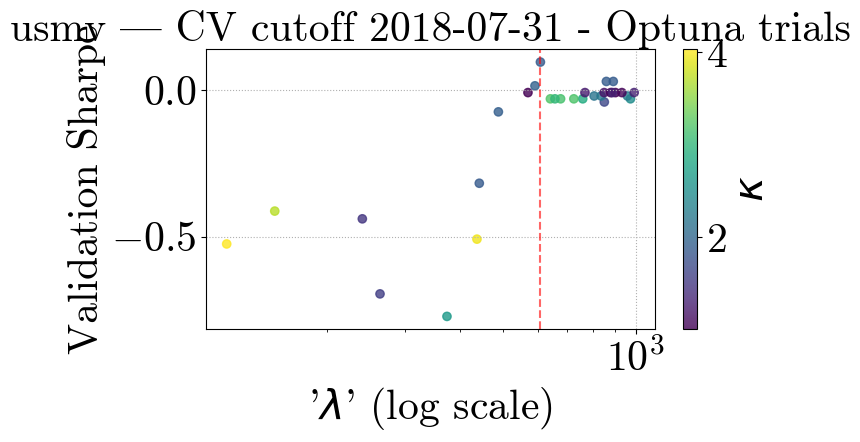

[I 2025-05-06 00:23:04,399] A new study created in memory with name: no-name-802ed364-46a6-4ad0-b558-7acdf8f2e37b
[I 2025-05-06 00:23:06,210] Trial 0 finished with value: 0.7596830718451636 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.7596830718451636.
[I 2025-05-06 00:23:07,433] Trial 1 finished with value: 0.7173330969959526 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.7596830718451636.
[I 2025-05-06 00:23:09,540] Trial 2 finished with value: 0.5304045175383505 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.7596830718451636.
[I 2025-05-06 00:23:11,195] Trial 3 finished with value: 0.6460058771670192 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.7596830718451636.
[I 2025-05-06 00:23:12,447] Trial 4 finished with value: 0.6636683713146954 and paramet

Optuna best λ=476.5077, κ=2.791390873903242, Sharpe=0.8782


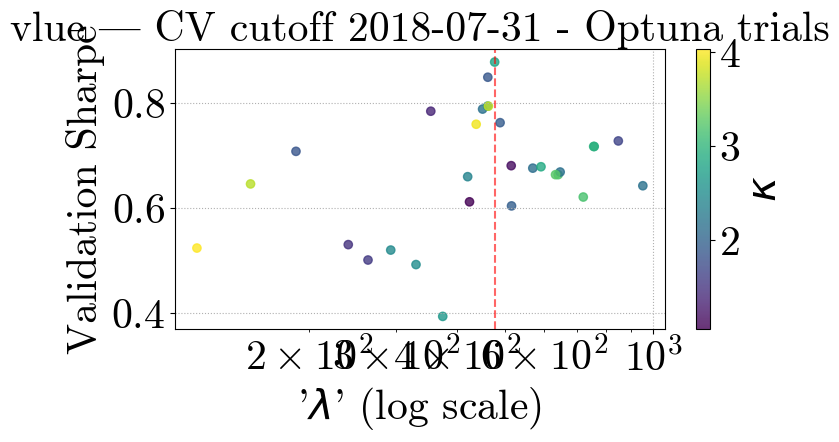

[I 2025-05-06 00:23:54,036] A new study created in memory with name: no-name-39e5e0a1-b4ea-42b0-8099-481565e20869
[I 2025-05-06 00:23:55,497] Trial 0 finished with value: 0.19528829785995497 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.19528829785995497.
[I 2025-05-06 00:23:56,670] Trial 1 finished with value: 0.133005772751673 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.19528829785995497.
[I 2025-05-06 00:24:00,454] Trial 2 finished with value: 0.42777521734365637 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.42777521734365637.
[I 2025-05-06 00:24:02,725] Trial 3 finished with value: 0.07277461216719085 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.42777521734365637.
[I 2025-05-06 00:24:03,941] Trial 4 finished with value: -0.10710713691842388 and

Optuna best λ=373.8180, κ=2.638869763709691, Sharpe=0.5532


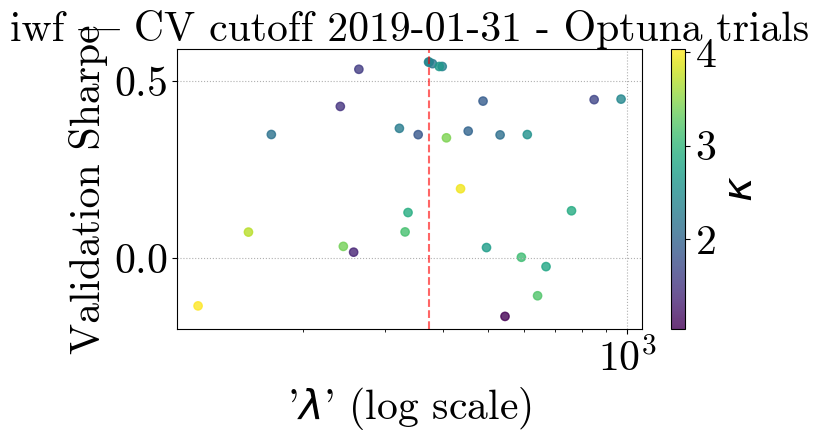

[I 2025-05-06 00:25:05,021] A new study created in memory with name: no-name-6a29238e-9d45-463f-9953-a4b0ca87658c
[I 2025-05-06 00:25:06,412] Trial 0 finished with value: 0.6302420478156143 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.6302420478156143.
[I 2025-05-06 00:25:07,717] Trial 1 finished with value: 0.9361815235097943 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.9361815235097943.
[I 2025-05-06 00:25:09,310] Trial 2 finished with value: 0.9873858333080803 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.9873858333080803.
[I 2025-05-06 00:25:12,211] Trial 3 finished with value: 0.7939202808855574 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.9873858333080803.
[I 2025-05-06 00:25:13,514] Trial 4 finished with value: 0.9432081513279954 and paramet

Optuna best λ=118.5260, κ=4.029130915629118, Sharpe=1.0324


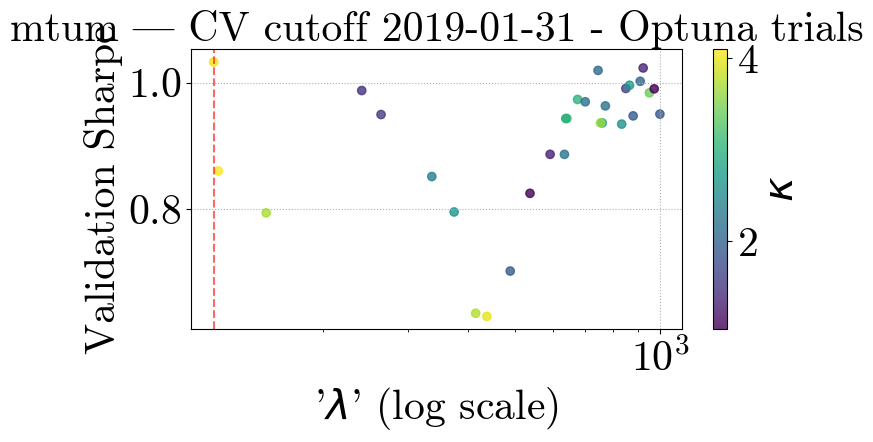

[I 2025-05-06 00:25:52,087] A new study created in memory with name: no-name-bf61d851-9fa7-44ca-b65e-9fa2bef0ac70
[I 2025-05-06 00:25:53,587] Trial 0 finished with value: -0.026504308711194774 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.026504308711194774.
[I 2025-05-06 00:25:55,338] Trial 1 finished with value: -0.09028027063562453 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.026504308711194774.
[I 2025-05-06 00:26:00,179] Trial 2 finished with value: -0.01735772986668134 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.01735772986668134.
[I 2025-05-06 00:26:02,624] Trial 3 finished with value: -0.04322340816186568 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 2 with value: -0.01735772986668134.
[I 2025-05-06 00:26:03,983] Trial 4 finished with value: 0.021817793

Optuna best λ=794.3389, κ=1.0536965098707882, Sharpe=0.1198


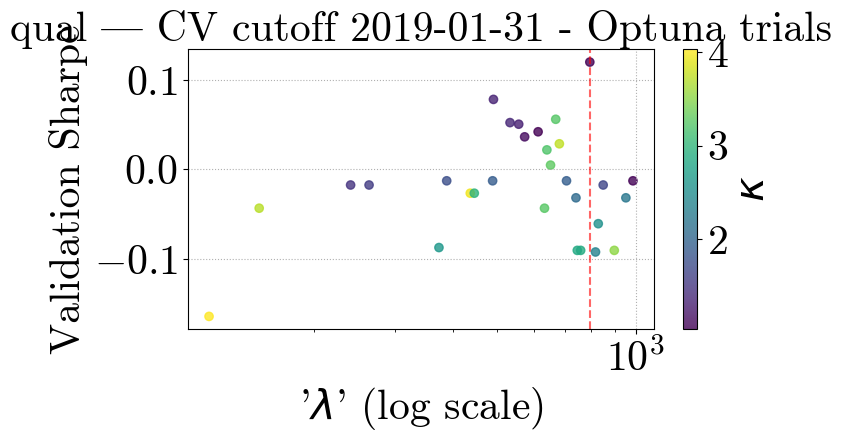

[I 2025-05-06 00:26:55,952] A new study created in memory with name: no-name-480e1e63-58f0-4f71-9fed-7c76561b074f
[I 2025-05-06 00:26:57,380] Trial 0 finished with value: 0.04767709352532157 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.04767709352532157.
[I 2025-05-06 00:26:58,721] Trial 1 finished with value: 0.04767709352532157 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.04767709352532157.
[I 2025-05-06 00:27:01,042] Trial 2 finished with value: -0.21875372293313225 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.04767709352532157.
[I 2025-05-06 00:27:03,477] Trial 3 finished with value: 0.1845005213460015 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.1845005213460015.
[I 2025-05-06 00:27:04,862] Trial 4 finished with value: 0.04767709352532157 and

Optuna best λ=152.2753, κ=3.705159593645523, Sharpe=0.1845


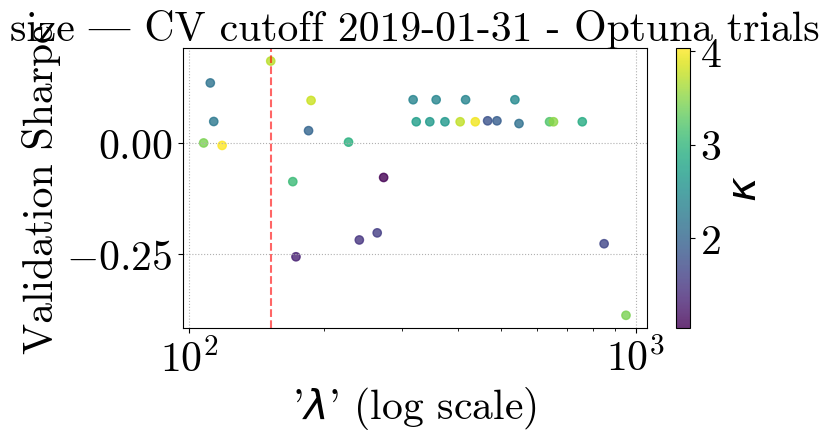

[I 2025-05-06 00:27:58,001] A new study created in memory with name: no-name-1c49b76d-6629-45f9-b514-89258b1bee6d
[I 2025-05-06 00:27:59,585] Trial 0 finished with value: -0.24480236785624862 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.24480236785624862.
[I 2025-05-06 00:28:00,997] Trial 1 finished with value: 0.01236383604620918 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.01236383604620918.
[I 2025-05-06 00:28:02,783] Trial 2 finished with value: -0.5379948863454015 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.01236383604620918.
[I 2025-05-06 00:28:04,691] Trial 3 finished with value: -0.4109004583178838 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.01236383604620918.
[I 2025-05-06 00:28:06,092] Trial 4 finished with value: 0.01236383604620918 

Optuna best λ=677.0049, κ=1.8460609869688809, Sharpe=0.0690


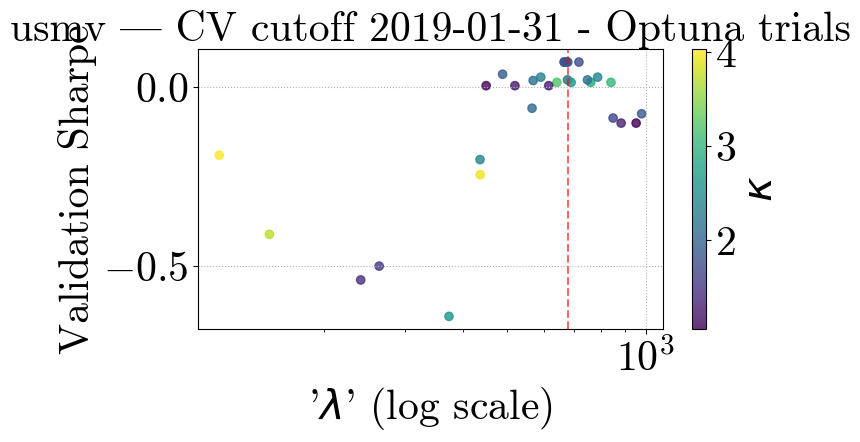

[I 2025-05-06 00:28:44,582] A new study created in memory with name: no-name-22cde7d1-38dd-46ea-a78e-c7427757b5a8
[I 2025-05-06 00:28:47,049] Trial 0 finished with value: 0.19668528604482716 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.19668528604482716.
[I 2025-05-06 00:28:48,754] Trial 1 finished with value: -0.06984376413818394 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.19668528604482716.
[I 2025-05-06 00:28:50,300] Trial 2 finished with value: 0.24762734354355326 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.24762734354355326.
[I 2025-05-06 00:28:52,612] Trial 3 finished with value: 0.7492201841867249 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.7492201841867249.
[I 2025-05-06 00:28:54,445] Trial 4 finished with value: 0.007162617750521167 an

Optuna best λ=207.8218, κ=3.6516202246636627, Sharpe=0.7691


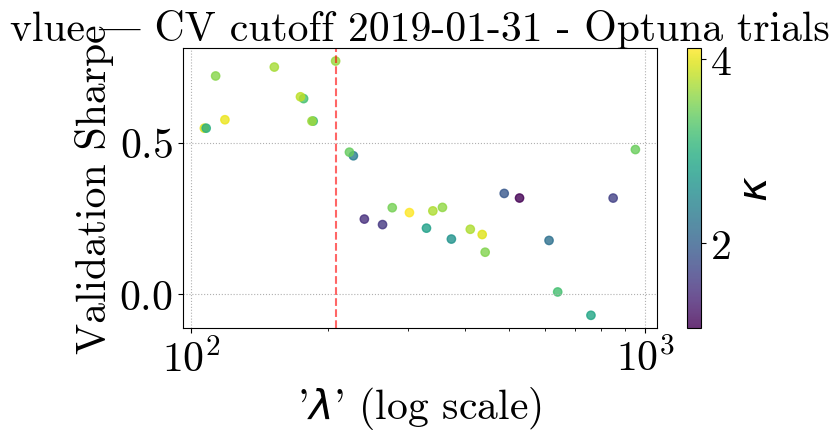

[I 2025-05-06 00:29:45,592] A new study created in memory with name: no-name-0cc35cf8-8516-4979-b538-8fd3885567fe
[I 2025-05-06 00:29:47,500] Trial 0 finished with value: 0.5337415941826628 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.5337415941826628.
[I 2025-05-06 00:29:49,349] Trial 1 finished with value: 0.41148638268996357 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.5337415941826628.
[I 2025-05-06 00:29:53,346] Trial 2 finished with value: 0.8325693340129943 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.8325693340129943.
[I 2025-05-06 00:29:56,463] Trial 3 finished with value: 0.3595947495635308 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.8325693340129943.
[I 2025-05-06 00:29:58,335] Trial 4 finished with value: 0.33661666872178847 and param

Optuna best λ=240.4168, κ=1.487187364027523, Sharpe=0.8326


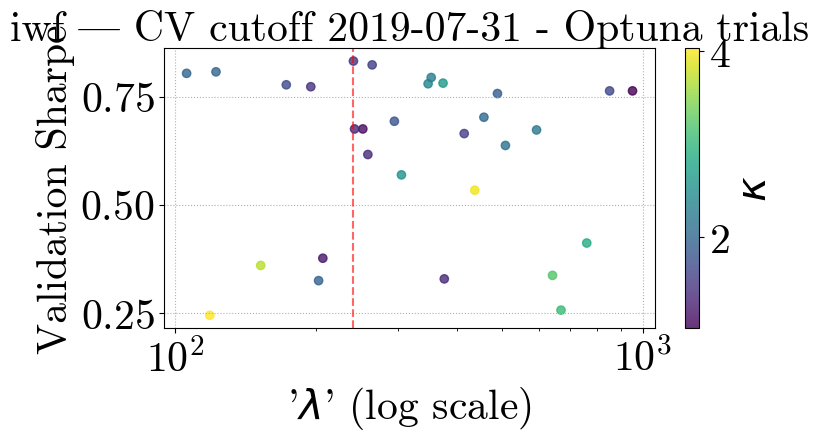

[I 2025-05-06 00:31:04,851] A new study created in memory with name: no-name-5982cd4b-011b-441b-ab0e-c00149fca872
[I 2025-05-06 00:31:06,447] Trial 0 finished with value: 0.8728242393859833 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.8728242393859833.
[I 2025-05-06 00:31:07,852] Trial 1 finished with value: 1.1522102771428224 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: 1.1522102771428224.
[I 2025-05-06 00:31:09,367] Trial 2 finished with value: 1.2315537744257878 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 1.2315537744257878.
[I 2025-05-06 00:31:12,932] Trial 3 finished with value: 1.0693754394267676 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 2 with value: 1.2315537744257878.
[I 2025-05-06 00:31:14,382] Trial 4 finished with value: 1.1430785283003877 and paramet

Optuna best λ=979.9399, κ=2.120648683333912, Sharpe=1.3495


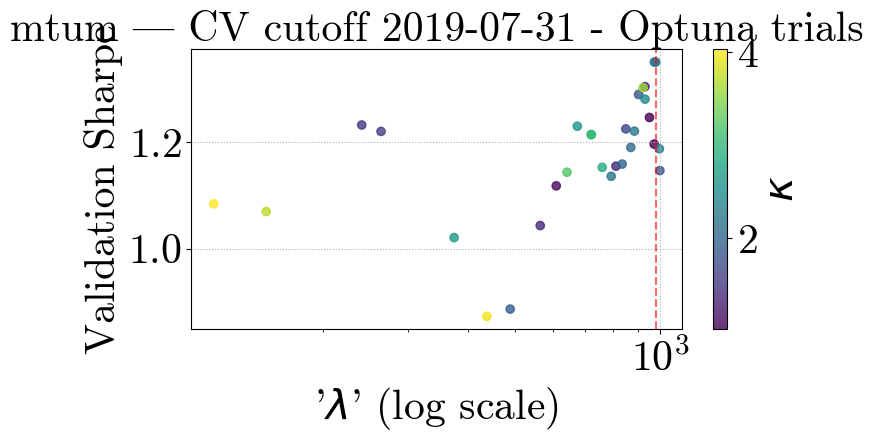

[I 2025-05-06 00:31:48,307] A new study created in memory with name: no-name-b7729473-4b4e-40ec-8db1-5cc33a49bac3
[I 2025-05-06 00:31:50,389] Trial 0 finished with value: 0.5278698689065212 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.5278698689065212.
[I 2025-05-06 00:31:52,172] Trial 1 finished with value: 0.5455986127099818 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.5455986127099818.
[I 2025-05-06 00:31:56,938] Trial 2 finished with value: 0.47156948578957963 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.5455986127099818.
[I 2025-05-06 00:31:59,398] Trial 3 finished with value: 0.13491829236024663 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.5455986127099818.
[I 2025-05-06 00:32:01,292] Trial 4 finished with value: 0.7415666674419227 and param

Optuna best λ=474.8974, κ=1.3745166221584948, Sharpe=0.8589


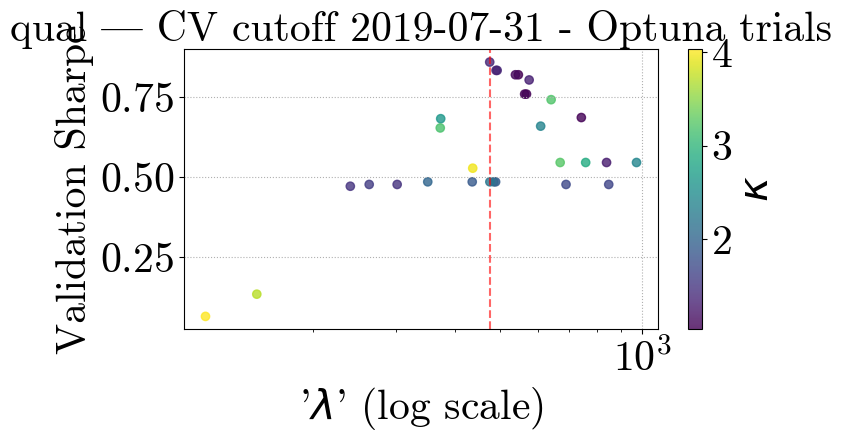

[I 2025-05-06 00:33:03,960] A new study created in memory with name: no-name-540449d5-8032-4e6b-b85b-b7a34db90127
[I 2025-05-06 00:33:05,684] Trial 0 finished with value: 0.3540931365306978 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.3540931365306978.
[I 2025-05-06 00:33:06,983] Trial 1 finished with value: -0.2863582590337769 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.3540931365306978.
[I 2025-05-06 00:33:08,508] Trial 2 finished with value: -0.3253492121201885 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.3540931365306978.
[I 2025-05-06 00:33:11,441] Trial 3 finished with value: -0.05895780015793035 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.3540931365306978.
[I 2025-05-06 00:33:12,901] Trial 4 finished with value: 0.3540931365306978 and par

Optuna best λ=656.4179, κ=2.2256718351156524, Sharpe=0.3541


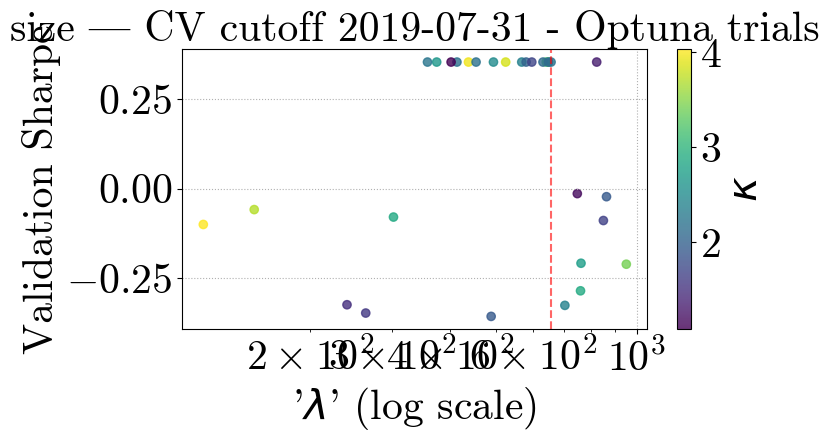

[I 2025-05-06 00:33:52,356] A new study created in memory with name: no-name-57f21b7f-dff4-47a2-a741-d6561d657d60
[I 2025-05-06 00:33:54,153] Trial 0 finished with value: -0.5581338680520702 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.5581338680520702.
[I 2025-05-06 00:33:55,438] Trial 1 finished with value: -0.040058563043987236 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.040058563043987236.
[I 2025-05-06 00:33:57,017] Trial 2 finished with value: -0.5672638987015464 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.040058563043987236.
[I 2025-05-06 00:34:00,491] Trial 3 finished with value: -0.2284038907104395 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 1 with value: -0.040058563043987236.
[I 2025-05-06 00:34:01,658] Trial 4 finished with value: -0.59589526813

Optuna best λ=849.1984, κ=1.6631574710979753, Sharpe=0.2027


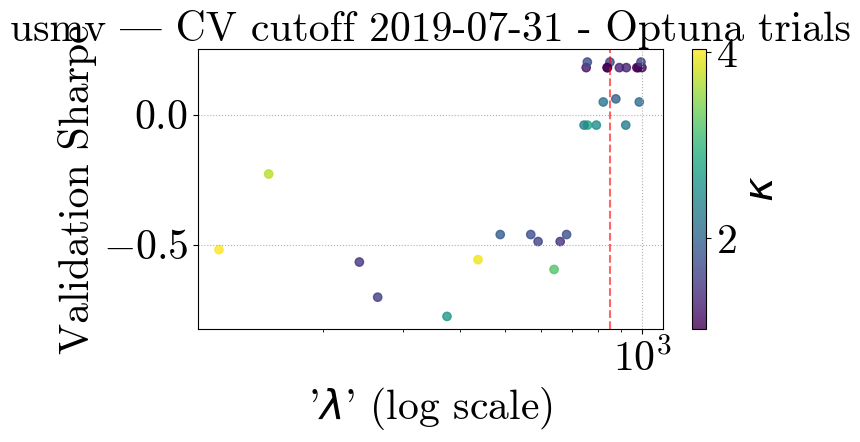

[I 2025-05-06 00:34:33,921] A new study created in memory with name: no-name-56b8a612-7842-4607-bab2-d2fdf1f4ca3e
[I 2025-05-06 00:34:36,585] Trial 0 finished with value: 0.6067981669916354 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.6067981669916354.
[I 2025-05-06 00:34:37,956] Trial 1 finished with value: 0.36903606868686817 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.6067981669916354.
[I 2025-05-06 00:34:39,362] Trial 2 finished with value: 0.58101814673125 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.6067981669916354.
[I 2025-05-06 00:34:41,751] Trial 3 finished with value: 0.7174075601588531 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.7174075601588531.
[I 2025-05-06 00:34:43,609] Trial 4 finished with value: 0.5327223811615802 and paramete

Optuna best λ=118.5260, κ=4.029130915629118, Sharpe=0.7838


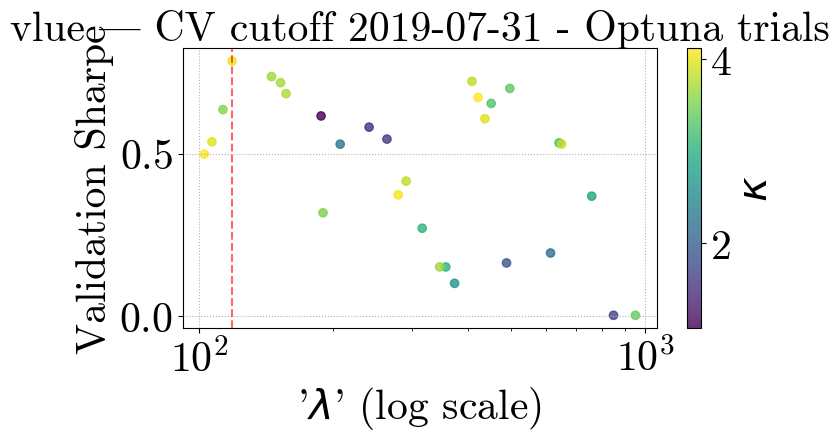

[I 2025-05-06 00:35:37,132] A new study created in memory with name: no-name-19435635-3052-4fad-952f-9261bd0ccb2f
[I 2025-05-06 00:35:38,648] Trial 0 finished with value: 0.5527650542487832 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.5527650542487832.
[I 2025-05-06 00:35:39,829] Trial 1 finished with value: 0.4786384549609889 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.5527650542487832.
[I 2025-05-06 00:35:43,524] Trial 2 finished with value: 0.9980586013610164 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.9980586013610164.
[I 2025-05-06 00:35:47,682] Trial 3 finished with value: 0.4136583512510139 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.9980586013610164.
[I 2025-05-06 00:35:48,963] Trial 4 finished with value: 0.24891580621647114 and parame

Optuna best λ=660.9991, κ=1.4408401917881994, Sharpe=1.2110


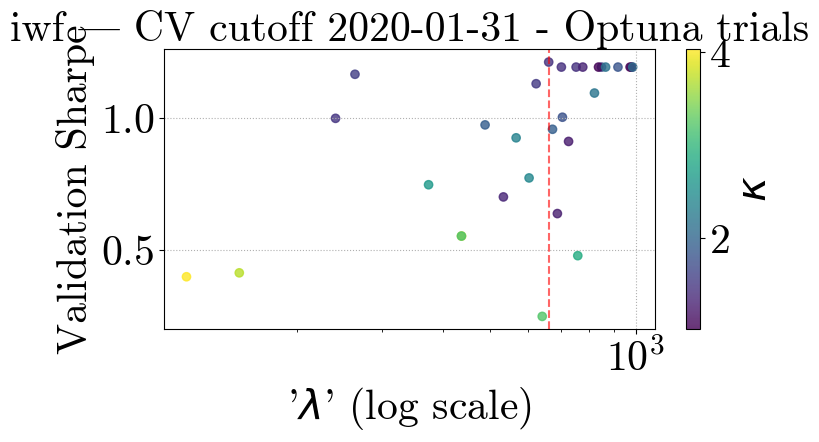

[I 2025-05-06 00:36:33,475] A new study created in memory with name: no-name-65be27a1-68bb-421b-a505-fd38cd244158
[I 2025-05-06 00:36:35,117] Trial 0 finished with value: 1.1451258547254997 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.1451258547254997.
[I 2025-05-06 00:36:36,589] Trial 1 finished with value: 1.4405431928906298 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: 1.4405431928906298.
[I 2025-05-06 00:36:39,079] Trial 2 finished with value: 1.5139169275056952 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 1.5139169275056952.
[I 2025-05-06 00:36:43,007] Trial 3 finished with value: 1.344581247433495 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 2 with value: 1.5139169275056952.
[I 2025-05-06 00:36:44,537] Trial 4 finished with value: 1.4972012079206232 and paramete

Optuna best λ=914.6329, κ=2.750202721529061, Sharpe=1.5978


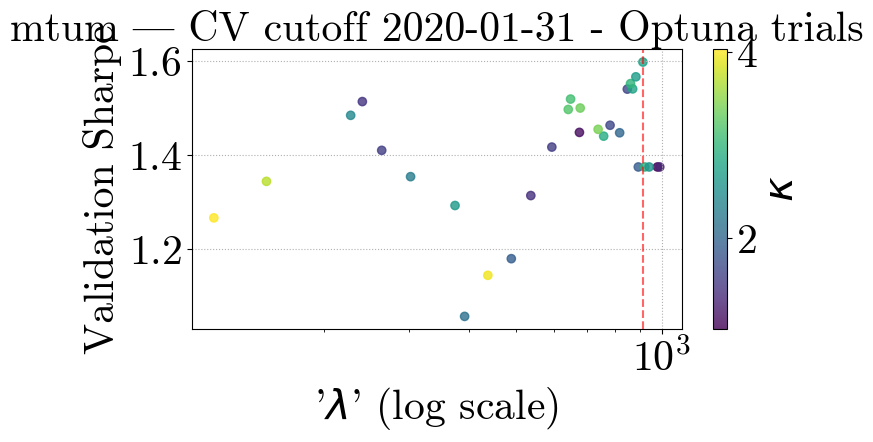

[I 2025-05-06 00:37:29,408] A new study created in memory with name: no-name-ff995f08-cf7a-4c09-85c8-f276d4d8a5b0
[I 2025-05-06 00:37:31,495] Trial 0 finished with value: 0.7235830706905565 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.7235830706905565.
[I 2025-05-06 00:37:33,254] Trial 1 finished with value: 1.0616314001148444 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: 1.0616314001148444.
[I 2025-05-06 00:37:35,442] Trial 2 finished with value: -0.27681025817909116 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: 1.0616314001148444.
[I 2025-05-06 00:37:38,353] Trial 3 finished with value: -0.35359986659736 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 1 with value: 1.0616314001148444.
[I 2025-05-06 00:37:40,142] Trial 4 finished with value: 1.0531055872388888 and parame

Optuna best λ=336.0442, κ=1.2819104463600477, Sharpe=1.1639


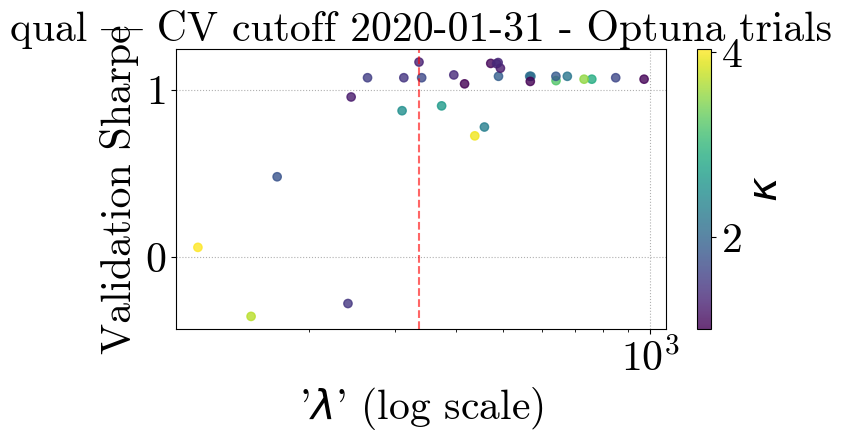

[I 2025-05-06 00:38:50,017] A new study created in memory with name: no-name-31a8881f-269d-4a54-9661-b5adc741fa46
[I 2025-05-06 00:38:51,422] Trial 0 finished with value: 0.3499115737633395 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.3499115737633395.
[I 2025-05-06 00:38:52,861] Trial 1 finished with value: 0.3499115737633395 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.3499115737633395.
[I 2025-05-06 00:38:54,781] Trial 2 finished with value: 0.3499115737633395 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.3499115737633395.
[I 2025-05-06 00:38:59,321] Trial 3 finished with value: -0.22395727817888889 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.3499115737633395.
[I 2025-05-06 00:39:00,808] Trial 4 finished with value: 0.3499115737633395 and param

Optuna best λ=333.1822, κ=2.2894180870739205, Sharpe=0.3499


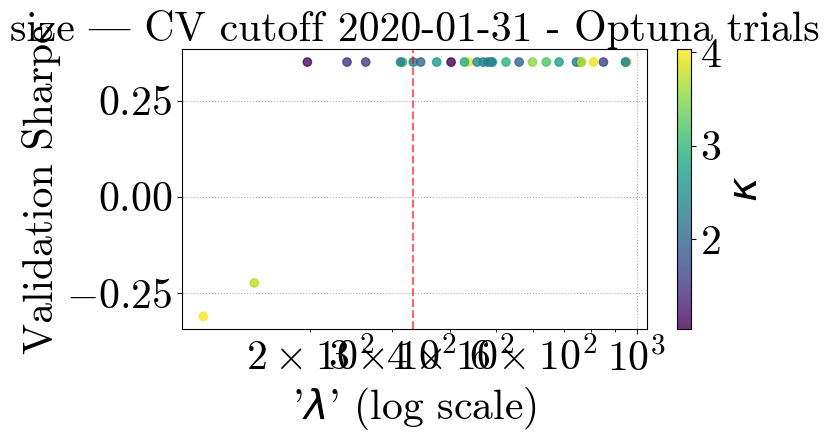

[I 2025-05-06 00:39:45,930] A new study created in memory with name: no-name-2e95d29e-cc2f-48ea-954d-17260794a3c3
[I 2025-05-06 00:39:47,437] Trial 0 finished with value: -0.5403997689031461 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.5403997689031461.
[I 2025-05-06 00:39:48,717] Trial 1 finished with value: 0.5325092518820823 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.5325092518820823.
[I 2025-05-06 00:39:50,822] Trial 2 finished with value: -0.8974338602510995 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.5325092518820823.
[I 2025-05-06 00:39:53,288] Trial 3 finished with value: -0.07136846129413324 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.5325092518820823.
[I 2025-05-06 00:39:54,581] Trial 4 finished with value: 0.5325092518820823 and pa

Optuna best λ=849.1984, κ=1.6631574710979753, Sharpe=0.5325


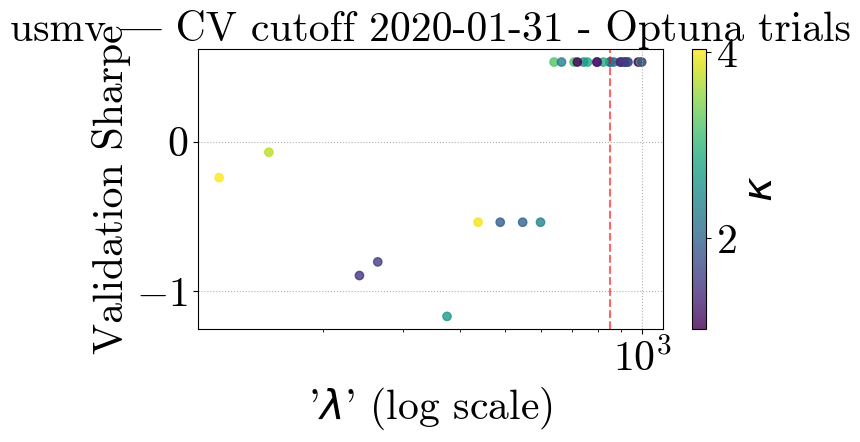

[I 2025-05-06 00:40:36,866] A new study created in memory with name: no-name-437e40ec-f6c5-491b-9dd5-159dc4e93e6b
[I 2025-05-06 00:40:39,408] Trial 0 finished with value: -0.2221874435826729 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.2221874435826729.
[I 2025-05-06 00:40:41,230] Trial 1 finished with value: -0.26910514344472547 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.2221874435826729.
[I 2025-05-06 00:40:43,528] Trial 2 finished with value: -0.14392443765413768 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.14392443765413768.
[I 2025-05-06 00:40:45,277] Trial 3 finished with value: -0.49756240275664093 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 2 with value: -0.14392443765413768.
[I 2025-05-06 00:40:47,138] Trial 4 finished with value: -0.52541144394766

Optuna best λ=262.0603, κ=1.7980101744817147, Sharpe=-0.0201


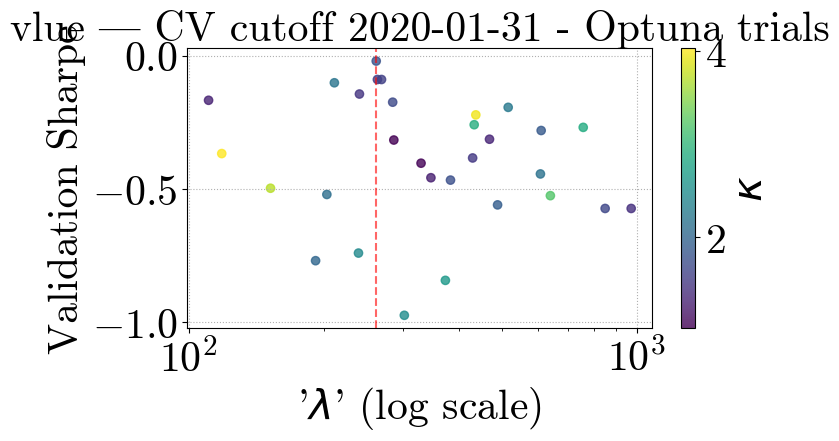

[I 2025-05-06 00:41:30,150] A new study created in memory with name: no-name-b3ca8f5e-9182-4c66-9a7b-a6c395c23751
[I 2025-05-06 00:41:32,220] Trial 0 finished with value: 1.2101847391402498 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.2101847391402498.
[I 2025-05-06 00:41:33,972] Trial 1 finished with value: 1.0421823795975558 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 1.2101847391402498.
[I 2025-05-06 00:41:38,443] Trial 2 finished with value: 1.3909763742304566 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 1.3909763742304566.
[I 2025-05-06 00:41:41,278] Trial 3 finished with value: 1.0841108893107945 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 2 with value: 1.3909763742304566.
[I 2025-05-06 00:41:43,130] Trial 4 finished with value: 1.0494484926504988 and paramet

Optuna best λ=118.5260, κ=4.029130915629118, Sharpe=1.4821


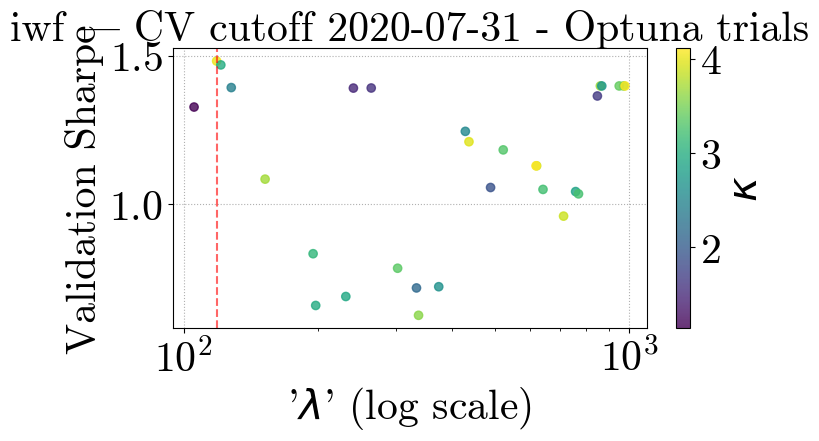

[I 2025-05-06 00:42:37,229] A new study created in memory with name: no-name-f31a2174-ef8e-4474-9904-661a22c3693f
[I 2025-05-06 00:42:38,808] Trial 0 finished with value: 0.40766134651060976 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.40766134651060976.
[I 2025-05-06 00:42:40,139] Trial 1 finished with value: 1.1199482067801458 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: 1.1199482067801458.
[I 2025-05-06 00:42:42,719] Trial 2 finished with value: 1.0362198817317967 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: 1.1199482067801458.
[I 2025-05-06 00:42:45,772] Trial 3 finished with value: 0.8139696525500035 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 1 with value: 1.1199482067801458.
[I 2025-05-06 00:42:47,183] Trial 4 finished with value: 1.128354910836678 and parame

Optuna best λ=685.9142, κ=2.6083069970554638, Sharpe=1.1687


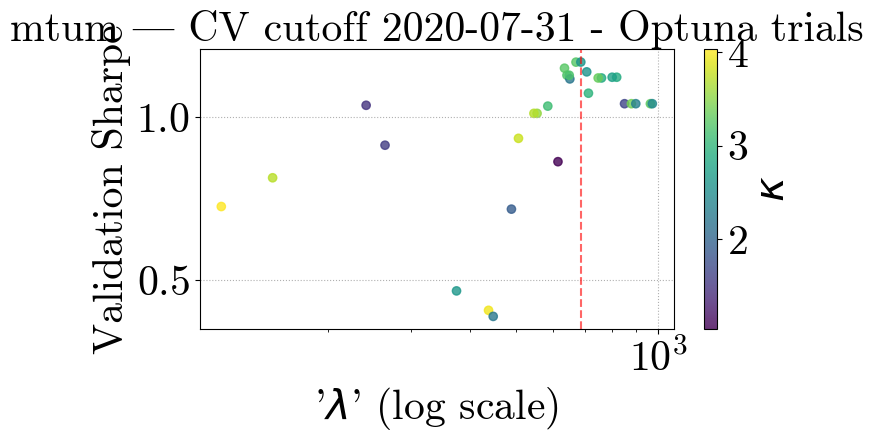

[I 2025-05-06 00:43:30,250] A new study created in memory with name: no-name-e3c4a754-320c-4451-b255-bbdc145eb9db
[I 2025-05-06 00:43:32,953] Trial 0 finished with value: -0.13866164130667633 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.13866164130667633.
[I 2025-05-06 00:43:35,154] Trial 1 finished with value: 0.6903136504168149 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.6903136504168149.
[I 2025-05-06 00:43:37,539] Trial 2 finished with value: -0.6166597175727273 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.6903136504168149.
[I 2025-05-06 00:43:40,758] Trial 3 finished with value: -0.15591145150466745 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.6903136504168149.
[I 2025-05-06 00:43:43,098] Trial 4 finished with value: 0.6029657554932849 and 

Optuna best λ=758.7945, κ=2.869673679819506, Sharpe=0.6903


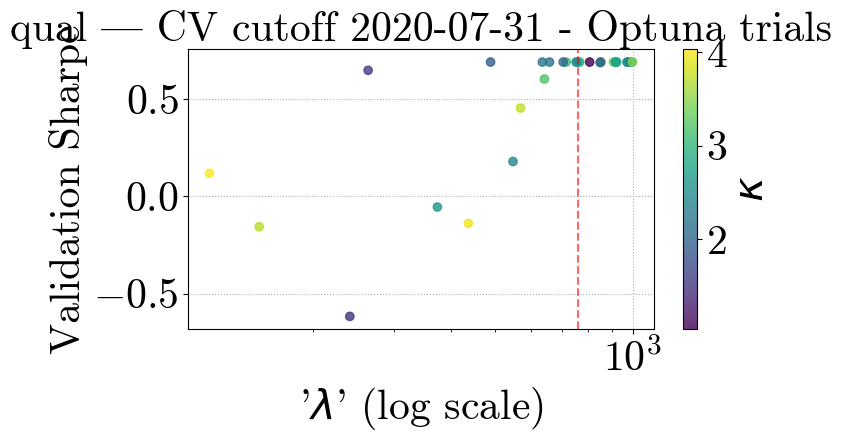

[I 2025-05-06 00:44:45,775] A new study created in memory with name: no-name-90c081c8-c669-433f-b1b3-754634a48f70
[I 2025-05-06 00:44:48,141] Trial 0 finished with value: 0.5761558960267503 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.5761558960267503.
[I 2025-05-06 00:44:50,043] Trial 1 finished with value: 0.20154512963863178 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.5761558960267503.
[I 2025-05-06 00:44:52,949] Trial 2 finished with value: -0.31935322130537125 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.5761558960267503.
[I 2025-05-06 00:44:55,700] Trial 3 finished with value: -0.1332698563898071 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.5761558960267503.
[I 2025-05-06 00:44:57,678] Trial 4 finished with value: 0.28372439237711966 and pa

Optuna best λ=950.6229, κ=3.4091247782378664, Sharpe=0.6650


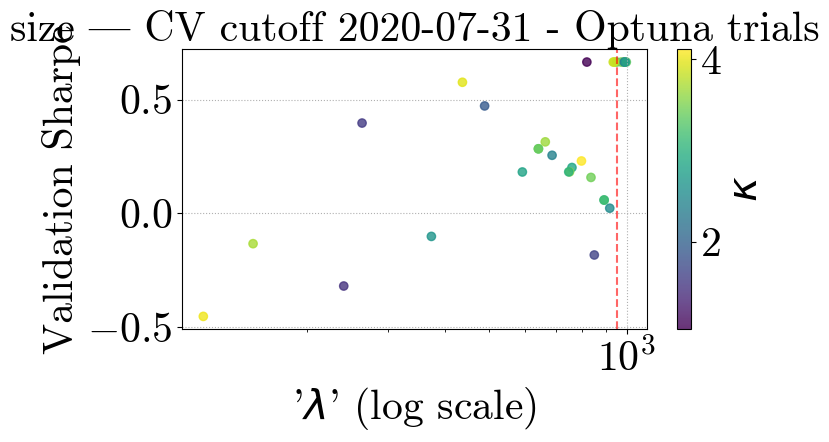

[I 2025-05-06 00:45:33,332] A new study created in memory with name: no-name-970dfbe5-bba3-4609-83f2-079459e299f6
[I 2025-05-06 00:45:34,727] Trial 0 finished with value: -1.274270996671171 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.274270996671171.
[I 2025-05-06 00:45:36,070] Trial 1 finished with value: 0.013560326529959778 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.013560326529959778.
[I 2025-05-06 00:45:37,930] Trial 2 finished with value: -1.1069216060554863 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.013560326529959778.
[I 2025-05-06 00:45:40,477] Trial 3 finished with value: -0.6100454613612565 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.013560326529959778.
[I 2025-05-06 00:45:41,862] Trial 4 finished with value: 0.013560326529959778

Optuna best λ=922.9497, κ=1.952868800025168, Sharpe=0.0136


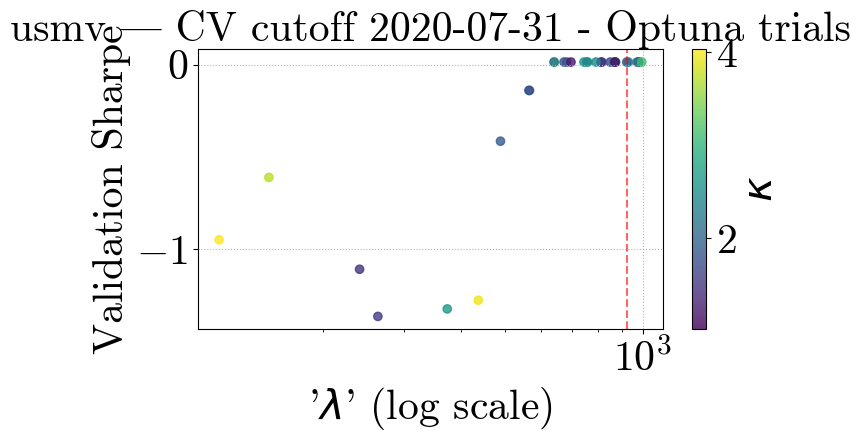

[I 2025-05-06 00:46:19,194] A new study created in memory with name: no-name-4e048e1a-c869-4d87-adb9-7f9b9ff7ccc2
[I 2025-05-06 00:46:21,459] Trial 0 finished with value: -0.10909712472652494 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.10909712472652494.
[I 2025-05-06 00:46:22,941] Trial 1 finished with value: -0.507245628310628 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.10909712472652494.
[I 2025-05-06 00:46:25,092] Trial 2 finished with value: -0.19242297539570116 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.10909712472652494.
[I 2025-05-06 00:46:27,629] Trial 3 finished with value: 0.22389003052430784 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.22389003052430784.
[I 2025-05-06 00:46:29,158] Trial 4 finished with value: -0.537269725362005

Optuna best λ=145.2804, κ=3.671017647863116, Sharpe=0.2300


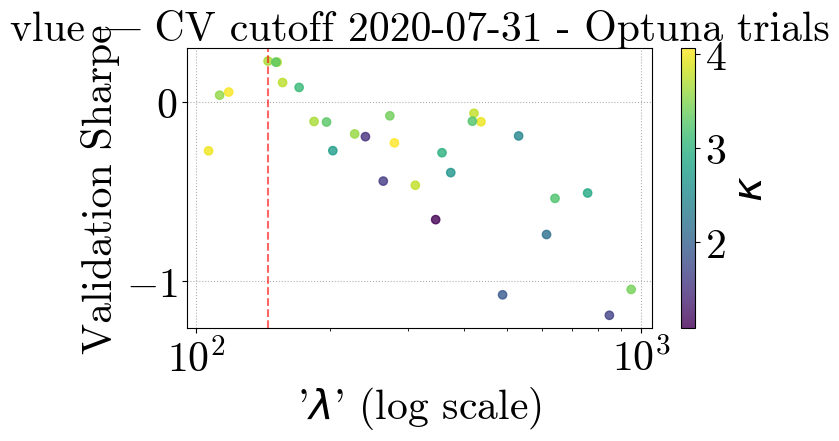

[I 2025-05-06 00:47:24,863] A new study created in memory with name: no-name-c3ff8072-d24d-4d66-8b49-0b5761275b7a
[I 2025-05-06 00:47:26,380] Trial 0 finished with value: 1.0363137537567038 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.0363137537567038.
[I 2025-05-06 00:47:27,786] Trial 1 finished with value: 0.8877873680746976 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 1.0363137537567038.
[I 2025-05-06 00:47:30,079] Trial 2 finished with value: 0.7247092683693902 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 1.0363137537567038.
[I 2025-05-06 00:47:32,896] Trial 3 finished with value: 0.9032729375979033 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 0 with value: 1.0363137537567038.
[I 2025-05-06 00:47:34,336] Trial 4 finished with value: 0.873522942470355 and paramete

Optuna best λ=609.0086, κ=2.2256718351156524, Sharpe=1.1804


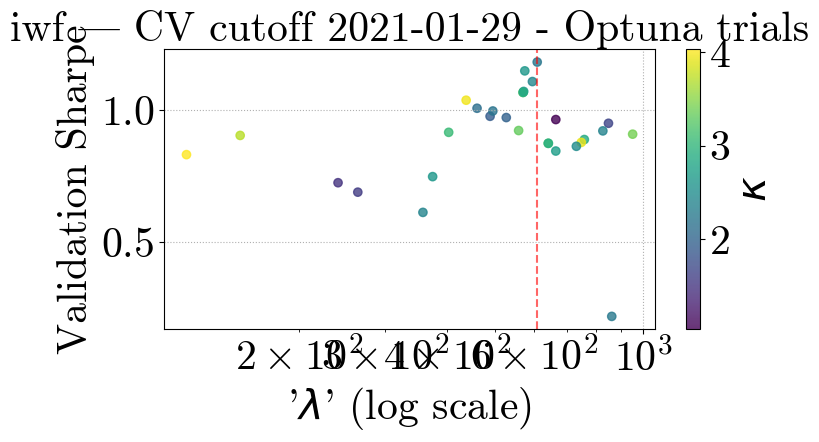

[I 2025-05-06 00:48:18,163] A new study created in memory with name: no-name-9779cce2-6b78-4123-baa9-0b0f4cad992a
[I 2025-05-06 00:48:19,732] Trial 0 finished with value: 0.451681038242956 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.451681038242956.
[I 2025-05-06 00:48:21,182] Trial 1 finished with value: 0.5899202606834315 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.5899202606834315.
[I 2025-05-06 00:48:24,461] Trial 2 finished with value: 0.2983089958860823 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.5899202606834315.
[I 2025-05-06 00:48:26,768] Trial 3 finished with value: 0.4622621852752881 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.5899202606834315.
[I 2025-05-06 00:48:28,254] Trial 4 finished with value: 0.5614861913869404 and parameter

Optuna best λ=813.3305, κ=1.6695052611115058, Sharpe=0.7380


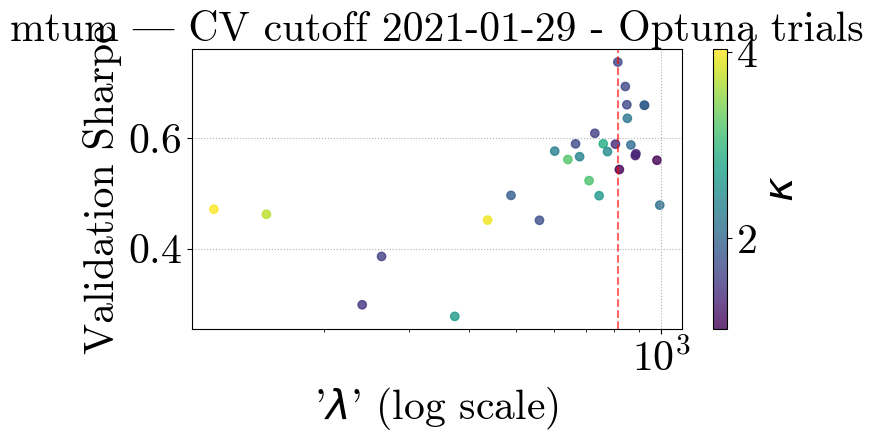

[I 2025-05-06 00:49:08,062] A new study created in memory with name: no-name-4effdca1-b9d9-41b0-831c-da6b1fc8c22c
[I 2025-05-06 00:49:10,288] Trial 0 finished with value: -0.2361837375965246 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.2361837375965246.
[I 2025-05-06 00:49:12,117] Trial 1 finished with value: 0.08894032203406557 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.08894032203406557.
[I 2025-05-06 00:49:14,307] Trial 2 finished with value: -0.31325879830203635 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.08894032203406557.
[I 2025-05-06 00:49:16,227] Trial 3 finished with value: 0.06984591998973008 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.08894032203406557.
[I 2025-05-06 00:49:18,201] Trial 4 finished with value: 0.19421968079249521 a

Optuna best λ=746.5423, κ=1.0592245812759584, Sharpe=0.5886


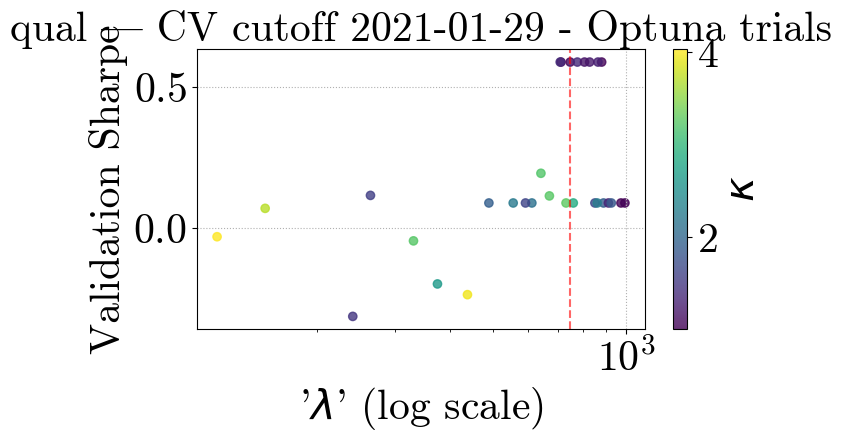

[I 2025-05-06 00:50:06,398] A new study created in memory with name: no-name-f9b5491e-98d3-4de6-b912-6ed07f5cce85
[I 2025-05-06 00:50:08,161] Trial 0 finished with value: 0.5605408300379631 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.5605408300379631.
[I 2025-05-06 00:50:09,697] Trial 1 finished with value: 0.47030073205606304 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.5605408300379631.
[I 2025-05-06 00:50:11,936] Trial 2 finished with value: 0.27750555041393205 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.5605408300379631.
[I 2025-05-06 00:50:15,995] Trial 3 finished with value: 0.10213582128409843 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.5605408300379631.
[I 2025-05-06 00:50:17,511] Trial 4 finished with value: 0.5504517814813047 and para

Optuna best λ=767.4686, κ=1.1492689898161275, Sharpe=0.6079


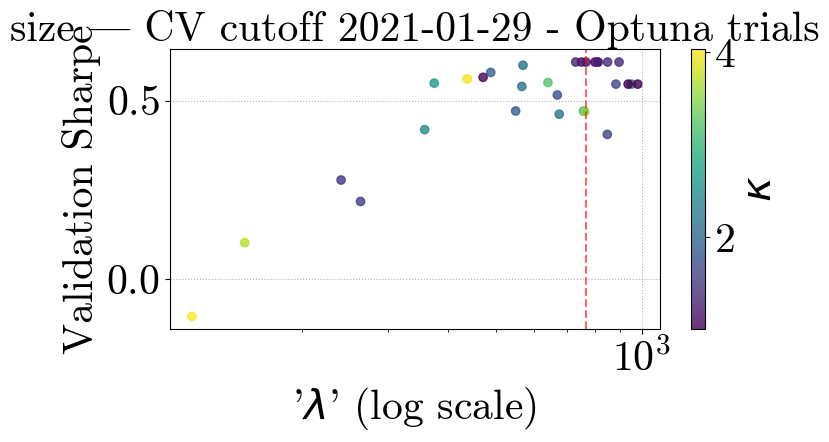

[I 2025-05-06 00:50:55,505] A new study created in memory with name: no-name-8603b57d-2735-447e-b85d-79063c6c6ee8
[I 2025-05-06 00:50:57,085] Trial 0 finished with value: -1.7013591080925339 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.7013591080925339.
[I 2025-05-06 00:50:58,413] Trial 1 finished with value: 0.09240394867082126 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.09240394867082126.
[I 2025-05-06 00:51:00,740] Trial 2 finished with value: -1.1811195054818278 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.09240394867082126.
[I 2025-05-06 00:51:03,154] Trial 3 finished with value: -0.3889442479502475 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.09240394867082126.
[I 2025-05-06 00:51:04,585] Trial 4 finished with value: -0.9673229398423094 an

Optuna best λ=988.4204, κ=2.2256718351156524, Sharpe=0.1221


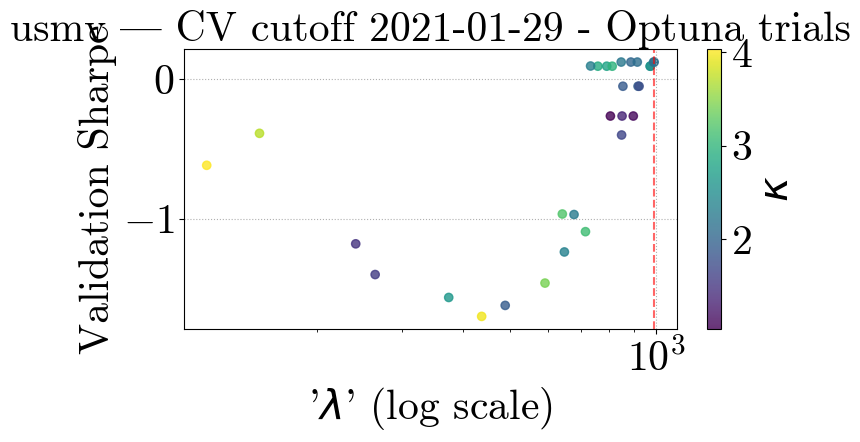

[I 2025-05-06 00:51:42,154] A new study created in memory with name: no-name-bf7787f8-4175-4ec6-8b30-f9ffdf6d0fad
[I 2025-05-06 00:51:43,633] Trial 0 finished with value: -0.004438622492763593 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.004438622492763593.
[I 2025-05-06 00:51:44,908] Trial 1 finished with value: -0.5939440193759408 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.004438622492763593.
[I 2025-05-06 00:51:47,232] Trial 2 finished with value: -0.12940472490924063 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.004438622492763593.
[I 2025-05-06 00:51:50,231] Trial 3 finished with value: 0.011054763660760095 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.011054763660760095.
[I 2025-05-06 00:51:51,609] Trial 4 finished with value: -1.06259070

Optuna best λ=122.3142, κ=3.2219607186998767, Sharpe=0.4711


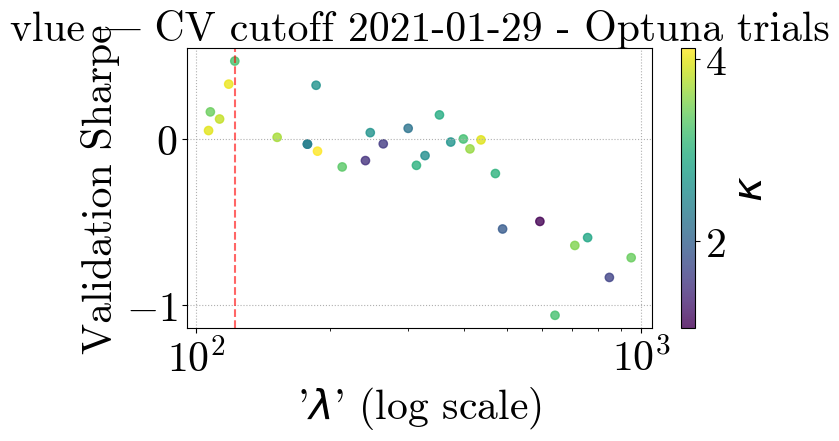

[I 2025-05-06 00:52:49,704] A new study created in memory with name: no-name-d837342e-1cf6-4461-a58b-ad6064ee508c
[I 2025-05-06 00:52:51,339] Trial 0 finished with value: 0.7608012449780496 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.7608012449780496.
[I 2025-05-06 00:52:52,810] Trial 1 finished with value: 0.6529233038082264 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.7608012449780496.
[I 2025-05-06 00:52:55,510] Trial 2 finished with value: 0.6661488587674141 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.7608012449780496.
[I 2025-05-06 00:52:58,404] Trial 3 finished with value: 0.6549418683107268 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.7608012449780496.
[I 2025-05-06 00:52:59,978] Trial 4 finished with value: 0.6601674827728806 and paramet

Optuna best λ=447.0789, κ=2.0383925160319736, Sharpe=0.8348


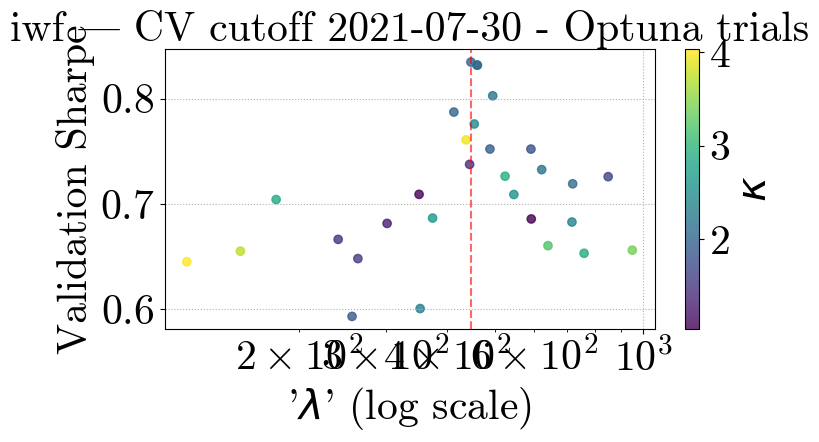

[I 2025-05-06 00:53:43,435] A new study created in memory with name: no-name-be240a88-dcbc-4863-9fc9-d68f53389a00
[I 2025-05-06 00:53:45,749] Trial 0 finished with value: 0.1624140855910321 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.1624140855910321.
[I 2025-05-06 00:53:47,214] Trial 1 finished with value: 0.3013533971093744 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.3013533971093744.
[I 2025-05-06 00:53:49,856] Trial 2 finished with value: 0.4247388162739625 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.4247388162739625.
[I 2025-05-06 00:53:53,550] Trial 3 finished with value: -0.36943137490088457 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.4247388162739625.
[I 2025-05-06 00:53:55,039] Trial 4 finished with value: 0.3013533971093744 and param

Optuna best λ=721.5833, κ=1.326184431810769, Sharpe=0.7938


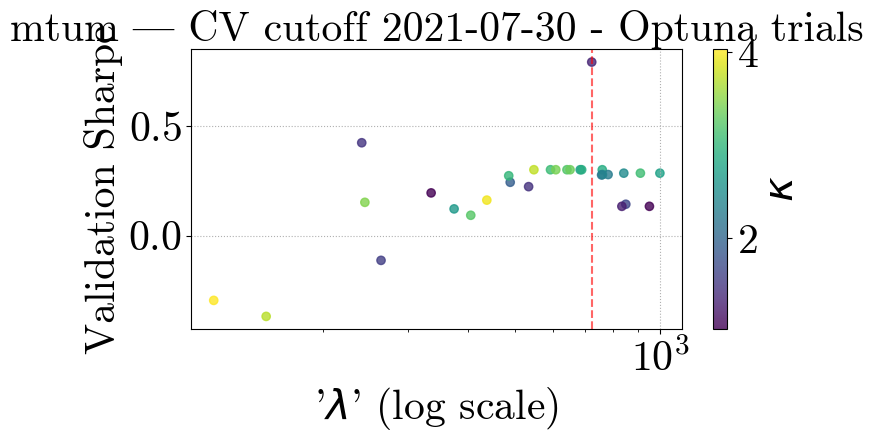

[I 2025-05-06 00:54:39,560] A new study created in memory with name: no-name-ecd9518f-ad2f-4fff-af0a-18545533414a
[I 2025-05-06 00:54:41,767] Trial 0 finished with value: -0.0035634873001502525 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.0035634873001502525.
[I 2025-05-06 00:54:43,790] Trial 1 finished with value: 0.5196137522433947 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.5196137522433947.
[I 2025-05-06 00:54:46,019] Trial 2 finished with value: -0.26945252760088945 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.5196137522433947.
[I 2025-05-06 00:54:47,963] Trial 3 finished with value: -0.02476810453641397 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.5196137522433947.
[I 2025-05-06 00:54:50,227] Trial 4 finished with value: 0.609301470081764 

Optuna best λ=746.5423, κ=1.0592245812759584, Sharpe=0.8858


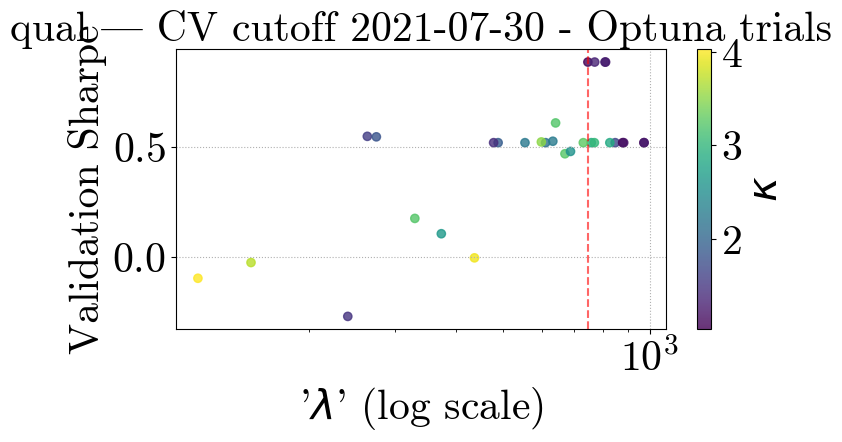

[I 2025-05-06 00:55:41,844] A new study created in memory with name: no-name-661a5893-b9e7-4b2d-a251-0af9f2af7ee3
[I 2025-05-06 00:55:43,578] Trial 0 finished with value: 0.5818636334026374 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.5818636334026374.
[I 2025-05-06 00:55:44,972] Trial 1 finished with value: 0.5183278999954938 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.5818636334026374.
[I 2025-05-06 00:55:46,572] Trial 2 finished with value: 0.2788592762061338 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.5818636334026374.
[I 2025-05-06 00:55:48,949] Trial 3 finished with value: -0.04154704752832778 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.5818636334026374.
[I 2025-05-06 00:55:50,562] Trial 4 finished with value: 0.5743480747877625 and param

Optuna best λ=488.7505, κ=1.9095393660962992, Sharpe=0.6118


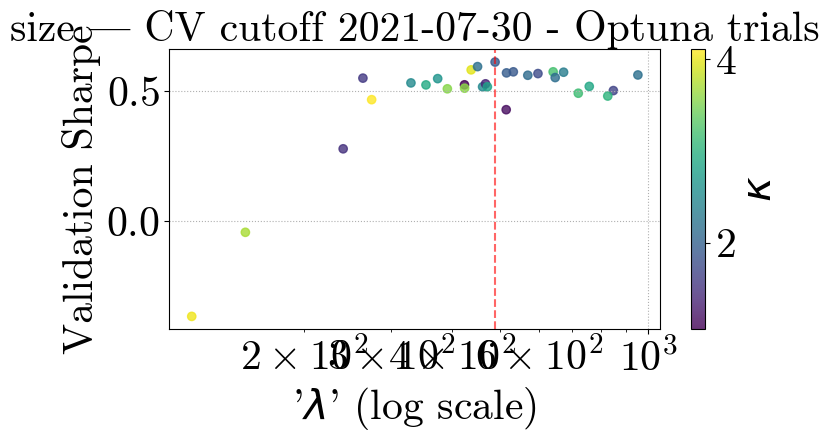

[I 2025-05-06 00:56:37,564] A new study created in memory with name: no-name-721b19f1-5fc2-4e8f-be88-30eca86f9e02
[I 2025-05-06 00:56:39,039] Trial 0 finished with value: -1.37237487432244 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.37237487432244.
[I 2025-05-06 00:56:40,473] Trial 1 finished with value: -0.055313033774027784 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.055313033774027784.
[I 2025-05-06 00:56:42,213] Trial 2 finished with value: -1.1204787118845387 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.055313033774027784.
[I 2025-05-06 00:56:44,879] Trial 3 finished with value: -0.5497827320025509 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 1 with value: -0.055313033774027784.
[I 2025-05-06 00:56:46,363] Trial 4 finished with value: -0.431746151177262

Optuna best λ=849.1984, κ=1.6631574710979753, Sharpe=0.3341


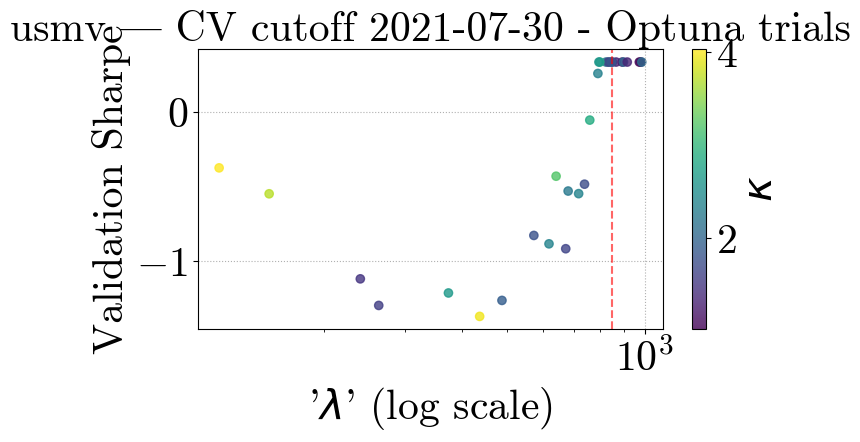

[I 2025-05-06 00:57:25,030] A new study created in memory with name: no-name-29998c59-895e-47f5-9e53-f083199b277e
[I 2025-05-06 00:57:27,294] Trial 0 finished with value: 0.009595428728961266 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.009595428728961266.
[I 2025-05-06 00:57:28,675] Trial 1 finished with value: -0.6947073380463322 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.009595428728961266.
[I 2025-05-06 00:57:31,115] Trial 2 finished with value: 0.010643896121268015 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.010643896121268015.
[I 2025-05-06 00:57:34,057] Trial 3 finished with value: 0.19450398344668557 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.19450398344668557.
[I 2025-05-06 00:57:35,512] Trial 4 finished with value: -0.56485559807367

Optuna best λ=458.1249, κ=2.5044774206403533, Sharpe=0.3000


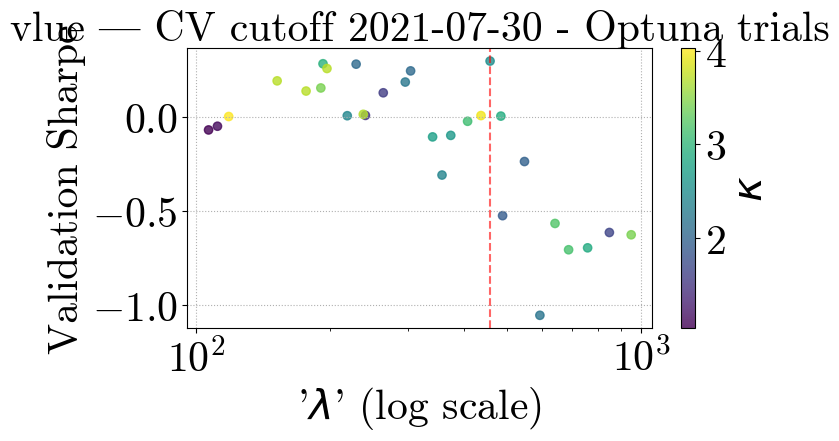

[I 2025-05-06 00:58:26,170] A new study created in memory with name: no-name-c9291444-3f66-4017-a58e-94b4a50df11a
[I 2025-05-06 00:58:27,678] Trial 0 finished with value: 0.5918406988869651 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.5918406988869651.
[I 2025-05-06 00:58:29,472] Trial 1 finished with value: 0.5872581578470673 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.5918406988869651.
[I 2025-05-06 00:58:33,315] Trial 2 finished with value: 0.4714022827249833 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.5918406988869651.
[I 2025-05-06 00:58:35,503] Trial 3 finished with value: 0.4538700726881374 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.5918406988869651.
[I 2025-05-06 00:58:37,447] Trial 4 finished with value: 0.5872581578470673 and paramet

Optuna best λ=472.3028, κ=2.957791451629283, Sharpe=0.6641


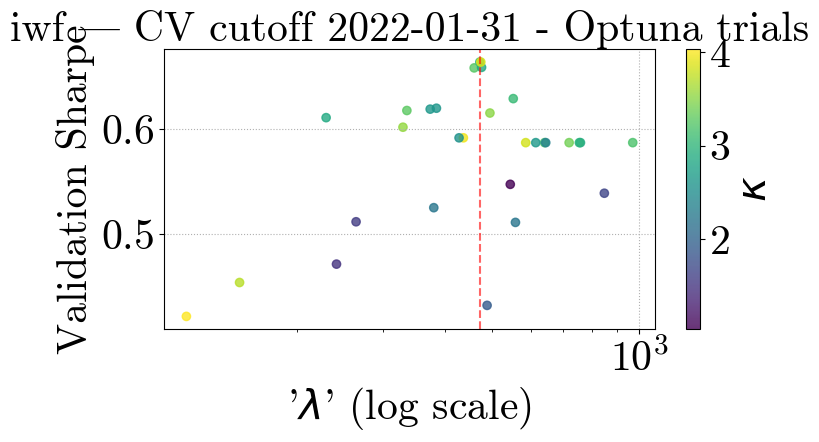

[I 2025-05-06 00:59:25,791] A new study created in memory with name: no-name-95d94265-e4fd-44ab-85b1-9b7379b8248c
[I 2025-05-06 00:59:27,440] Trial 0 finished with value: -0.20101843029018418 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.20101843029018418.
[I 2025-05-06 00:59:28,896] Trial 1 finished with value: 0.1023862090625773 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.1023862090625773.
[I 2025-05-06 00:59:31,034] Trial 2 finished with value: -0.037176389460929195 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.1023862090625773.
[I 2025-05-06 00:59:34,926] Trial 3 finished with value: -0.18912468636478738 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.1023862090625773.
[I 2025-05-06 00:59:36,453] Trial 4 finished with value: 0.1023862090625773 an

Optuna best λ=841.7527, κ=1.216328179573037, Sharpe=0.9656


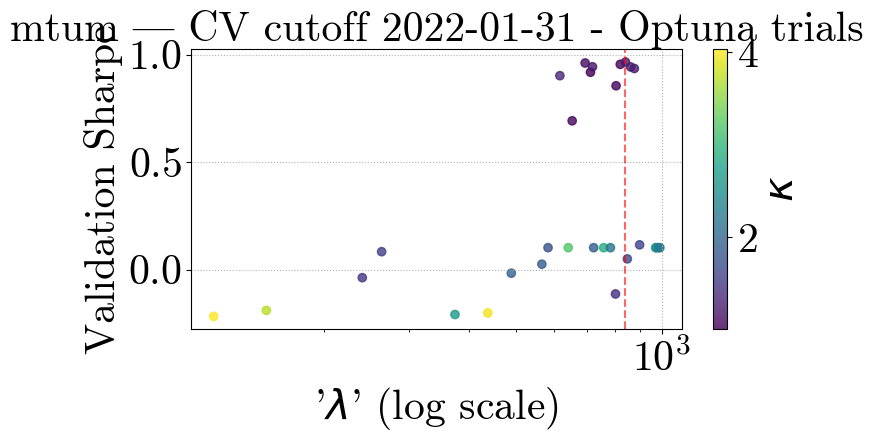

[I 2025-05-06 01:00:17,720] A new study created in memory with name: no-name-128f2ea8-ecd1-48b7-a6ee-0b8681a48a72
[I 2025-05-06 01:00:19,877] Trial 0 finished with value: -0.22434011337444376 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.22434011337444376.
[I 2025-05-06 01:00:21,256] Trial 1 finished with value: 0.2098824794909263 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.2098824794909263.
[I 2025-05-06 01:00:25,685] Trial 2 finished with value: 0.00031388762170226443 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.2098824794909263.
[I 2025-05-06 01:00:28,165] Trial 3 finished with value: -0.08337734958168175 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.2098824794909263.
[I 2025-05-06 01:00:30,058] Trial 4 finished with value: 0.2098824794909263 a

Optuna best λ=488.7505, κ=1.9095393660962992, Sharpe=0.2099


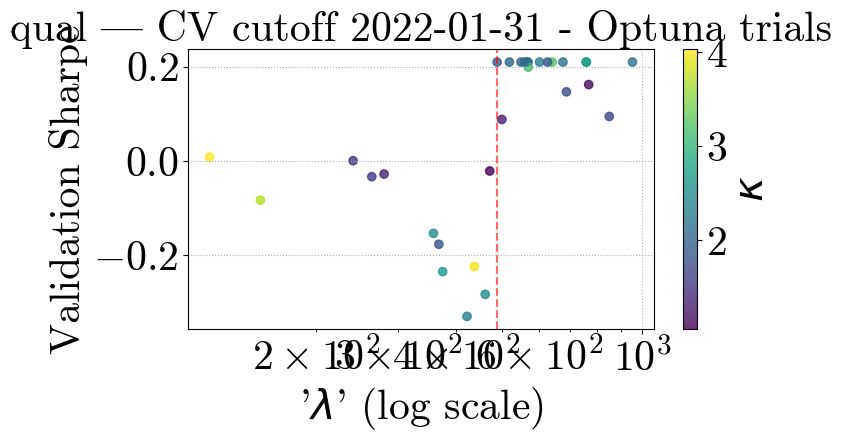

[I 2025-05-06 01:01:31,091] A new study created in memory with name: no-name-0aa96602-48fa-4dca-b98c-4dd96484085c
[I 2025-05-06 01:01:32,804] Trial 0 finished with value: 0.6399120195474278 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.6399120195474278.
[I 2025-05-06 01:01:34,289] Trial 1 finished with value: 0.6290481333421506 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.6399120195474278.
[I 2025-05-06 01:01:36,711] Trial 2 finished with value: 0.05899122935525654 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.6399120195474278.
[I 2025-05-06 01:01:39,039] Trial 3 finished with value: -0.12239196702809514 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.6399120195474278.
[I 2025-05-06 01:01:41,038] Trial 4 finished with value: 0.6052630039633944 and para

Optuna best λ=952.2657, κ=2.1745901556389544, Sharpe=0.6973


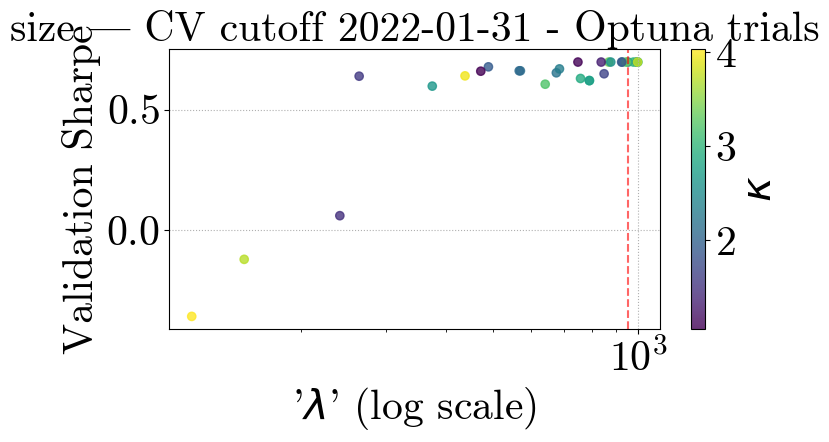

[I 2025-05-06 01:02:10,195] A new study created in memory with name: no-name-03703321-483a-4056-9c30-1d81cf15a4d3
[I 2025-05-06 01:02:11,699] Trial 0 finished with value: -1.2135769573378068 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.2135769573378068.
[I 2025-05-06 01:02:13,086] Trial 1 finished with value: -0.6408885657154101 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.6408885657154101.
[I 2025-05-06 01:02:14,769] Trial 2 finished with value: -1.232713671862488 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.6408885657154101.
[I 2025-05-06 01:02:18,269] Trial 3 finished with value: -0.779822693946126 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 1 with value: -0.6408885657154101.
[I 2025-05-06 01:02:19,799] Trial 4 finished with value: -1.1707834490442954 and 

Optuna best λ=118.5260, κ=4.029130915629118, Sharpe=-0.6206


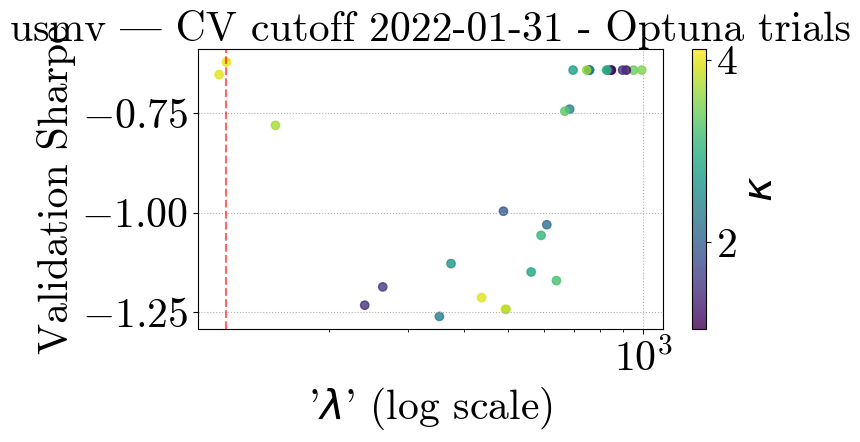

[I 2025-05-06 01:03:07,910] A new study created in memory with name: no-name-b8465218-d8f1-4bab-a167-14813b42242d
[I 2025-05-06 01:03:10,052] Trial 0 finished with value: 0.04079968611006255 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.04079968611006255.
[I 2025-05-06 01:03:11,796] Trial 1 finished with value: -0.38937122167975385 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.04079968611006255.
[I 2025-05-06 01:03:14,032] Trial 2 finished with value: 0.0016545243663429329 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.04079968611006255.
[I 2025-05-06 01:03:16,442] Trial 3 finished with value: 0.28990836646721313 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.28990836646721313.
[I 2025-05-06 01:03:18,436] Trial 4 finished with value: 0.06579663394275713

Optuna best λ=380.2108, κ=2.220943325373505, Sharpe=0.4239


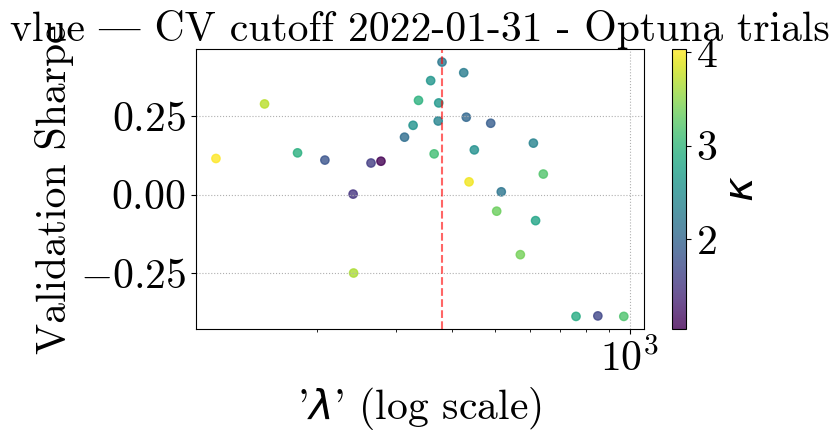

[I 2025-05-06 01:04:10,007] A new study created in memory with name: no-name-99651b7f-e342-451f-96cf-689eaf8299f7
[I 2025-05-06 01:04:11,558] Trial 0 finished with value: 0.1475398894157626 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.1475398894157626.
[I 2025-05-06 01:04:12,510] Trial 1 finished with value: 0.09388016568172551 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.1475398894157626.
[I 2025-05-06 01:04:14,168] Trial 2 finished with value: 0.016981277607190284 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.1475398894157626.
[I 2025-05-06 01:04:16,427] Trial 3 finished with value: 0.20448142933938254 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.20448142933938254.
[I 2025-05-06 01:04:17,377] Trial 4 finished with value: -0.14259974795794544 and 

Optuna best λ=972.5834, κ=3.4692137334807374, Sharpe=0.3111


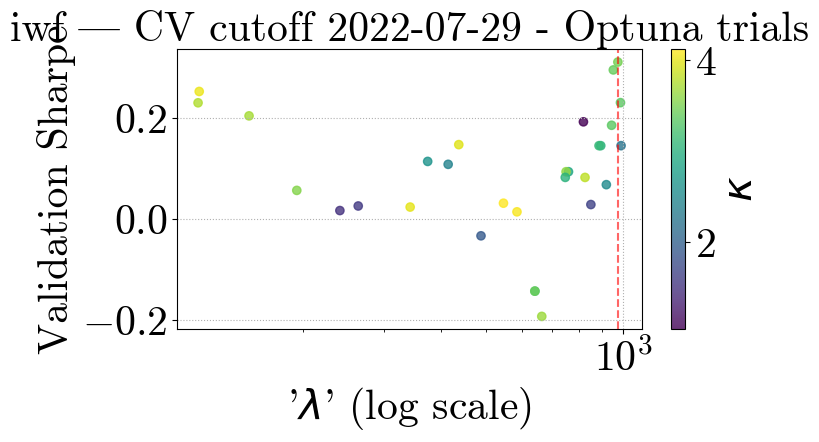

[I 2025-05-06 01:04:47,606] A new study created in memory with name: no-name-578fbfcc-5db3-4f61-846c-29b84f8a8b8b
[I 2025-05-06 01:04:49,250] Trial 0 finished with value: -0.09617433804174529 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.09617433804174529.
[I 2025-05-06 01:04:50,736] Trial 1 finished with value: -0.08701966523638628 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.08701966523638628.
[I 2025-05-06 01:04:52,399] Trial 2 finished with value: 0.04441261049141251 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.04441261049141251.
[I 2025-05-06 01:04:57,301] Trial 3 finished with value: -0.13167830037116326 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.04441261049141251.
[I 2025-05-06 01:04:58,754] Trial 4 finished with value: -0.15414203712234

Optuna best λ=341.0858, κ=1.1209428898519396, Sharpe=0.2110


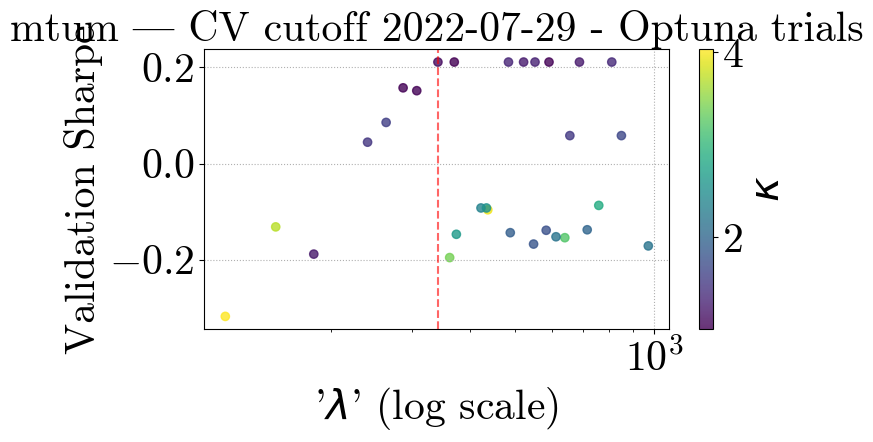

[I 2025-05-06 01:05:37,058] A new study created in memory with name: no-name-ed70be64-f581-49f5-822d-1759b916c13f
[I 2025-05-06 01:05:39,313] Trial 0 finished with value: -0.2647817336666736 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.2647817336666736.
[I 2025-05-06 01:05:41,023] Trial 1 finished with value: -0.16339114495487808 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.16339114495487808.
[I 2025-05-06 01:05:43,211] Trial 2 finished with value: -0.05060608326510357 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.05060608326510357.
[I 2025-05-06 01:05:45,191] Trial 3 finished with value: -0.2711935121009891 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 2 with value: -0.05060608326510357.
[I 2025-05-06 01:05:47,006] Trial 4 finished with value: -0.08014759942269

Optuna best λ=984.4159, κ=2.115182446147358, Sharpe=0.0878


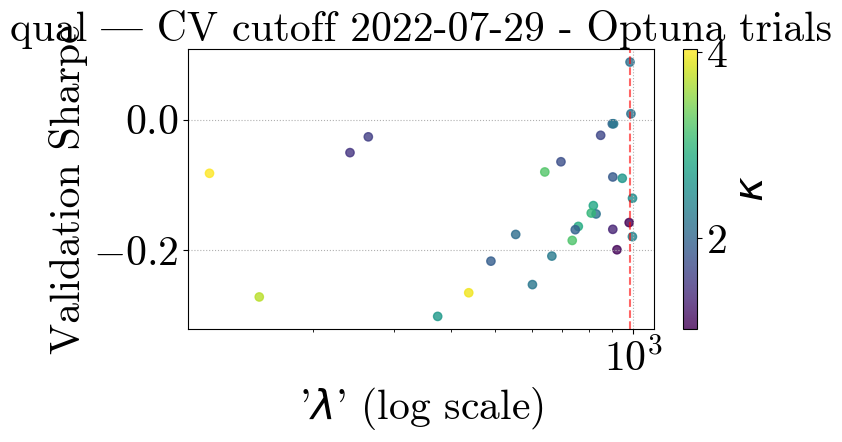

[I 2025-05-06 01:06:34,099] A new study created in memory with name: no-name-51700ab9-387d-455f-a259-138e57594834
[I 2025-05-06 01:06:36,001] Trial 0 finished with value: 0.5827133642515706 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.5827133642515706.
[I 2025-05-06 01:06:37,808] Trial 1 finished with value: 0.5997504067409098 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.5997504067409098.
[I 2025-05-06 01:06:39,980] Trial 2 finished with value: 0.5860623887148005 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.5997504067409098.
[I 2025-05-06 01:06:43,650] Trial 3 finished with value: 0.24783315916520748 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.5997504067409098.
[I 2025-05-06 01:06:45,474] Trial 4 finished with value: 0.5962206189991237 and parame

Optuna best λ=529.8128, κ=1.0823503127445389, Sharpe=0.6092


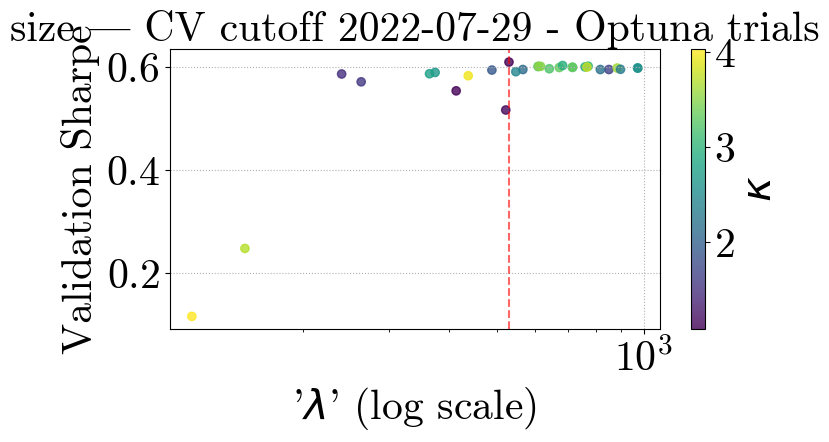

[I 2025-05-06 01:07:31,912] A new study created in memory with name: no-name-649ff9ab-3814-496e-a36d-f8f6f9c10097
[I 2025-05-06 01:07:33,397] Trial 0 finished with value: -1.0312304061164348 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.0312304061164348.
[I 2025-05-06 01:07:34,799] Trial 1 finished with value: -0.6110736487259874 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.6110736487259874.
[I 2025-05-06 01:07:36,863] Trial 2 finished with value: -0.40180539496399464 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.40180539496399464.
[I 2025-05-06 01:07:40,205] Trial 3 finished with value: -0.17802280564404568 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: -0.17802280564404568.
[I 2025-05-06 01:07:41,527] Trial 4 finished with value: -0.773714766410618

Optuna best λ=164.8054, κ=3.352399342336529, Sharpe=-0.0553


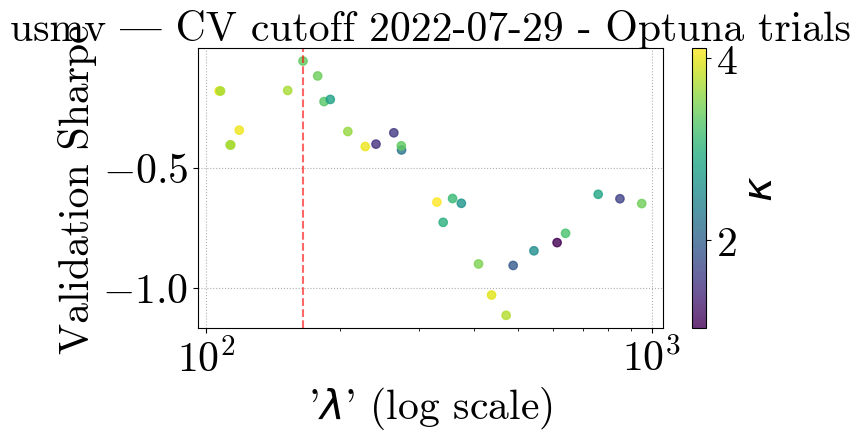

[I 2025-05-06 01:08:36,550] A new study created in memory with name: no-name-cc057b1a-e39b-4b72-a037-7bdf69ec618e
[I 2025-05-06 01:08:38,586] Trial 0 finished with value: -0.006748498473252616 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.006748498473252616.
[I 2025-05-06 01:08:40,368] Trial 1 finished with value: 0.056496539156395645 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.056496539156395645.
[I 2025-05-06 01:08:42,804] Trial 2 finished with value: 0.008219647413725236 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.056496539156395645.
[I 2025-05-06 01:08:45,697] Trial 3 finished with value: 0.34970574850760155 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.34970574850760155.
[I 2025-05-06 01:08:47,526] Trial 4 finished with value: 0.071930341512

Optuna best λ=113.0745, κ=3.561963338490747, Sharpe=0.4251


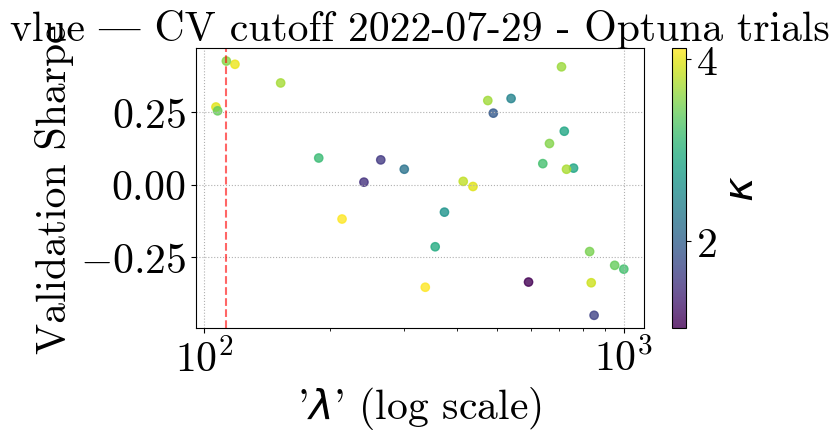

[I 2025-05-06 01:09:41,649] A new study created in memory with name: no-name-8e903178-df73-4721-a3dd-654e0acd0d37
[I 2025-05-06 01:09:43,114] Trial 0 finished with value: -0.06077591724157967 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.06077591724157967.
[I 2025-05-06 01:09:44,019] Trial 1 finished with value: -0.2747436495362125 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.06077591724157967.
[I 2025-05-06 01:09:46,760] Trial 2 finished with value: 0.029871787725297666 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.029871787725297666.
[I 2025-05-06 01:09:49,252] Trial 3 finished with value: 0.05590302281636168 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.05590302281636168.
[I 2025-05-06 01:09:50,157] Trial 4 finished with value: -0.19498844066822

Optuna best λ=189.5160, κ=3.5136320816087423, Sharpe=0.0807


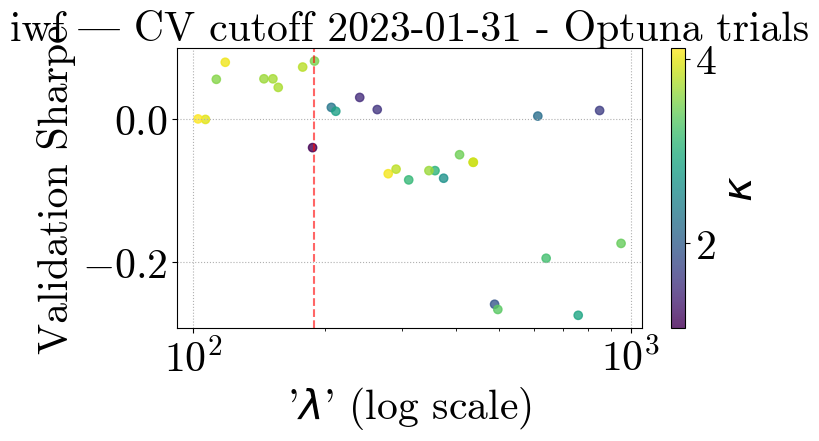

[I 2025-05-06 01:10:39,658] A new study created in memory with name: no-name-26dcc1cc-968e-4984-a541-b7dbfb6dd34b
[I 2025-05-06 01:10:42,398] Trial 0 finished with value: -0.0576096620094334 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.0576096620094334.
[I 2025-05-06 01:10:44,992] Trial 1 finished with value: -0.15685827246496367 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.0576096620094334.
[I 2025-05-06 01:10:46,880] Trial 2 finished with value: -0.5682553576518962 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.0576096620094334.
[I 2025-05-06 01:10:51,466] Trial 3 finished with value: -0.5613072554169554 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.0576096620094334.
[I 2025-05-06 01:10:53,946] Trial 4 finished with value: -0.13548089411448386 

Optuna best λ=980.1965, κ=1.0187298358271706, Sharpe=0.6956


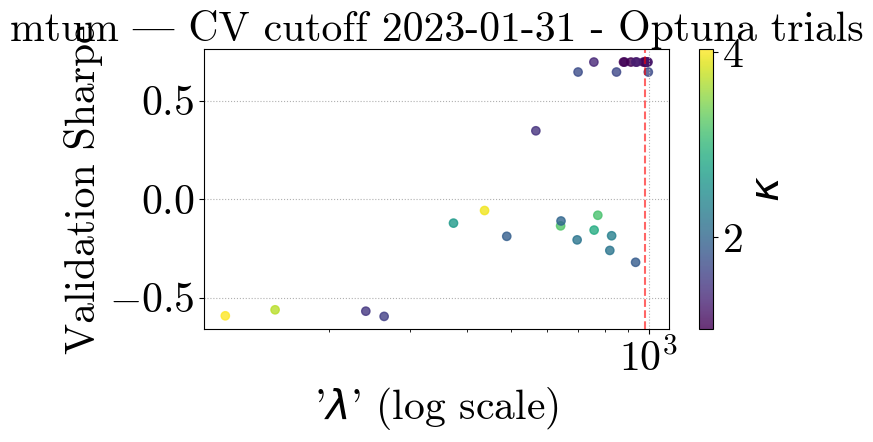

[I 2025-05-06 01:11:34,752] A new study created in memory with name: no-name-925e632c-0fb8-4144-bac7-7690614d0ff4
[I 2025-05-06 01:11:37,740] Trial 0 finished with value: -0.07405880029109196 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.07405880029109196.
[I 2025-05-06 01:11:40,530] Trial 1 finished with value: -0.07405880029109196 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.07405880029109196.
[I 2025-05-06 01:11:43,276] Trial 2 finished with value: 0.08590104005100996 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.08590104005100996.
[I 2025-05-06 01:11:45,225] Trial 3 finished with value: 0.1315312052744896 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.1315312052744896.
[I 2025-05-06 01:11:48,112] Trial 4 finished with value: -0.07405880029109196

Optuna best λ=113.0654, κ=3.834733028321934, Sharpe=0.3213


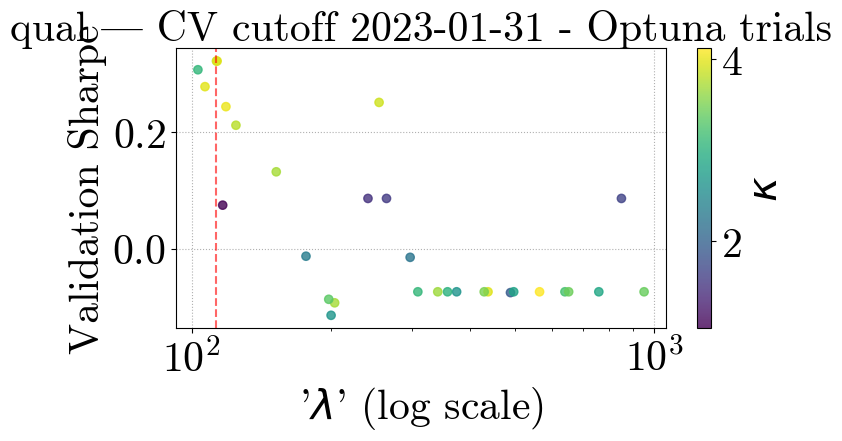

[I 2025-05-06 01:12:57,384] A new study created in memory with name: no-name-1cabdb7c-428d-4c2a-8b88-ae9c50965cae
[I 2025-05-06 01:12:59,349] Trial 0 finished with value: 0.3905292777466093 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.3905292777466093.
[I 2025-05-06 01:13:01,231] Trial 1 finished with value: 0.3897037241429677 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.3905292777466093.
[I 2025-05-06 01:13:03,619] Trial 2 finished with value: 0.3872022596957421 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.3905292777466093.
[I 2025-05-06 01:13:06,446] Trial 3 finished with value: 0.23898761289014325 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.3905292777466093.
[I 2025-05-06 01:13:08,247] Trial 4 finished with value: 0.39313840110184584 and param

Optuna best λ=886.6741, κ=1.7415321205555083, Sharpe=0.4069


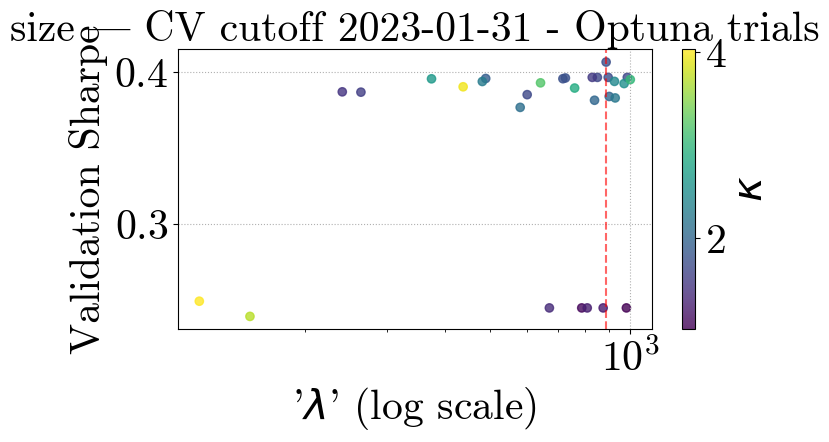

[I 2025-05-06 01:13:51,903] A new study created in memory with name: no-name-4ed835a3-1fbf-4059-bd1c-035192a70afe
[I 2025-05-06 01:13:53,304] Trial 0 finished with value: -0.343457911262993 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.343457911262993.
[I 2025-05-06 01:13:54,676] Trial 1 finished with value: -0.7133101287739928 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.343457911262993.
[I 2025-05-06 01:13:56,233] Trial 2 finished with value: -0.19468808412102556 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.19468808412102556.
[I 2025-05-06 01:13:58,560] Trial 3 finished with value: -0.08403308652872596 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: -0.08403308652872596.
[I 2025-05-06 01:13:59,870] Trial 4 finished with value: -0.5238153120836535 a

Optuna best λ=175.6795, κ=2.7172754756310513, Sharpe=0.1972


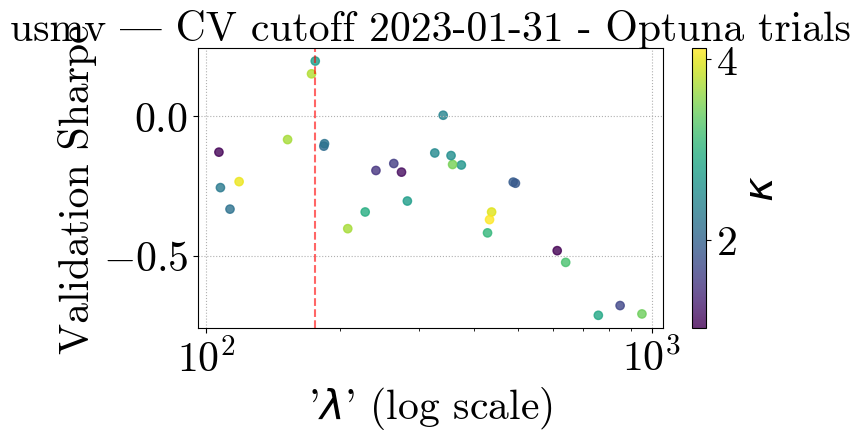

[I 2025-05-06 01:14:47,984] A new study created in memory with name: no-name-beb51795-30a2-4177-bc7c-2f65724d5ba7
[I 2025-05-06 01:14:50,249] Trial 0 finished with value: 0.011593425562362853 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.011593425562362853.
[I 2025-05-06 01:14:52,141] Trial 1 finished with value: -0.012429679833102687 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.011593425562362853.
[I 2025-05-06 01:14:53,886] Trial 2 finished with value: 0.23258825814223796 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.23258825814223796.
[I 2025-05-06 01:14:58,281] Trial 3 finished with value: 0.6828164571193279 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.6828164571193279.
[I 2025-05-06 01:15:00,192] Trial 4 finished with value: 0.00064850810976589

Optuna best λ=373.8180, κ=2.638869763709691, Sharpe=0.8231


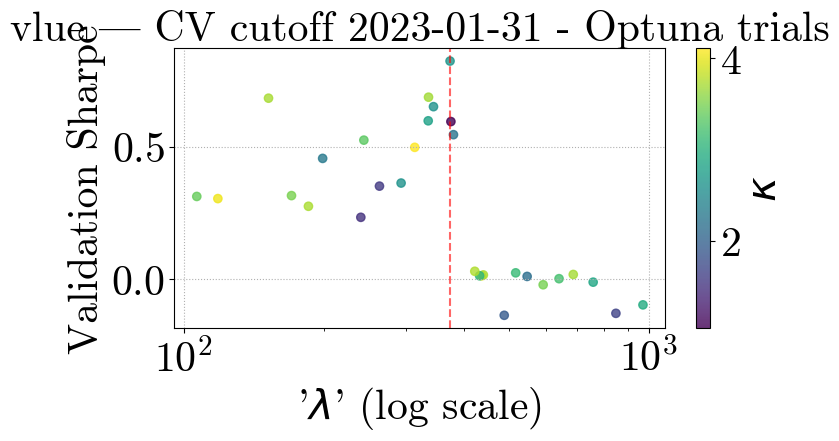

[I 2025-05-06 01:16:06,484] A new study created in memory with name: no-name-a35d6b5d-2970-4637-9de8-5aa36aa318f0
[I 2025-05-06 01:16:08,566] Trial 0 finished with value: -0.05935374507873351 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.05935374507873351.
[I 2025-05-06 01:16:10,467] Trial 1 finished with value: -0.03878627860950789 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.03878627860950789.
[I 2025-05-06 01:16:12,050] Trial 2 finished with value: -0.24225485175316655 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.03878627860950789.
[I 2025-05-06 01:16:15,301] Trial 3 finished with value: -0.17823952856505879 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 1 with value: -0.03878627860950789.
[I 2025-05-06 01:16:17,183] Trial 4 finished with value: -0.04410808966

Optuna best λ=827.2594, κ=1.0066490180232988, Sharpe=0.0392


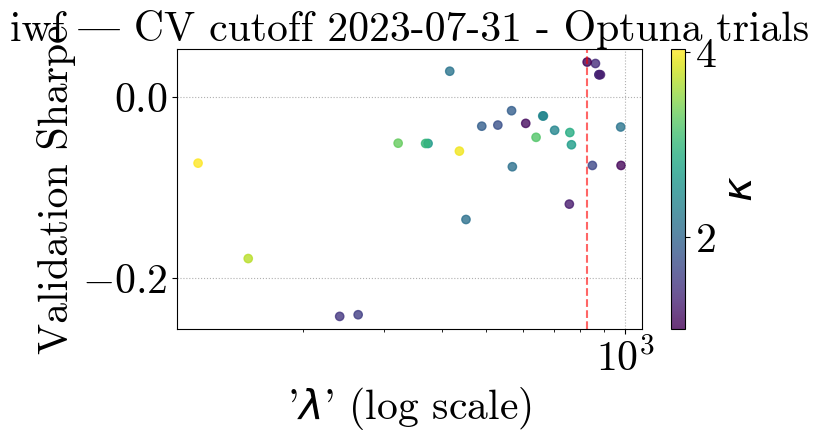

[I 2025-05-06 01:17:04,156] A new study created in memory with name: no-name-1242f4d0-dc35-4c08-981b-9c0d41aa997c
[I 2025-05-06 01:17:05,107] Trial 0 finished with value: -0.3996323208054902 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.3996323208054902.
[I 2025-05-06 01:17:05,953] Trial 1 finished with value: -0.08087524403769052 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.08087524403769052.
[I 2025-05-06 01:17:08,206] Trial 2 finished with value: -0.8230107153688976 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.08087524403769052.
[I 2025-05-06 01:17:11,463] Trial 3 finished with value: -1.106244765279871 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 1 with value: -0.08087524403769052.
[I 2025-05-06 01:17:12,341] Trial 4 finished with value: -0.0968716136134709

Optuna best λ=970.7828, κ=1.0271262078611545, Sharpe=0.6352


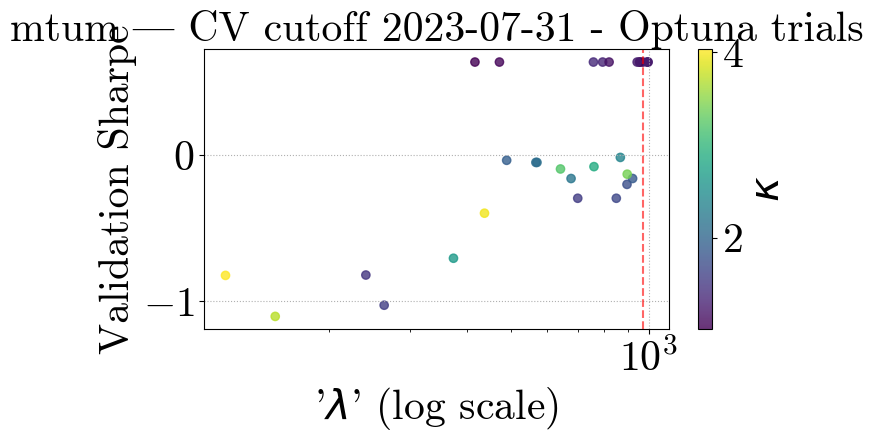

[I 2025-05-06 01:17:43,656] A new study created in memory with name: no-name-37e5037b-1430-4b48-bfea-09a0b0b92094
[I 2025-05-06 01:17:46,735] Trial 0 finished with value: 0.37685072262502334 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.37685072262502334.
[I 2025-05-06 01:17:49,776] Trial 1 finished with value: 0.37685072262502334 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.37685072262502334.
[I 2025-05-06 01:17:52,626] Trial 2 finished with value: 0.4209567819619346 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.4209567819619346.
[I 2025-05-06 01:17:56,508] Trial 3 finished with value: 0.21276856106514236 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.4209567819619346.
[I 2025-05-06 01:17:59,616] Trial 4 finished with value: 0.37685072262502334 and p

Optuna best λ=240.4168, κ=1.487187364027523, Sharpe=0.4210


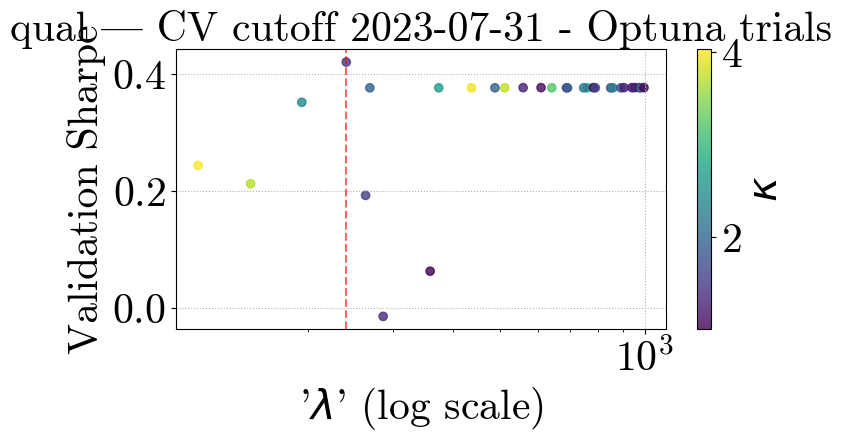

[I 2025-05-06 01:18:49,646] A new study created in memory with name: no-name-74184c16-65a5-458a-9d88-68300d80fd02
[I 2025-05-06 01:18:51,898] Trial 0 finished with value: 0.34881525235838784 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.34881525235838784.
[I 2025-05-06 01:18:53,357] Trial 1 finished with value: 0.37346648032651997 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.37346648032651997.
[I 2025-05-06 01:18:55,793] Trial 2 finished with value: 0.3503531014758515 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.37346648032651997.
[I 2025-05-06 01:18:59,936] Trial 3 finished with value: 0.17466561028127828 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.37346648032651997.
[I 2025-05-06 01:19:01,408] Trial 4 finished with value: 0.37346648032651997 and

Optuna best λ=758.7945, κ=2.869673679819506, Sharpe=0.3735


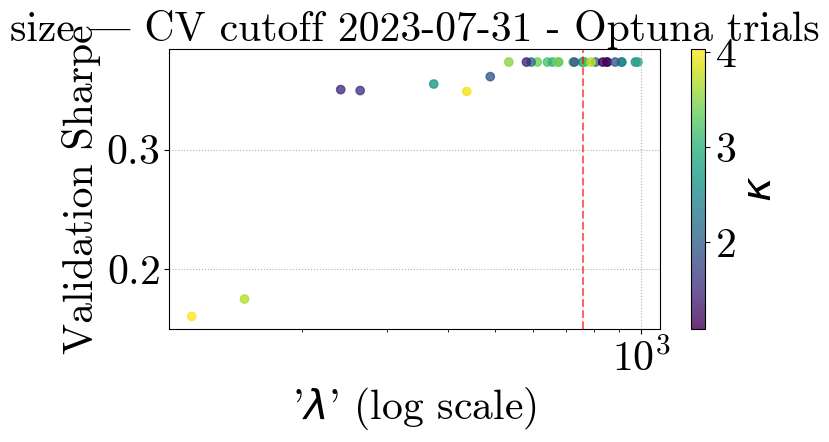

[I 2025-05-06 01:19:45,026] A new study created in memory with name: no-name-0bfec141-fbcd-4b9a-b6e5-03addd68dc20
[I 2025-05-06 01:19:47,140] Trial 0 finished with value: 0.20462913488594087 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.20462913488594087.
[I 2025-05-06 01:19:48,482] Trial 1 finished with value: -0.021352351578064158 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.20462913488594087.
[I 2025-05-06 01:19:50,654] Trial 2 finished with value: -0.9192759052293873 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.20462913488594087.
[I 2025-05-06 01:19:53,844] Trial 3 finished with value: 0.22394362423056816 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.22394362423056816.
[I 2025-05-06 01:19:55,221] Trial 4 finished with value: 0.20896132140775606 

Optuna best λ=107.7440, κ=2.928375538167292, Sharpe=0.5852


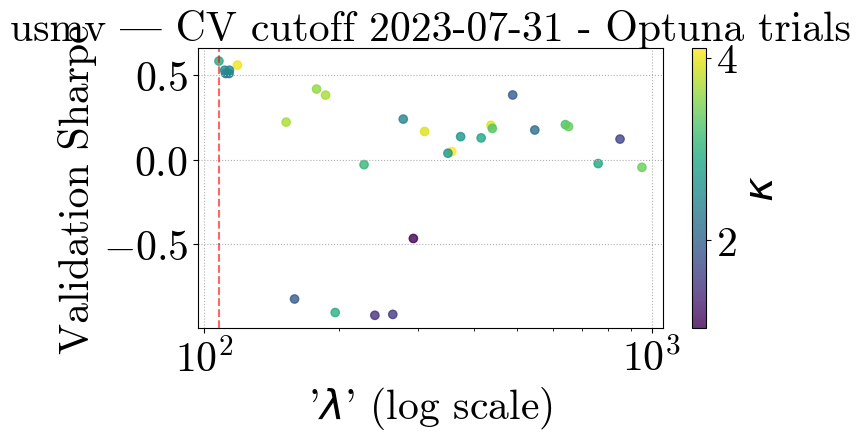

[I 2025-05-06 01:20:57,989] A new study created in memory with name: no-name-91ee09f8-0b12-4467-9955-e8d836979d57
[I 2025-05-06 01:21:00,005] Trial 0 finished with value: -0.09796909383241838 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.09796909383241838.
[I 2025-05-06 01:21:01,303] Trial 1 finished with value: -0.38317319589041776 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.09796909383241838.
[I 2025-05-06 01:21:04,106] Trial 2 finished with value: 0.24434427469683723 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.24434427469683723.
[I 2025-05-06 01:21:06,998] Trial 3 finished with value: -0.06271109507017751 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.24434427469683723.
[I 2025-05-06 01:21:08,251] Trial 4 finished with value: -0.82613285393400

Optuna best λ=106.7926, κ=2.112466833561486, Sharpe=0.5363


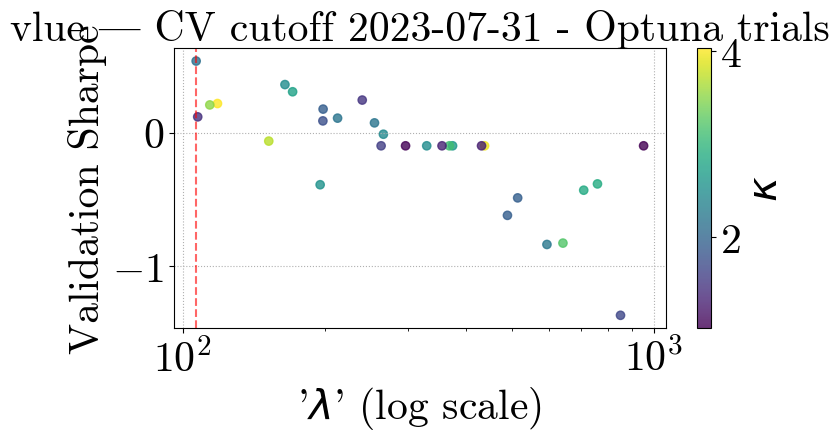

[I 2025-05-06 01:37:20,727] A new study created in memory with name: no-name-b431a792-a4a1-45e8-ba91-5e65b37f98b5
[I 2025-05-06 01:37:22,634] Trial 0 finished with value: -0.15695920002005137 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.15695920002005137.
[I 2025-05-06 01:37:24,358] Trial 1 finished with value: -0.20599094656071434 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.15695920002005137.
[I 2025-05-06 01:37:25,842] Trial 2 finished with value: -0.25041065526218786 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.15695920002005137.
[I 2025-05-06 01:37:28,021] Trial 3 finished with value: -0.22372673761887857 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.15695920002005137.
[I 2025-05-06 01:37:29,687] Trial 4 finished with value: -0.16064221429

Optuna best λ=416.5445, κ=1.0127930946941017, Sharpe=0.0516


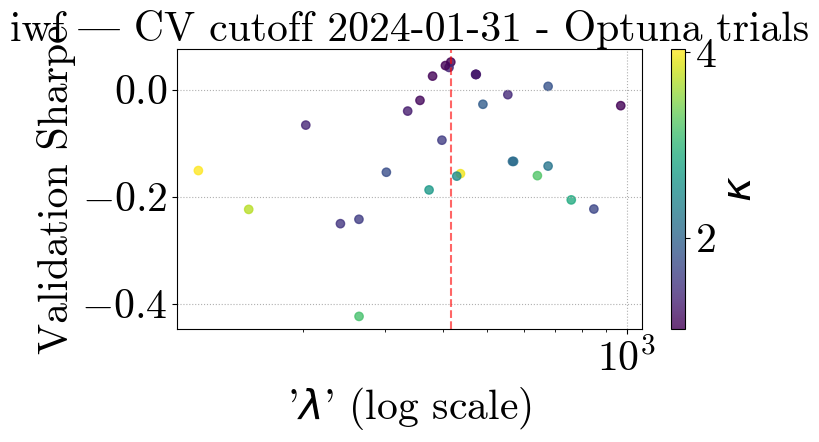

[I 2025-05-06 01:53:51,399] A new study created in memory with name: no-name-e9b6d4c7-b0ae-4f4e-989a-0a5fced9c200
[I 2025-05-06 01:53:52,833] Trial 0 finished with value: -0.46913096503221785 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.46913096503221785.
[I 2025-05-06 01:53:54,163] Trial 1 finished with value: -0.4629553389960346 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.4629553389960346.
[I 2025-05-06 01:53:55,794] Trial 2 finished with value: -0.49415028956134344 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.4629553389960346.
[I 2025-05-06 01:53:57,692] Trial 3 finished with value: -0.46678403944978325 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 1 with value: -0.4629553389960346.
[I 2025-05-06 01:53:59,080] Trial 4 finished with value: -0.462955338996034

Optuna best λ=849.1984, κ=1.6631574710979753, Sharpe=-0.2497


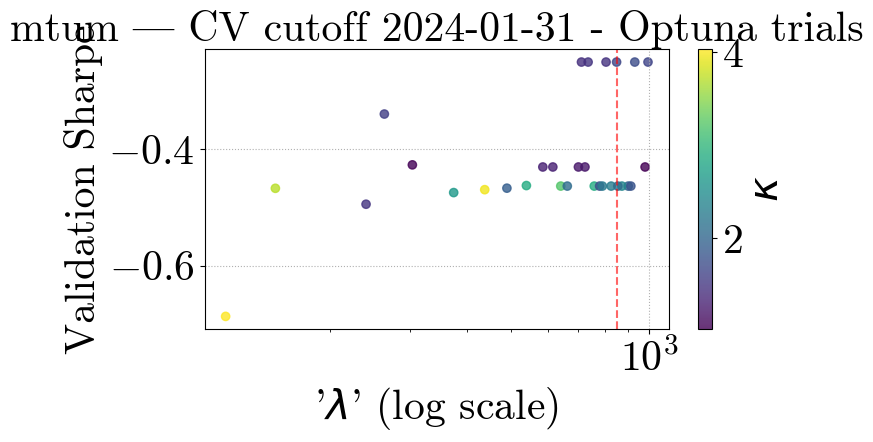

[I 2025-05-06 02:09:44,357] A new study created in memory with name: no-name-f837cb62-ba4e-4b7f-b4d3-499a3a722bb2
[I 2025-05-06 02:09:45,822] Trial 0 finished with value: 0.03009874847117666 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.03009874847117666.
[I 2025-05-06 02:09:46,927] Trial 1 finished with value: 0.03009874847117666 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.03009874847117666.
[I 2025-05-06 02:09:49,020] Trial 2 finished with value: 0.9442756798718649 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.9442756798718649.
[I 2025-05-06 02:09:51,798] Trial 3 finished with value: -0.19051266258160487 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.9442756798718649.
[I 2025-05-06 02:09:52,931] Trial 4 finished with value: 0.03009874847117666 and 

Optuna best λ=240.4168, κ=1.487187364027523, Sharpe=0.9443


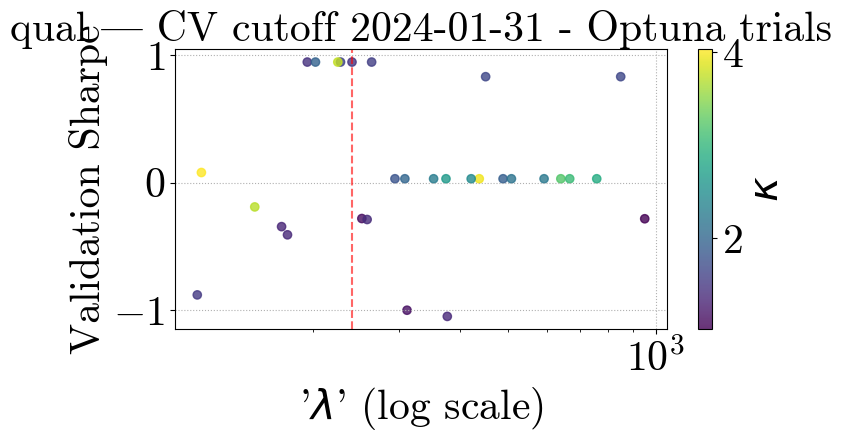

[I 2025-05-06 02:26:21,982] A new study created in memory with name: no-name-50555bb1-57e5-41f7-9a8c-4a30051932ff
[I 2025-05-06 02:26:23,397] Trial 0 finished with value: 0.427268902260415 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.427268902260415.
[I 2025-05-06 02:26:23,728] Trial 1 finished with value: 0.427268902260415 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.427268902260415.
[I 2025-05-06 02:26:26,312] Trial 2 finished with value: 0.15476101985626212 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.427268902260415.
[I 2025-05-06 02:26:29,377] Trial 3 finished with value: 0.24214416735176195 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.427268902260415.
[I 2025-05-06 02:26:29,736] Trial 4 finished with value: 0.427268902260415 and parameters: 

Optuna best λ=437.0861, κ=3.9691811987040015, Sharpe=0.4273


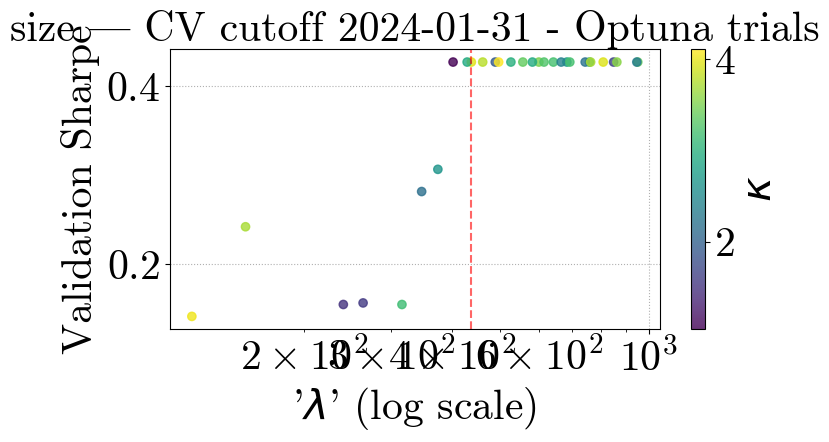

[I 2025-05-06 02:26:56,964] A new study created in memory with name: no-name-35ad576a-798b-44c9-8d7a-78f529357446
[I 2025-05-06 02:26:58,696] Trial 0 finished with value: -0.3331740905262573 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.3331740905262573.
[I 2025-05-06 02:26:59,038] Trial 1 finished with value: -0.025820646506187886 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.025820646506187886.
[I 2025-05-06 02:27:00,551] Trial 2 finished with value: -0.44718989865336506 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.025820646506187886.
[I 2025-05-06 02:27:03,627] Trial 3 finished with value: 0.7173623171512301 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.7173623171512301.
[I 2025-05-06 02:27:05,279] Trial 4 finished with value: -0.20790807353738

Optuna best λ=145.2804, κ=3.671017647863116, Sharpe=0.7424


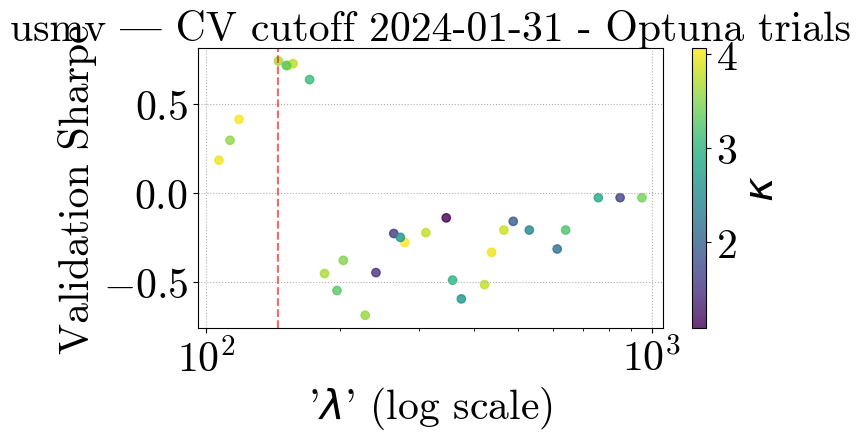

[I 2025-05-06 02:42:56,544] A new study created in memory with name: no-name-3997b8a7-ab5e-4f63-a1e8-9b46eab008d1
[I 2025-05-06 02:42:58,672] Trial 0 finished with value: 0.16868331829882807 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.16868331829882807.
[I 2025-05-06 02:43:00,032] Trial 1 finished with value: 0.37264578844772334 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.37264578844772334.
[I 2025-05-06 02:43:02,850] Trial 2 finished with value: 0.16868331829882807 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.37264578844772334.
[I 2025-05-06 02:43:06,366] Trial 3 finished with value: -0.288740675616017 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.37264578844772334.
[I 2025-05-06 02:43:07,706] Trial 4 finished with value: 0.37264578844772334 and

Optuna best λ=758.7945, κ=2.869673679819506, Sharpe=0.3726


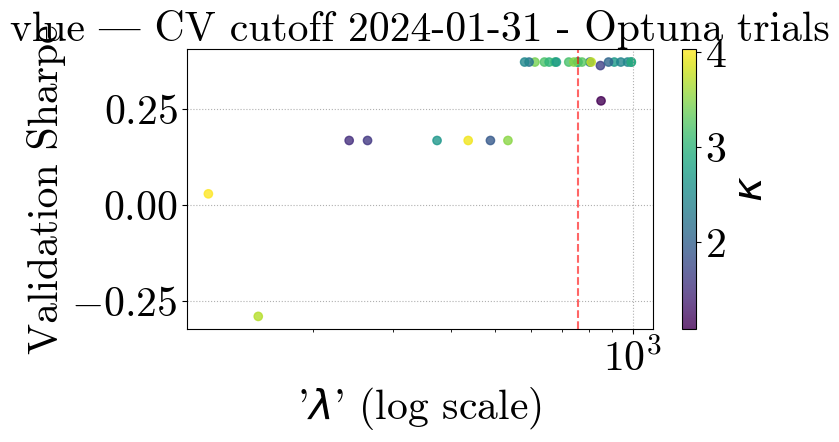

[I 2025-05-06 02:58:44,670] A new study created in memory with name: no-name-b7d28699-f7c7-4463-86d0-c720de3444e6
[I 2025-05-06 02:58:45,601] Trial 0 finished with value: 0.04343469673547703 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.04343469673547703.
[I 2025-05-06 02:58:46,411] Trial 1 finished with value: 0.09410854868646543 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.09410854868646543.
[I 2025-05-06 02:58:48,688] Trial 2 finished with value: 0.11239835485399291 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.11239835485399291.
[I 2025-05-06 02:58:50,771] Trial 3 finished with value: 0.13527127649094223 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.13527127649094223.
[I 2025-05-06 02:58:51,637] Trial 4 finished with value: 0.023583858035953028 a

Optuna best λ=592.8024, κ=1.023595910986902, Sharpe=0.2729


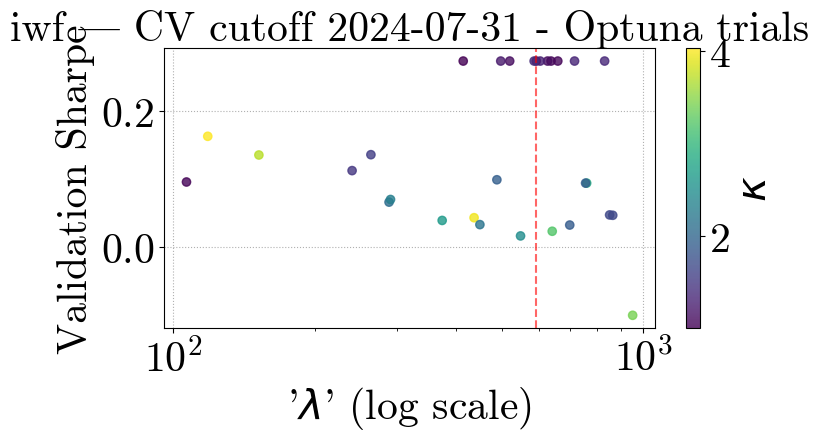

[I 2025-05-06 02:59:20,281] A new study created in memory with name: no-name-1bf199d8-84a1-4bfe-b273-d2062b3e1a6f
[I 2025-05-06 02:59:21,749] Trial 0 finished with value: 0.3077019851866844 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.3077019851866844.
[I 2025-05-06 02:59:23,247] Trial 1 finished with value: 0.49000941428512457 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.49000941428512457.
[I 2025-05-06 02:59:24,771] Trial 2 finished with value: 0.5762051738437141 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.5762051738437141.
[I 2025-05-06 02:59:26,726] Trial 3 finished with value: 0.27255945969428375 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.5762051738437141.
[I 2025-05-06 02:59:28,247] Trial 4 finished with value: 0.4060742166047003 and para

Optuna best λ=118.2452, κ=1.2961858020578279, Sharpe=0.8401


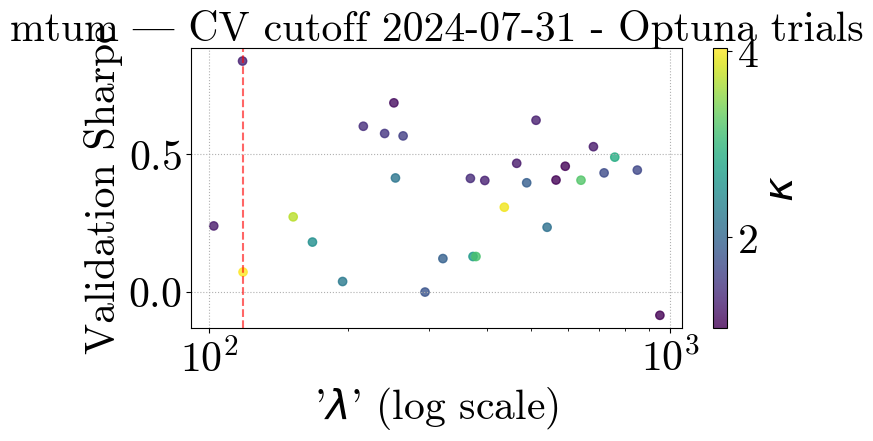

[I 2025-05-06 03:00:01,736] A new study created in memory with name: no-name-fbd8f25e-f823-4a72-8d47-2f4a52614c4b
[I 2025-05-06 03:00:02,916] Trial 0 finished with value: -0.23003198477028988 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.23003198477028988.
[I 2025-05-06 03:00:04,012] Trial 1 finished with value: 0.01830071211467115 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.01830071211467115.
[I 2025-05-06 03:00:05,485] Trial 2 finished with value: -0.018969450947702304 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.01830071211467115.
[I 2025-05-06 03:00:08,199] Trial 3 finished with value: 0.04196438052689941 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.04196438052689941.
[I 2025-05-06 03:00:09,313] Trial 4 finished with value: -0.269896864113283

Optuna best λ=897.6725, κ=2.9475721653538427, Sharpe=0.7157


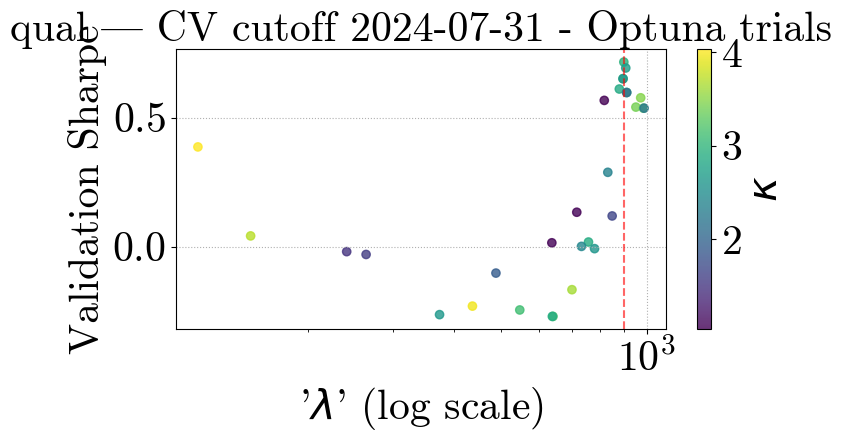

[I 2025-05-06 03:00:39,762] A new study created in memory with name: no-name-824c851e-1dc9-4949-8ad9-b95dc35c18ab
[I 2025-05-06 03:00:40,168] Trial 0 finished with value: 0.5012408687545277 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.5012408687545277.
[I 2025-05-06 03:00:40,525] Trial 1 finished with value: 0.5012408687545277 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.5012408687545277.
[I 2025-05-06 03:00:42,708] Trial 2 finished with value: 0.47928877303675643 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.5012408687545277.
[I 2025-05-06 03:00:46,708] Trial 3 finished with value: 0.4537296019263715 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.5012408687545277.
[I 2025-05-06 03:00:47,065] Trial 4 finished with value: 0.5012408687545277 and parame

Optuna best λ=346.5417, κ=2.1646107968357224, Sharpe=0.5154


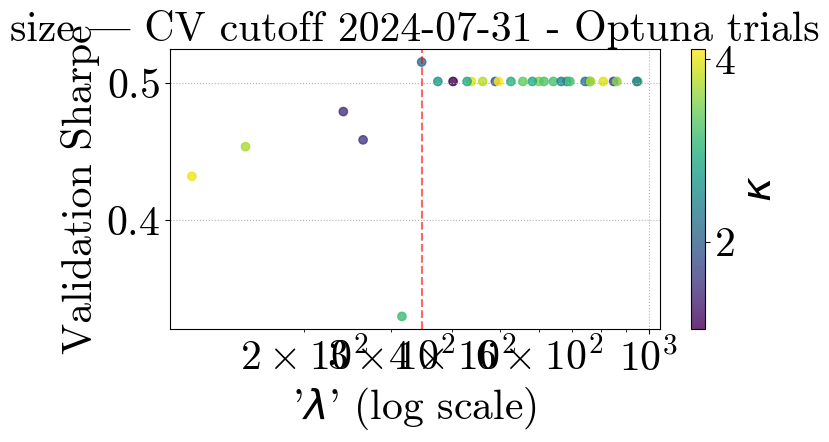

[I 2025-05-06 03:01:09,082] A new study created in memory with name: no-name-dad0a2a3-1eb2-473e-a44a-35b63e1396f8
[I 2025-05-06 03:01:10,750] Trial 0 finished with value: -0.31243282447751525 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.31243282447751525.
[I 2025-05-06 03:01:12,307] Trial 1 finished with value: -0.5261124589145109 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.31243282447751525.
[I 2025-05-06 03:01:13,356] Trial 2 finished with value: -0.08303965819048718 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.08303965819048718.
[I 2025-05-06 03:01:17,387] Trial 3 finished with value: 0.6924784855392595 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.6924784855392595.
[I 2025-05-06 03:01:18,914] Trial 4 finished with value: -0.7553117580015819

Optuna best λ=152.2753, κ=3.705159593645523, Sharpe=0.6925


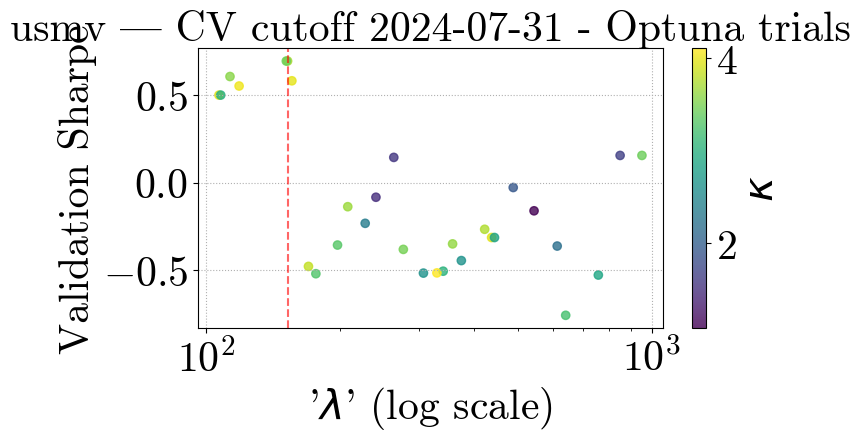

[I 2025-05-06 03:02:10,445] A new study created in memory with name: no-name-ff11a182-9540-4d7b-80c3-26804f1b594f
[I 2025-05-06 03:02:13,625] Trial 0 finished with value: 0.3718054907594993 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.3718054907594993.
[I 2025-05-06 03:02:15,001] Trial 1 finished with value: 0.3718054907594993 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.3718054907594993.
[I 2025-05-06 03:02:16,705] Trial 2 finished with value: -0.2947867414055617 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.3718054907594993.
[I 2025-05-06 03:02:19,639] Trial 3 finished with value: -0.5332711922403954 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.3718054907594993.
[I 2025-05-06 03:02:21,037] Trial 4 finished with value: 0.3718054907594993 and param

Optuna best λ=437.0861, κ=3.9691811987040015, Sharpe=0.3718


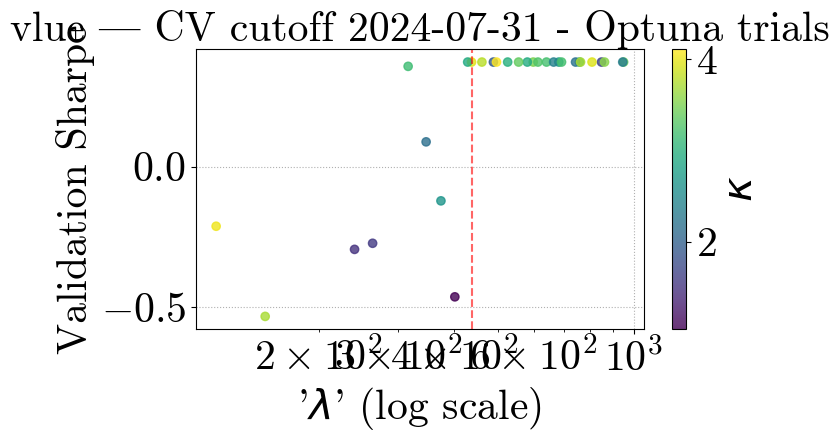

[I 2025-05-06 03:03:05,604] A new study created in memory with name: no-name-74e2c0d4-0a68-446c-bdbc-696a27d2edfb
[I 2025-05-06 03:03:06,651] Trial 0 finished with value: 0.6107139296342721 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.6107139296342721.
[I 2025-05-06 03:03:07,561] Trial 1 finished with value: 0.6124424556322926 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.6124424556322926.
[I 2025-05-06 03:03:09,996] Trial 2 finished with value: 0.232372165879652 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.6124424556322926.
[I 2025-05-06 03:03:11,213] Trial 3 finished with value: 0.6247450927917476 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.6247450927917476.
[I 2025-05-06 03:03:12,124] Trial 4 finished with value: 0.6123626208217989 and paramete

Optuna best λ=972.5834, κ=3.4263869792301316, Sharpe=0.6507


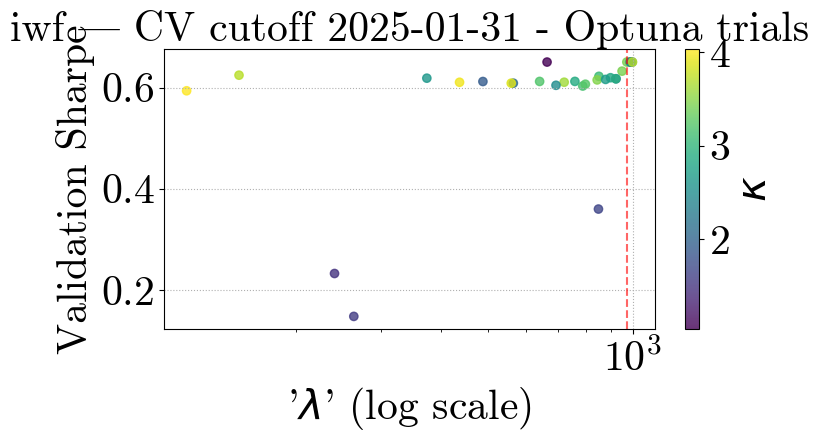

[I 2025-05-06 03:03:40,100] A new study created in memory with name: no-name-a6ad20f9-b8b6-493f-a71d-0b1415f16458
[I 2025-05-06 03:03:41,666] Trial 0 finished with value: -0.07432325114350817 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.07432325114350817.
[I 2025-05-06 03:03:42,947] Trial 1 finished with value: -0.052573406325524305 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.052573406325524305.
[I 2025-05-06 03:03:46,579] Trial 2 finished with value: 0.41071791927421825 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.41071791927421825.
[I 2025-05-06 03:03:48,526] Trial 3 finished with value: -7.224621035369724e-05 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.41071791927421825.
[I 2025-05-06 03:03:49,903] Trial 4 finished with value: -0.0443827057

Optuna best λ=263.6425, κ=1.5727916564869089, Sharpe=0.6375


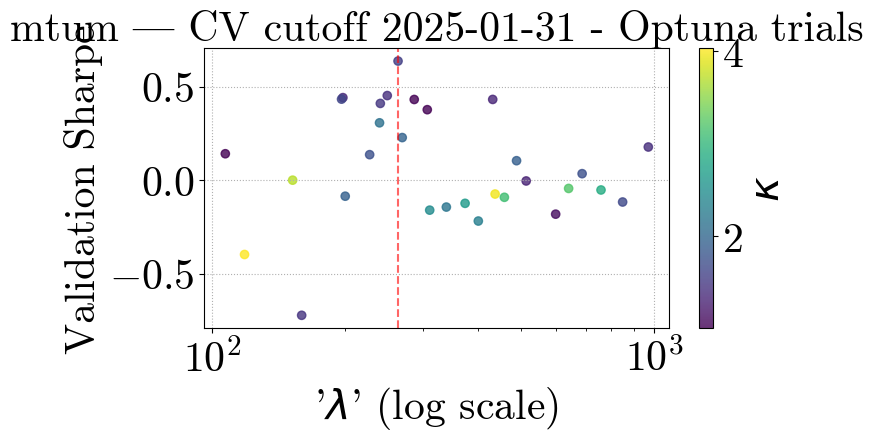

[I 2025-05-06 03:04:42,515] A new study created in memory with name: no-name-fc7e0379-40dd-47be-9d3a-748313104660
[I 2025-05-06 03:04:43,762] Trial 0 finished with value: 0.009974268393240945 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.009974268393240945.
[I 2025-05-06 03:04:44,890] Trial 1 finished with value: 0.5890471839277431 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.5890471839277431.
[I 2025-05-06 03:04:46,394] Trial 2 finished with value: -0.03243508269534547 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.5890471839277431.
[I 2025-05-06 03:04:47,944] Trial 3 finished with value: 0.034770921500916756 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.5890471839277431.
[I 2025-05-06 03:04:49,103] Trial 4 finished with value: 0.04732299155327674 an

Optuna best λ=827.2594, κ=1.7773928181108825, Sharpe=0.8402


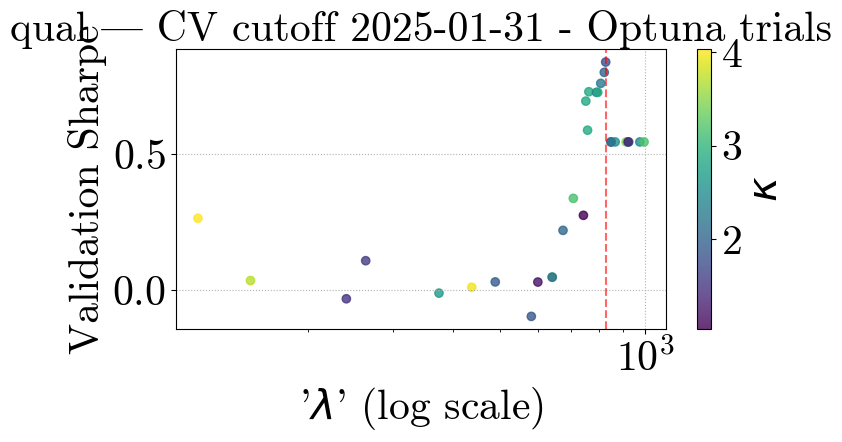

[I 2025-05-06 03:05:15,822] A new study created in memory with name: no-name-6b324dea-7c35-40f2-870e-387acd1bbf40
[I 2025-05-06 03:05:17,678] Trial 0 finished with value: 0.5807085639718884 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.5807085639718884.
[I 2025-05-06 03:05:18,003] Trial 1 finished with value: 0.5807085639718884 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.5807085639718884.
[I 2025-05-06 03:05:20,591] Trial 2 finished with value: 0.5807085639718884 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.5807085639718884.
[I 2025-05-06 03:05:23,642] Trial 3 finished with value: 0.5110507206972184 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.5807085639718884.
[I 2025-05-06 03:05:23,982] Trial 4 finished with value: 0.5807085639718884 and paramet

Optuna best λ=437.0861, κ=3.9691811987040015, Sharpe=0.5807


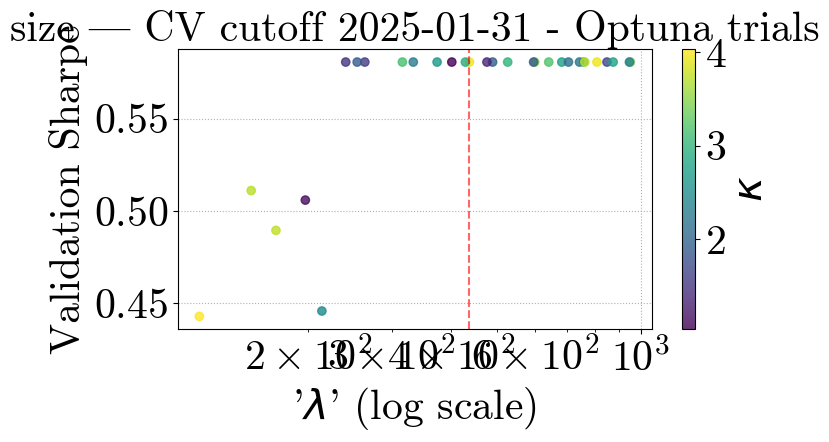

[I 2025-05-06 03:05:54,752] A new study created in memory with name: no-name-6819f0ea-ae64-4c7b-86f2-08e7e4f624ef
[I 2025-05-06 03:05:56,407] Trial 0 finished with value: 0.08167290774729274 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.08167290774729274.
[I 2025-05-06 03:05:57,696] Trial 1 finished with value: 0.21719585681917866 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.21719585681917866.
[I 2025-05-06 03:05:59,481] Trial 2 finished with value: 0.6848267924764627 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.6848267924764627.
[I 2025-05-06 03:06:01,460] Trial 3 finished with value: 0.7931847776606445 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.7931847776606445.
[I 2025-05-06 03:06:02,859] Trial 4 finished with value: 0.21719585681917866 and pa

Optuna best λ=207.8218, κ=3.620866566959224, Sharpe=0.8838


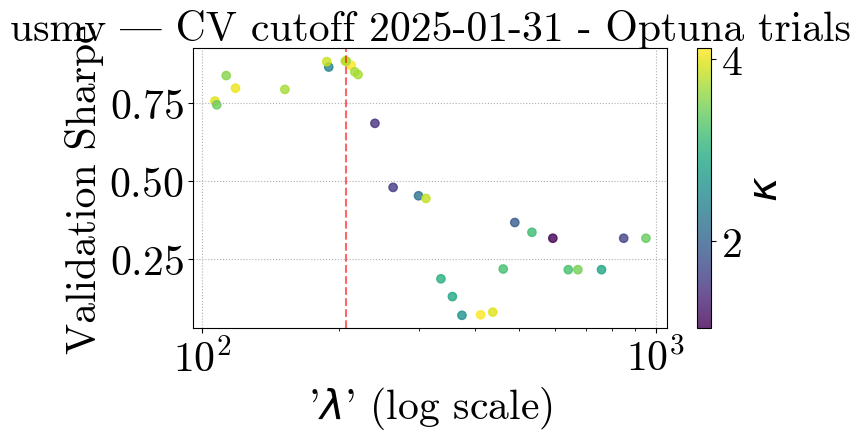

[I 2025-05-06 03:06:47,619] A new study created in memory with name: no-name-391a0ad3-a85a-4d92-ba0b-1c9531fac2aa
[I 2025-05-06 03:06:49,254] Trial 0 finished with value: 0.8703232065642238 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.8703232065642238.
[I 2025-05-06 03:06:50,605] Trial 1 finished with value: 0.8703232065642238 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.8703232065642238.
[I 2025-05-06 03:06:53,028] Trial 2 finished with value: -0.027818933584067323 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.8703232065642238.
[I 2025-05-06 03:06:54,773] Trial 3 finished with value: -0.5679834819389786 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.8703232065642238.
[I 2025-05-06 03:06:56,340] Trial 4 finished with value: 0.8703232065642238 and par

Optuna best λ=437.0861, κ=3.9691811987040015, Sharpe=0.8703


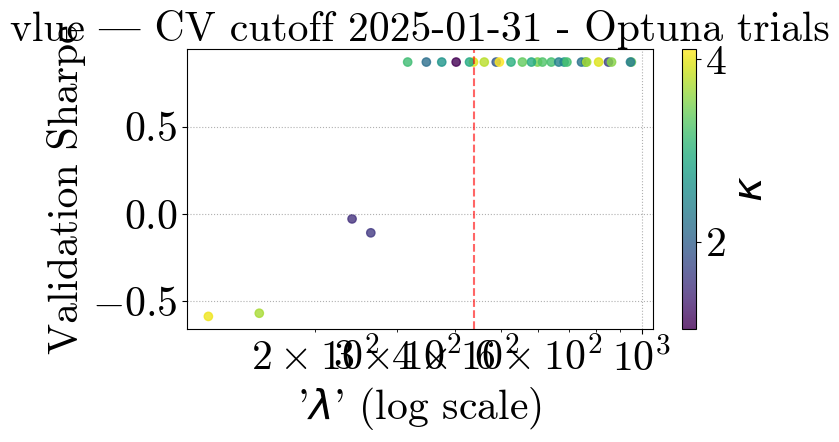

[I 2025-05-06 03:07:37,544] A new study created in memory with name: no-name-852971fa-70ab-4c1e-8ee4-a2099da4ea51
[I 2025-05-06 03:07:38,931] Trial 0 finished with value: 0.485740826656017 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.485740826656017.
[I 2025-05-06 03:07:40,228] Trial 1 finished with value: 0.485740826656017 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.485740826656017.
[I 2025-05-06 03:07:41,805] Trial 2 finished with value: 0.485740826656017 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.485740826656017.
[I 2025-05-06 03:07:44,357] Trial 3 finished with value: 0.477185247410705 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.485740826656017.
[I 2025-05-06 03:07:45,586] Trial 4 finished with value: 0.485740826656017 and parameters: {'la

Optuna best λ=437.0861, κ=3.9691811987040015, Sharpe=0.4857


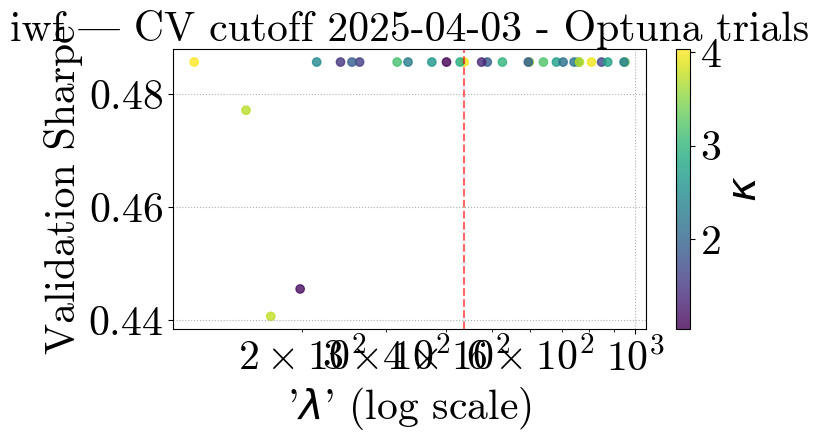

[I 2025-05-06 03:08:20,818] A new study created in memory with name: no-name-72086c31-3bf4-4992-ba62-f9bd1b7473c1
[I 2025-05-06 03:08:22,457] Trial 0 finished with value: -0.28310393559687824 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.28310393559687824.
[I 2025-05-06 03:08:23,733] Trial 1 finished with value: -0.2823543641340655 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.2823543641340655.
[I 2025-05-06 03:08:27,220] Trial 2 finished with value: 0.32475657632365845 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.32475657632365845.
[I 2025-05-06 03:08:31,125] Trial 3 finished with value: 0.13062464028410903 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.32475657632365845.
[I 2025-05-06 03:08:32,455] Trial 4 finished with value: -0.18027047770413687

Optuna best λ=240.4168, κ=1.487187364027523, Sharpe=0.3248


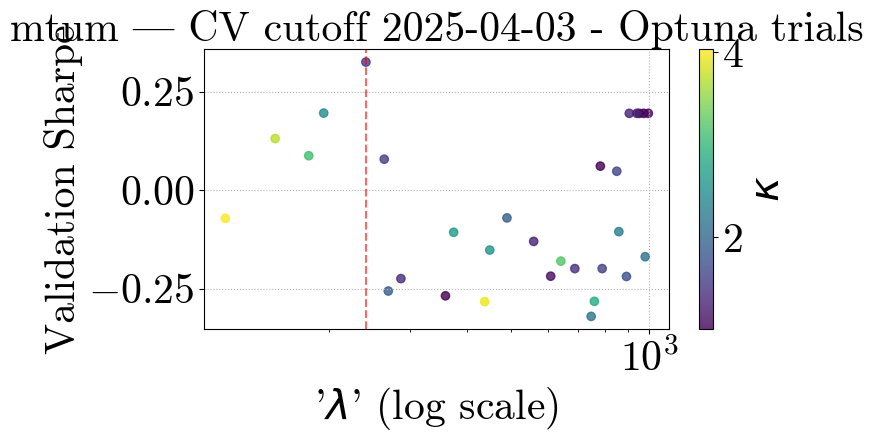

[I 2025-05-06 03:09:18,104] A new study created in memory with name: no-name-8221517e-ee2e-4a32-a1e8-93f0c1dd5f0d
[I 2025-05-06 03:09:19,965] Trial 0 finished with value: 0.1730259254361779 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.1730259254361779.
[I 2025-05-06 03:09:20,370] Trial 1 finished with value: 0.7180281425627765 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.7180281425627765.
[I 2025-05-06 03:09:21,954] Trial 2 finished with value: -0.09205487121875458 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.7180281425627765.
[I 2025-05-06 03:09:24,039] Trial 3 finished with value: 0.7320387044633501 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.7320387044633501.
[I 2025-05-06 03:09:25,284] Trial 4 finished with value: 0.8600927229711812 and param

Optuna best λ=629.8470, κ=2.2256718351156524, Sharpe=0.8996


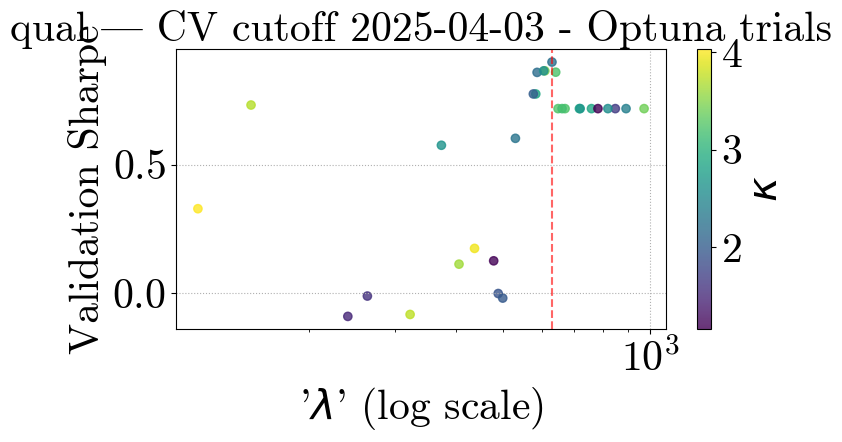

[I 2025-05-06 03:09:57,509] A new study created in memory with name: no-name-3c475e2d-2236-437f-98d3-cc28d99f0985
[I 2025-05-06 03:09:59,030] Trial 0 finished with value: 0.19736375360833708 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.19736375360833708.
[I 2025-05-06 03:09:59,419] Trial 1 finished with value: 0.19736375360833708 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.19736375360833708.
[I 2025-05-06 03:10:02,338] Trial 2 finished with value: 0.19736375360833708 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.19736375360833708.
[I 2025-05-06 03:10:06,704] Trial 3 finished with value: 0.15133401794883627 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.19736375360833708.
[I 2025-05-06 03:10:07,084] Trial 4 finished with value: 0.19736375360833708 an

Optuna best λ=437.0861, κ=3.9691811987040015, Sharpe=0.1974


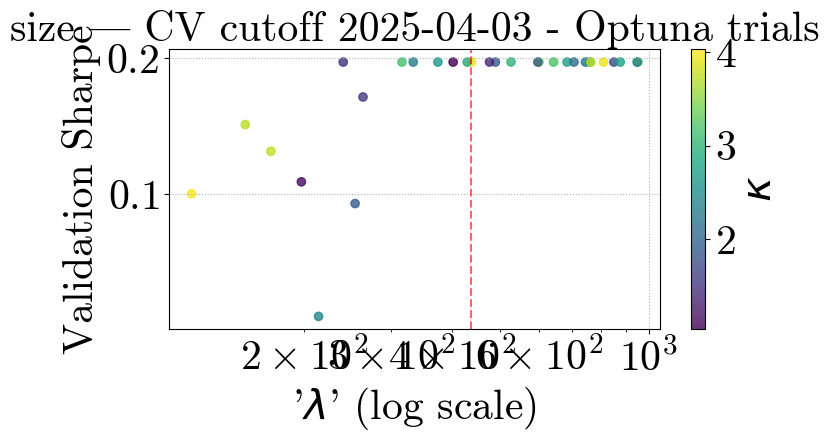

[I 2025-05-06 03:10:40,385] A new study created in memory with name: no-name-1f867360-a5b6-45cc-9b81-5f3b3157a7ee
[I 2025-05-06 03:10:42,993] Trial 0 finished with value: -0.038076520584220425 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.038076520584220425.
[I 2025-05-06 03:10:43,342] Trial 1 finished with value: -0.03807652058422031 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.03807652058422031.
[I 2025-05-06 03:10:46,136] Trial 2 finished with value: -0.038076520584220425 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.03807652058422031.
[I 2025-05-06 03:10:48,737] Trial 3 finished with value: 0.7287083172170309 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.7287083172170309.
[I 2025-05-06 03:10:49,096] Trial 4 finished with value: -0.038076520584

Optuna best λ=152.2753, κ=3.705159593645523, Sharpe=0.7287


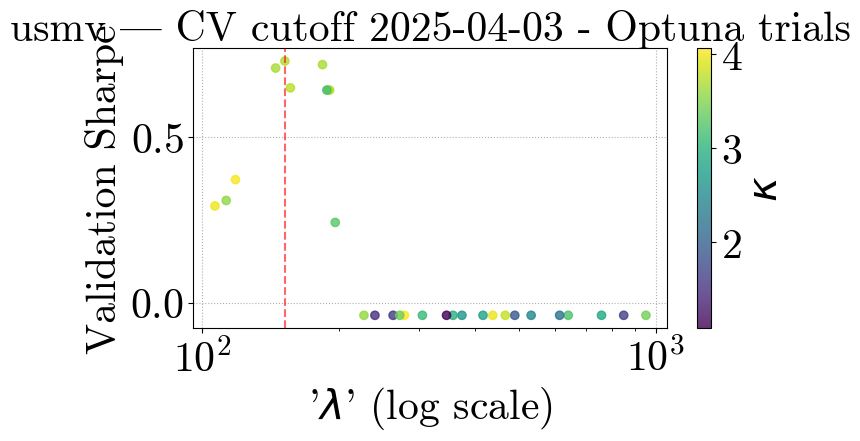

[I 2025-05-06 03:11:49,134] A new study created in memory with name: no-name-2c6f9011-424b-4225-8de7-81825ad6706d
[I 2025-05-06 03:11:50,625] Trial 0 finished with value: 0.4798767703593351 and parameters: {'lambda': 437.0861069626262, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.4798767703593351.
[I 2025-05-06 03:11:51,911] Trial 1 finished with value: 0.4798767703593351 and parameters: {'lambda': 758.7945476302646, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.4798767703593351.
[I 2025-05-06 03:11:53,734] Trial 2 finished with value: -0.002661044428187919 and parameters: {'lambda': 240.41677639819287, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.4798767703593351.
[I 2025-05-06 03:11:56,108] Trial 3 finished with value: -1.0104625903997637 and parameters: {'lambda': 152.27525095137952, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.4798767703593351.
[I 2025-05-06 03:11:57,409] Trial 4 finished with value: 0.4798767703593351 and par

Optuna best λ=437.0861, κ=3.9691811987040015, Sharpe=0.4799


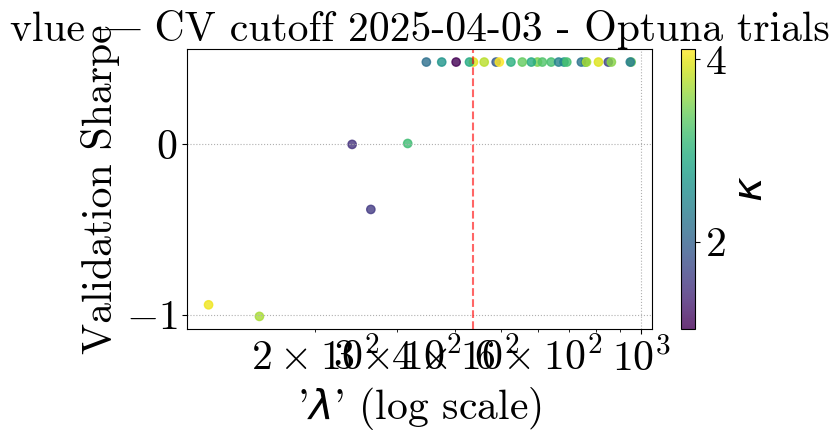

/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_53860/4276343346.py:123: UserWarning: Glyph 8212 (\N{EM DASH}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8212 (\N{EM DASH}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


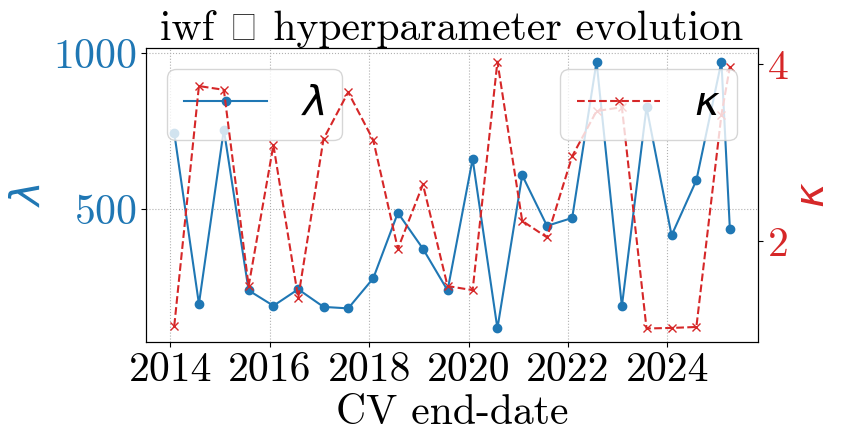

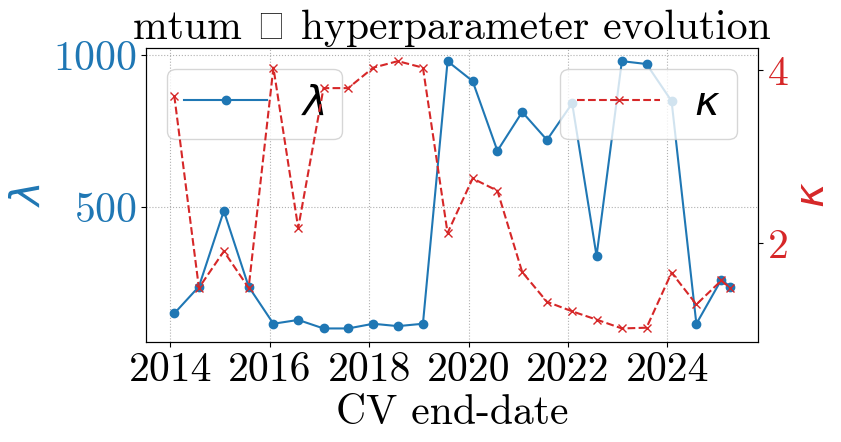

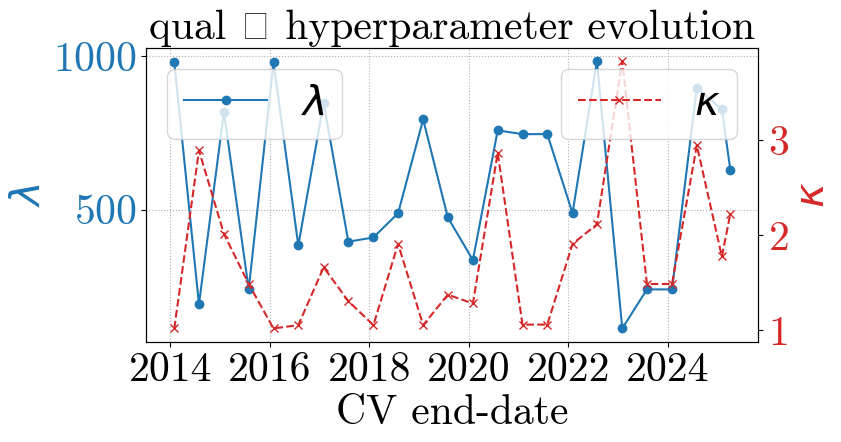

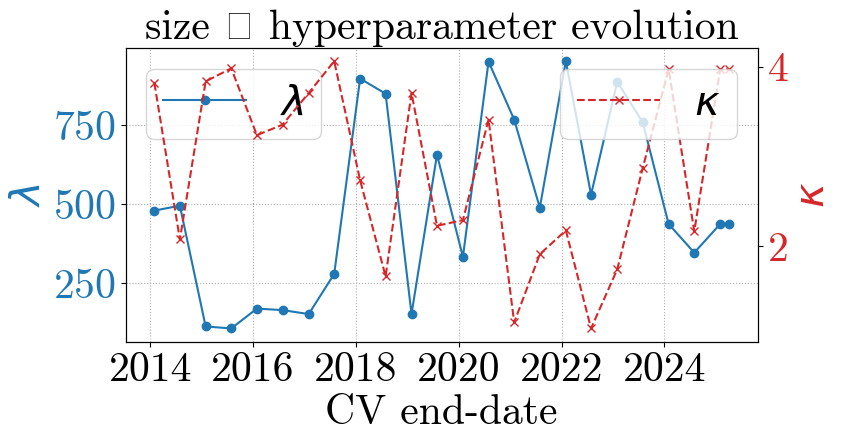

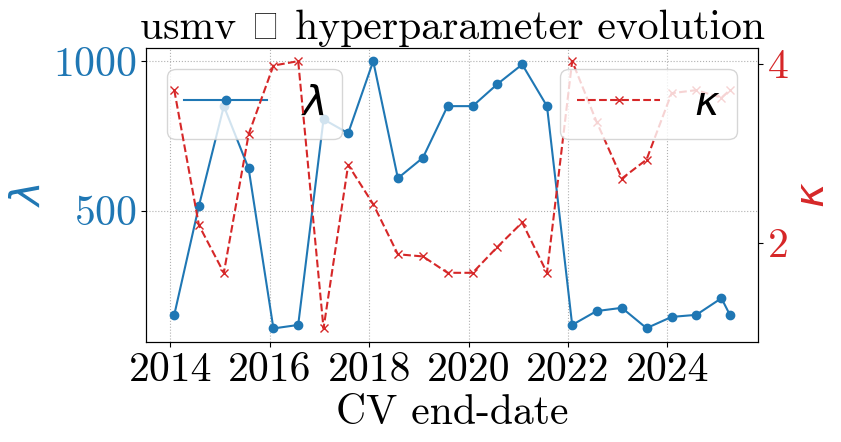

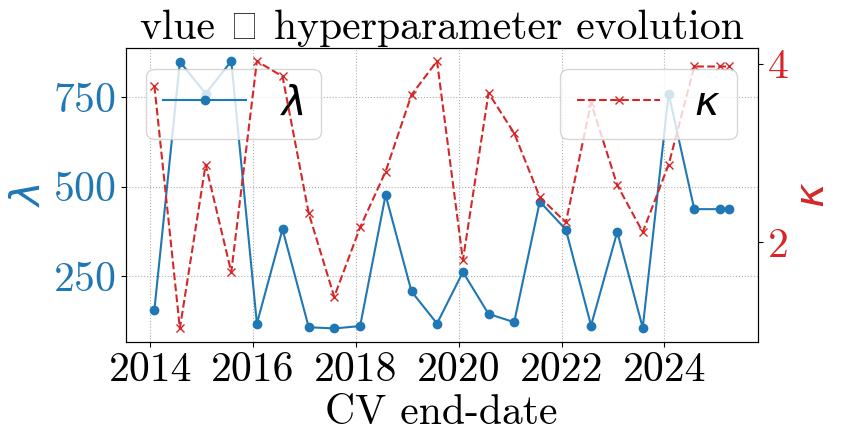

Saved tuned parameters to cv_params.parquet
         date factor  best_lambda  best_kappa
0  2014-01-31    iwf   743.966621    1.037050
6  2014-07-31    iwf   197.108102    3.753025
12 2015-01-30    iwf   755.066870    3.710179
18 2015-07-31    iwf   240.416776    1.487187
24 2016-01-29    iwf   191.150754    3.083879


In [4]:
# -------------------------  QUICK STAND‑ALONE RUN  ----------------------- #
# ---- user‑specific setup (exactly as in your original script) -------- #

# Paths & tickers -----------------------------------------------------------------------
TEST_START       = "2014-01-01"
RECROSS_VAL_FREQ = "6ME"          # six‑month‑end


script_dir = os.getcwd()
base_dir   = os.path.abspath(os.path.join(script_dir, "..", ".."))
data_dir   = os.path.join(base_dir, "data_new")

factor_file = os.path.join(data_dir, "1estimation_index_returns.csv")
market_file = os.path.join(data_dir, "1macro_data.csv")
etf_file    = os.path.join(data_dir, "2trading_etf_returns_aligned.csv")

factors = ["iwf", "mtum", "qual", "size", "usmv", "vlue"]   

# lambda_values = np.linspace(30, 400, 5)
# # kappa grid can depend on feature count; a simple fixed grid is fine
# kappa_values  = np.array([2.0, 3.0, 4.0]) # kappa = trial.suggest_int("kappa", 1, np.sqrt(17))

# ------- load full data into factor_data_dict here -------------------- #
# (use your existing MergedDataLoader logic)
factor_data_dict = {}
for fac in factors:
    data = MergedDataLoader(
                factor_file=factor_file,
                market_file=market_file,
                ver="v2",
                factor_col=fac).load()

    common_idx = (data.X.index
                    .intersection(data.ret_ser.index)
                    .intersection(data.market_ser.index))

    factor_data_dict[fac] = {
        "X":       data.X.loc[common_idx],
        "fac_ret": data.ret_ser.loc[common_idx],
        "mkt_ret": data.market_ser.loc[common_idx],
    }


master_index = factor_data_dict[factors[0]]["X"].index.sort_values()
test_index   = master_index[master_index >= TEST_START]

recross_val_boundaries = (
    test_index.to_series()
    .resample(RECROSS_VAL_FREQ)
    .last()
    .dropna()                     # Series of Timestamp objects
)
# ----------------------------------------------------------------------

cv_table = run_cv(
    factors,
    factor_data_dict,
    cv_dates=recross_val_boundaries,
    initial_train_start="2002-05-31"
)

print("Saved tuned parameters to cv_params.parquet")
print(cv_table.head())

In [ ]:
# # 1) Cast kappa to float
# cv_table["best_kappa"] = cv_table["best_kappa"].astype(float)

# # 2) (Optional) verify
# print(cv_table.dtypes)

# # 3) Save out
# cv_table.to_parquet("cv_params_bayes_v2.parquet", index=False) # v2 is the one searching from 0.1 to 1000


date           datetime64[ns]
factor                 object
best_lambda           float64
best_kappa            float64
dtype: object


In [5]:
with open("cell_output.txt", "w") as f:
    for r in records:  # or whatever your output list is
        f.write(str(r) + "\n")


NameError: name 'records' is not defined